<center>

##**MACHINE LEARNING FOR MANAGERS**

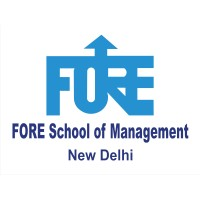




##**Project 2:**
##**Supervised Machine Learning**

**Submitted by**

Group 09

Section- K (BDA- 06)

**Group Members**

Avani Verma - 065018;
Navroop – 065039;
Kunal Taneja - 065050



**Submitted to**

Prof. Amarnath Mitra

*FORE School of Management*

Live link to DataSet - https://docs.google.com/spreadsheets/d/1OME7otpslv2-fIW_XsCvzSnXQ6BylFNjc14RglLCDTk/edit?usp=sharing

# Importing DataSet

In [ ]:
import pandas as pd
data_url = "https://docs.google.com/spreadsheets/d/1OME7otpslv2-fIW_XsCvzSnXQ6BylFNjc14RglLCDTk/edit?usp=sharing"
data_url_extracted = data_url.replace("/edit?usp=sharing", "/export?format=csv")
df = pd.read_csv(data_url_extracted)
df.head()

,Product Name,Category,Daily Production/Quantity,Transportation Method,Vehicle Type,Vehicle Capacity (kg/ton),No. of Vehicles Used Per Day,Trip Frequency,Average Distance Travelled (km),Temperature Maintained (°C),...,Is Real-time Tracking Used?,Tracking Method,Data Collected,Initial Quality Grade,Shelf Life (Days),Spoilage Percentage (%),Reasons for Spoilage,Transportation Cost per Trip,Storage Cost,Wastage Cost
0,Cluster Beans,Vegetable,1342,By Road,Mini Truck,1.0,1,1,114,10,...,Yes,RFID + GPS,Location,AA,12,1.6,Pest damage,28192,11237,1470
1,Dry Chillies,Spice,23934,By Road,Mini Truck,1.5,4,2,87,26,...,No,NaN,Quantity,B,189,2.0,Delay in transit,26896,10075,3606
2,Elephant Yam,Root Crop,14384,By Road,Bulk Truck,28.0,2,3,236,2,...,Yes,GPS,Location,A-,9,9.7,Pest damage,13822,6747,2921
3,Drumstick,Vegetable,15799,By Road,Mini Refrigerated Van,1.0,4,1,299,2,...,Yes,GPS + IoT,"Temp, humidity, location",B+,5,7.6,Mechanical damage,16330,11282,3345
4,Banana,Fruit,1761,By Road,Mini Refrigerated Van,1.0,4,2,224,18,...,No,NaN,Quantity,B,18,3.0,Improper stacking,8347,8036,497


#Data Description

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 32 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   Product Name                     100000 non-null  object 
 1   Category                         100000 non-null  object 
 2   Daily Production/Quantity        100000 non-null  int64  
 3   Transportation Method            100000 non-null  object 
 4   Vehicle Type                     100000 non-null  object 
 5   Vehicle Capacity (kg/ton)        100000 non-null  float64
 6   No. of Vehicles Used Per Day     100000 non-null  int64  
 7   Trip Frequency                   100000 non-null  int64  
 8   Average Distance Travelled (km)  100000 non-null  int64  
 9   Temperature Maintained (°C)      100000 non-null  int64  
 10  Humidity Maintained (%)          100000 non-null  int64  
 11  Packaging Method                 100000 non-null  object 
 12  Tim

In [ ]:
numerical_cols = df.select_dtypes(include=['number']).columns.tolist()
object_cols = df.select_dtypes(include=['object']).columns.tolist()

print("Non-Categorical Variables (Numerical):")
print(numerical_cols)
print("\n")

print("Categorical Variables (Object Type):")

nominal_cols = []
ordinal_cols = []

nominal_cols = [
    'Product Name', 'Category', 'Transportation Method', 'Vehicle Type',
    'Packaging Method',
    'Source Location', 'Destination Location', 'Who Receives the Goods?',
    'End User Type', 'Tracking Method', 'Data Collected', 'Reasons for Spoilage'
]

ordinal_cols = [
    'Initial Quality Grade', 'Time of Harvest', 'Time to Loading', 'Is Real-time Tracking Used?'
]

print("  Nominal Categorical Variables:")
print(nominal_cols)
print("\n  Ordinal Categorical Variables:")
print(ordinal_cols)


Non-Categorical Variables (Numerical):
['Daily Production/Quantity', 'Vehicle Capacity (kg/ton)', 'No. of Vehicles Used Per Day', 'Trip Frequency', 'Average Distance Travelled (km)', 'Temperature Maintained (°C)', 'Humidity Maintained (%)', 'Transport Duration (hours)', 'Unloading Time', 'Total Supply Chain Time', 'Daily Demand', 'Shelf Life (Days)', 'Spoilage Percentage (%)', 'Transportation Cost per Trip', 'Storage Cost', 'Wastage Cost']


Categorical Variables (Object Type):
  Nominal Categorical Variables:
['Product Name', 'Category', 'Transportation Method', 'Vehicle Type', 'Packaging Method', 'Source Location', 'Destination Location', 'Who Receives the Goods?', 'End User Type', 'Tracking Method', 'Data Collected', 'Reasons for Spoilage']

  Ordinal Categorical Variables:
['Initial Quality Grade', 'Time of Harvest', 'Time to Loading', 'Is Real-time Tracking Used?']


# GROUP MEMBER 1 Avani Verma - 065018


## Taking Random Sample

In [ ]:
import pandas as pd
data_url = "https://docs.google.com/spreadsheets/d/1OME7otpslv2-fIW_XsCvzSnXQ6BylFNjc14RglLCDTk/edit?usp=sharing"
data_url_extracted = data_url.replace("/edit?usp=sharing", "/export?format=csv")
df = pd.read_csv(data_url_extracted)
print("DataFrame 'df' re-imported successfully.")


DataFrame 'df' re-imported successfully.


In [ ]:
av018_ = df.sample(n=5001, random_state=18)
print(av018_.head())

Sample 'av018_' created successfully. First 10 rows:
                 Product Name         Category  Daily Production/Quantity  \
29982             Water Melon            Fruit                       1236   
6395   Bhindi (Ladies Finger)        Vegetable                      21705   
48206               Drumstick        Vegetable                      23029   
37505        Coriander Leaves  Leafy Vegetable                      16027   
23795            Elephant Yam        Root Crop                       2716   

      Transportation Method Vehicle Type  Vehicle Capacity (kg/ton)  \
29982               By Road   Open Truck                       12.0   
6395                By Road   Mini Truck                        1.0   
48206               By Road   Bulk Truck                       28.0   
37505               By Road   Bulk Truck                       28.0   
23795               By Road   Bulk Truck                       28.0   

       No. of Vehicles Used Per Day  Trip Frequency  \
29

## Data Preprocessing

In [ ]:
print("Original shape of av018_:", av018_.shape)

# 1. Calculate the percentage of missing values for each column
missing_percentages_cols = av018_.isnull().sum() / len(av018_) * 100

# Identify columns where missing values are 50% or more
columns_to_drop = missing_percentages_cols[missing_percentages_cols >= 50].index.tolist()

# 2. Drop identified columns
if columns_to_drop:
    print(f"\nColumns to be dropped (>=50% missing): {columns_to_drop}")
    av018_ = av018_.drop(columns=columns_to_drop)
    print("Columns dropped successfully.")
else:
    print("\nNo columns with 50% or more missing values found.")

print("Shape of av018_ after column removal:", av018_.shape)

Original shape of av018_: (5001, 32)

No columns with 50% or more missing values found.
Shape of av018_ after column removal: (5001, 32)


In [ ]:
print("Shape of av018_ before row removal:", av018_.shape)

# 3. Calculate the percentage of missing values for each row
missing_percentages_rows = av018_.isnull().sum(axis=1) / len(av018_.columns) * 100

# Identify rows where missing values are 50% or more
rows_to_drop = missing_percentages_rows[missing_percentages_rows >= 50].index.tolist()

# 4. Drop identified rows
if rows_to_drop:
    print(f"\nRows to be dropped (>=50% missing): {len(rows_to_drop)} rows")
    av018_ = av018_.drop(index=rows_to_drop)
    print("Rows dropped successfully.")
else:
    print("\nNo rows with 50% or more missing values found.")

# 5. Print the shape of the av018_ DataFrame after row removal
print("Shape of av018_ after row removal:", av018_.shape)

# 6. Print the total count of missing values per column in the modified av018_ DataFrame for verification
print("\nMissing values per column in the modified av018_:")
print(av018_.isnull().sum())

Shape of av018_ before row removal: (5001, 32)

No rows with 50% or more missing values found.
Shape of av018_ after row removal: (5001, 32)

Missing values per column in the modified av018_:
Product Name                          0
Category                              0
Daily Production/Quantity             0
Transportation Method                 0
Vehicle Type                          0
Vehicle Capacity (kg/ton)             0
No. of Vehicles Used Per Day          0
Trip Frequency                        0
Average Distance Travelled (km)       0
Temperature Maintained (°C)           0
Humidity Maintained (%)               0
Packaging Method                      0
Time of Harvest                       0
Time to Loading                       0
Transport Duration (hours)            0
Unloading Time                        0
Total Supply Chain Time               0
Source Location                       0
Destination Location                  0
Who Receives the Goods?               0
Daily De

In [ ]:
print("Missing values in av018_ before imputation:")
print(av018_.isnull().sum()[av018_.isnull().sum() > 0])

# Identify numerical and categorical columns
numerical_cols = av018_.select_dtypes(include=['number']).columns.tolist()
object_cols = av018_.select_dtypes(include=['object']).columns.tolist()

# Impute numerical columns with mean
for col in numerical_cols:
    if av018_[col].isnull().any():
        av018_[col].fillna(av018_[col].mean(), inplace=True)

# Impute categorical columns with mode
for col in object_cols:
    if av018_[col].isnull().any():
        # Use .iloc[0] to get the first mode in case of multiple modes
        av018_[col].fillna(av018_[col].mode()[0], inplace=True)

print("\nMissing values in av018_ after imputation:")
print(av018_.isnull().sum()[av018_.isnull().sum() > 0])


Missing values in av018_ before imputation:
Tracking Method    2462
dtype: int64

Missing values in av018_ after imputation:
Series([], dtype: int64)


/tmp/ipython-input-3687591214.py:17: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  av018_[col].fillna(av018_[col].mode()[0], inplace=True)


In [ ]:
from sklearn.preprocessing import LabelEncoder

ordinal_cols_to_label_encode = ['Initial Quality Grade', 'Is Real-time Tracking Used?']

print("--- Applying Label Encoding ---")

for col in ordinal_cols_to_label_encode:
    if col in av018_.columns and av018_[col].dtype == 'object':
        le = LabelEncoder()
        av018_[col] = le.fit_transform(av018_[col])
        print(f"Label Encoded '{col}'. First 5 values:\n{av018_[col].head()}\n")
    else:
        print(f"Warning: Column '{col}' not found or not object type for Label Encoding. Skipping.\n")

print("Label Encoding completed.")

--- Applying Label Encoding ---
Label Encoded 'Initial Quality Grade'. First 5 values:
29982    0
6395     4
48206    1
37505    4
23795    1
Name: Initial Quality Grade, dtype: int64

Label Encoded 'Is Real-time Tracking Used?'. First 5 values:
29982    1
6395     0
48206    1
37505    0
23795    1
Name: Is Real-time Tracking Used?, dtype: int64

Label Encoding completed.


In [ ]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
import pandas as pd

# Define the list of nominal categorical columns for One-Hot Encoding
nominal_cols_to_ohe = [
    'Product Name', 'Category', 'Transportation Method', 'Vehicle Type',
    'Packaging Method', 'Source Location', 'Destination Location',
    'Who Receives the Goods?', 'End User Type', 'Tracking Method',
    'Data Collected', 'Reasons for Spoilage', 'Time of Harvest', 'Time to Loading'
]

# Filter to ensure only columns present in av018_ are processed
nominal_cols_to_ohe = [col for col in nominal_cols_to_ohe if col in av018_.columns]

print("--- Applying One-Hot Encoding ---")

# Create a ColumnTransformer to apply OneHotEncoder only to nominal columns
# and leave other columns (numerical and already label-encoded ordinal) as is
preprocessor_ohe = ColumnTransformer(
    transformers=[
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False), nominal_cols_to_ohe)
    ],
    remainder='passthrough' # Keep other columns (numerical and label-encoded ordinal) as they are
)

# Apply the transformation
av018_processed_array = preprocessor_ohe.fit_transform(av018_)

# Get feature names for the transformed columns
feature_names_ohe = preprocessor_ohe.get_feature_names_out()

# Convert the processed array back to a DataFrame
av018_processed = pd.DataFrame(av018_processed_array, columns=feature_names_ohe, index=av018_.index)

print(f"One-Hot Encoding completed. New shape: {av018_processed.shape}")
print("First 5 rows of av018_processed after One-Hot Encoding:")
print(av018_processed.head())

# Update av018_ to the processed DataFrame
av018_ = av018_processed


--- Applying One-Hot Encoding ---
One-Hot Encoding completed. New shape: (5001, 176)
First 5 rows of av018_processed after One-Hot Encoding:
       onehot__Product Name_Apple  onehot__Product Name_Banana  \
29982                         0.0                          0.0   
6395                          0.0                          0.0   
48206                         0.0                          0.0   
37505                         0.0                          0.0   
23795                         0.0                          0.0   

       onehot__Product Name_Banana - Green  \
29982                                  0.0   
6395                                   0.0   
48206                                  0.0   
37505                                  0.0   
23795                                  0.0   

       onehot__Product Name_Bhindi (Ladies Finger)  \
29982                                          0.0   
6395                                           1.0   
48206                  

In [ ]:
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import pandas as pd

# Identify numerical columns for scaling/transformation (these are prefixed with 'remainder__' after ColumnTransformer)
numerical_cols_for_processing = [col for col in av018_.columns if col.startswith('remainder__') and av018_[col].dtype != 'object']

print("--- Data Rescaling and Transformation ---\n")

# --- 1. Standardization (Z-score scaling) ---
print("1. Applying Standardization (Z-score scaling):")
scaler = StandardScaler()
av018_standardized = av018_.copy() # Create a copy to store standardized data
av018_standardized[numerical_cols_for_processing] = scaler.fit_transform(av018_standardized[numerical_cols_for_processing])
print("First 5 rows of data after Standardization (numerical columns only):")
print(av018_standardized[numerical_cols_for_processing].head())
print("\n")

# --- 2. Normalization (Min-Max Scaling) ---
print("2. Applying Normalization (Min-Max Scaling):")
minmax_scaler = MinMaxScaler()
av018_minmax_scaled = av018_.copy() # Create a fresh copy for min-max scaling
av018_minmax_scaled[numerical_cols_for_processing] = minmax_scaler.fit_transform(av018_minmax_scaled[numerical_cols_for_processing])
print("First 5 rows of data after Min-Max Scaling (numerical columns only):")
print(av018_minmax_scaled[numerical_cols_for_processing].head())
print("\n")

# --- 3. Log Transformation ---
# Select columns that are typically positively skewed and have non-negative values for log transformation.
# Based on common data characteristics, 'Daily Production/Quantity', 'Spoilage Percentage (%)',
# 'Shelf Life (Days)', 'Transportation Cost per Trip', 'Storage Cost', 'Wastage Cost' are good candidates.
# Use log1p (log(1+x)) to handle potential zero values gracefully.

log_transform_cols = [
    'remainder__Daily Production/Quantity',
    'remainder__Vehicle Capacity (kg/ton)', # Can be skewed
    'remainder__Average Distance Travelled (km)', # Can be skewed
    'remainder__Transport Duration (hours)', # Can be skewed
    'remainder__Unloading Time', # Can be skewed
    'remainder__Total Supply Chain Time', # Can be skewed
    'remainder__Daily Demand',
    'remainder__Shelf Life (Days)',
    'remainder__Spoilage Percentage (%)',
    'remainder__Transportation Cost per Trip',
    'remainder__Storage Cost',
    'remainder__Wastage Cost'
]

# Filter to ensure columns exist in the DataFrame
log_transform_cols = [col for col in log_transform_cols if col in av018_.columns]

av018_log_transformed = av018_.copy() # Create a fresh copy for log transformation
print("3. Applying Log Transformation (np.log1p) to selected columns:")
for col in log_transform_cols:
    # Ensure values are non-negative before applying log1p (which handles 0+1)
    av018_log_transformed[col] = np.log1p(av018_log_transformed[col])

print("First 5 rows of data after Log Transformation (selected columns only):")
print(av018_log_transformed[log_transform_cols].head())

# Update av018_ to the fully processed DataFrame (e.g., standardized for general use)
# For the final summary, we'll indicate all transformations performed.
av018_ = av018_standardized.copy()


--- Data Rescaling and Transformation ---

1. Applying Standardization (Z-score scaling):
First 5 rows of data after Standardization (numerical columns only):
       remainder__Daily Production/Quantity  \
29982                             -1.654000   
6395                               1.252933   
48206                              1.440963   
37505                              0.446564   
23795                             -1.443815   

       remainder__Vehicle Capacity (kg/ton)  \
29982                              0.578398   
6395                              -1.004679   
48206                              2.881055   
37505                              2.881055   
23795                              2.881055   

       remainder__No. of Vehicles Used Per Day  remainder__Trip Frequency  \
29982                                 1.399512                  -0.010324   
6395                                 -0.708608                   1.218919   
48206                                 1.3995

In [ ]:
print("\n--- Correlation Analysis for Scaled Numerical Features (from av018_) ---")

if scaled_numerical_features:
    # Pearson Correlation
    print("\nPearson Correlation Matrix for Scaled Numerical Features:")
    pearson_corr = av018_[scaled_numerical_features].corr(method='pearson')
    print(pearson_corr)

    # Spearman's Rank Correlation
    print("\nSpearman's Rank Correlation Matrix for Scaled Numerical Features:")
    spearman_corr = av018_[scaled_numerical_features].corr(method='spearman')
    print(spearman_corr)

    # Kendall's Tau Correlation
    print("\nKendall's Tau Correlation Matrix for Scaled Numerical Features:")
    kendall_corr = av018_[scaled_numerical_features].corr(method='kendall')
    print(kendall_corr)
else:
    print("\nNo scaled numerical features found for correlation analysis.")
print("-" * 50)


--- Correlation Analysis for Scaled Numerical Features (from av018_) ---

Pearson Correlation Matrix for Scaled Numerical Features:
                                            remainder__Daily Production/Quantity  \
remainder__Daily Production/Quantity                                    1.000000   
remainder__Vehicle Capacity (kg/ton)                                    0.011692   
remainder__No. of Vehicles Used Per Day                                 0.024153   
remainder__Trip Frequency                                               0.024513   
remainder__Average Distance Travelled (km)                              0.001372   
remainder__Temperature Maintained (°C)                                 -0.003815   
remainder__Humidity Maintained (%)                                     -0.010719   
remainder__Transport Duration (hours)                                   0.020570   
remainder__Unloading Time                                              -0.009307   
remainder__Total Supply Cha

## Data Description

In [ ]:
one_hot_encoded_nominal_features = []
scaled_numerical_features = []
label_encoded_ordinal_features = []

# The list of columns that were originally label-encoded
# This was previously 'ordinal_cols_to_label_encode'
ordinal_cols_to_label_encode_original = ['Initial Quality Grade', 'Is Real-time Tracking Used?']

for col in av018_.columns:
    if col.startswith('onehot__'):
        one_hot_encoded_nominal_features.append(col)
    elif col.startswith('remainder__'):
        # Extract the original column name
        original_col_name = col.replace('remainder__', '')
        if original_col_name in ordinal_cols_to_label_encode_original:
            label_encoded_ordinal_features.append(col)
        else:
            scaled_numerical_features.append(col)

print("--- Feature Type Segregation ---")
print(f"\nOne-Hot Encoded Nominal Features (Count: {len(one_hot_encoded_nominal_features)}): ")
print(one_hot_encoded_nominal_features[:5], "...") # Print first 5 for sample

print(f"\nScaled Numerical Features (Count: {len(scaled_numerical_features)}): ")
print(scaled_numerical_features[:5], "...")

print(f"\nLabel Encoded Ordinal Features (Count: {len(label_encoded_ordinal_features)}): ")
print(label_encoded_ordinal_features[:5], "...")

--- Feature Type Segregation ---

One-Hot Encoded Nominal Features (Count: 158): 
['onehot__Product Name_Apple', 'onehot__Product Name_Banana', 'onehot__Product Name_Banana - Green', 'onehot__Product Name_Bhindi (Ladies Finger)', 'onehot__Product Name_Bottle Gourd'] ...

Scaled Numerical Features (Count: 16): 
['remainder__Daily Production/Quantity', 'remainder__Vehicle Capacity (kg/ton)', 'remainder__No. of Vehicles Used Per Day', 'remainder__Trip Frequency', 'remainder__Average Distance Travelled (km)'] ...

Label Encoded Ordinal Features (Count: 2): 
['remainder__Is Real-time Tracking Used?', 'remainder__Initial Quality Grade'] ...


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer
from scipy import stats

# Assuming 'df' is already loaded from the previous successful cell (c2-gmhU5md3I)
# Create a fresh sample for av018_ from the existing 'df' for consistent preprocessing
av018_ = df.sample(n=5001, random_state=18).copy() # Use .copy() to avoid SettingWithCopyWarning

# --- Missing Data Handling ---
# No columns/rows with >= 50% missing values were found in previous steps.
# Impute remaining missing values
numerical_cols_pre_encoding = av018_.select_dtypes(include=['number']).columns.tolist()
object_cols_pre_encoding = av018_.select_dtypes(include=['object']).columns.tolist()

for col in numerical_cols_pre_encoding:
    if av018_[col].isnull().any():
        av018_[col] = av018_[col].fillna(av018_[col].mean())

for col in object_cols_pre_encoding:
    if av018_[col].isnull().any():
        av018_[col] = av018_[col].fillna(av018_[col].mode()[0])

# --- Encoding Categorical Variables ---
ordinal_cols_to_label_encode_original = ['Initial Quality Grade', 'Is Real-time Tracking Used?']
nominal_cols_to_ohe_original = [
    'Product Name', 'Category', 'Transportation Method', 'Vehicle Type',
    'Packaging Method', 'Source Location', 'Destination Location',
    'Who Receives the Goods?', 'End User Type', 'Tracking Method',
    'Data Collected', 'Reasons for Spoilage', 'Time of Harvest', 'Time to Loading'
]

# Create a copy for integer label-encoded values for value_counts later
av018_integer_encoded_ordinals = av018_.copy() # Make a copy before label encoding in the main df
for col in ordinal_cols_to_label_encode_original:
    if col in av018_integer_encoded_ordinals.columns and av018_integer_encoded_ordinals[col].dtype == 'object':
        le = LabelEncoder()
        av018_integer_encoded_ordinals[col] = le.fit_transform(av018_integer_encoded_ordinals[col])

# Apply Label Encoding to ordinal columns in the main DataFrame
for col in ordinal_cols_to_label_encode_original:
    if col in av018_.columns and av018_[col].dtype == 'object':
        le = LabelEncoder()
        av018_[col] = le.fit_transform(av018_[col])

# Apply One-Hot Encoding and pass through other columns (numerical and label-encoded ordinal)
nominal_cols_to_ohe_filtered = [col for col in nominal_cols_to_ohe_original if col in av018_.columns]

preprocessor_ohe = ColumnTransformer(
    transformers=[
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False), nominal_cols_to_ohe_filtered)
    ],
    remainder='passthrough'
)

av018_processed_array = preprocessor_ohe.fit_transform(av018_)
feature_names_ohe = preprocessor_ohe.get_feature_names_out()
av018_processed = pd.DataFrame(av018_processed_array, columns=feature_names_ohe, index=av018_.index)

# --- Scaling Numerical and Label-Encoded Ordinal Variables (Standardization) ---
# Identify columns that are numerical and thus need scaling (all remainder__ columns are numerical now, including label-encoded ordinals)
numerical_cols_for_processing = [col for col in av018_processed.columns if col.startswith('remainder__') and av018_processed[col].dtype != 'object']

scaler = StandardScaler()
av018_standardized = av018_processed.copy()
av018_standardized[numerical_cols_for_processing] = scaler.fit_transform(av018_standardized[numerical_cols_for_processing])

av018_ = av018_standardized.copy() # This is the final av018_ DataFrame as per the last step.

print("\n--- Descriptive Statistics for Label-Encoded Ordinal Features (from integer-encoded values) ---")
print("Note: Statistics are derived from the integer-encoded version of these features (before final scaling) for meaningful category counts.")

for col_original in ordinal_cols_to_label_encode_original:
    print(f"\n--- Descriptive Statistics for '{col_original}' ---")

    # Use the av018_integer_encoded_ordinals DataFrame for these stats
    data = av018_integer_encoded_ordinals[col_original]

    counts = data.value_counts()
    proportions = data.value_counts(normalize=True)

    print("\nValue Counts (Count and Frequency):")
    print(counts)

    print("\nProportions:")
    print(proportions)

    highest_category = counts.index[0]
    lowest_category = counts.index[-1]
    print(f"\nHighest Frequency Encoded Value: '{highest_category}' (Count: {counts.iloc[0]})")
    print(f"Lowest Frequency Encoded Value: '{lowest_category}' (Count: {counts.iloc[-1]})\n")

    ranks = counts.rank(method='dense', ascending=False)
    ranked_categories = pd.DataFrame({'Count': counts, 'Rank': ranks})
    print("Ranked Encoded Values by Frequency:")
    print(ranked_categories.sort_values(by='Rank'))
print("-" * 50)



--- Descriptive Statistics for Label-Encoded Ordinal Features (from integer-encoded values) ---
Note: Statistics are derived from the integer-encoded version of these features (before final scaling) for meaningful category counts.

--- Descriptive Statistics for 'Initial Quality Grade' ---

Value Counts (Count and Frequency):
Initial Quality Grade
3    1023
4    1014
2     990
0     988
1     986
Name: count, dtype: int64

Proportions:
Initial Quality Grade
3    0.204559
4    0.202759
2    0.197960
0    0.197560
1    0.197161
Name: proportion, dtype: float64

Highest Frequency Encoded Value: '3' (Count: 1023)
Lowest Frequency Encoded Value: '1' (Count: 986)

Ranked Encoded Values by Frequency:
                       Count  Rank
Initial Quality Grade             
3                       1023   1.0
4                       1014   2.0
2                        990   3.0
0                        988   4.0
1                        986   5.0

--- Descriptive Statistics for 'Is Real-time Track

In [ ]:
print("\n--- Descriptive Statistics for One-Hot Encoded Nominal Features ---")

# To identify overall most/least frequent categories, we'll iterate through original nominal groups
# The `preprocessor_ohe.named_transformers_['onehot'].get_feature_names_out()` gives this structure.
nominal_category_counts = {}
for col in one_hot_encoded_nominal_features:
    count_positive = av018_[col].sum() # Count of 1s
    proportion_positive = count_positive / len(av018_)
    nominal_category_counts[col] = {'count': count_positive, 'proportion': proportion_positive}

# Convert to DataFrame for easier sorting
nominal_counts_df = pd.DataFrame.from_dict(nominal_category_counts, orient='index')
nominal_counts_df.index.name = 'One-Hot Feature'
nominal_counts_df = nominal_counts_df.sort_values(by='count', ascending=False)

print("\nCounts and Proportions for One-Hot Encoded Features (Top 10):")
print(nominal_counts_df.head(10))

print("\nCounts and Proportions for One-Hot Encoded Features (Bottom 10):")
print(nominal_counts_df.tail(10))

print("\nMost frequent one-hot encoded feature overall:")
print(nominal_counts_df.iloc[0])
print("\nLeast frequent one-hot encoded feature overall:")
print(nominal_counts_df.iloc[-1])
print("-" * 50)


--- Descriptive Statistics for One-Hot Encoded Nominal Features ---

Counts and Proportions for One-Hot Encoded Features (Top 10):
                                                  count  proportion
One-Hot Feature                                                    
onehot__Transportation Method_By Road            5001.0    1.000000
onehot__Tracking Method_GPS + Temp Logger        3116.0    0.623075
onehot__Data Collected_Quantity                  2462.0    0.492302
onehot__Category_Vegetable                       1832.0    0.366327
onehot__Data Collected_Temp, humidity, location  1282.0    0.256349
onehot__Data Collected_Location                  1257.0    0.251350
onehot__Category_Fruit                           1235.0    0.246951
onehot__End User Type_Processors                 1023.0    0.204559
onehot__End User Type_Retailers                  1013.0    0.202559
onehot__End User Type_Feed Manufacturers          992.0    0.198360

Counts and Proportions for One-Hot Encoded Features

In [ ]:
print("\n--- Correlation Analysis for Categorical Features ---")
print("Note: Calculating Spearman's Rank Correlation and Kendall's Tau Correlation between scaled label-encoded ordinal features and all other scaled numerical features (including other scaled label-encoded ordinals).")
print("These correlations are computed on the scaled representations available in `av018_`.")

# Combine all numerical-like features for this correlation analysis
all_numerical_like_features = scaled_numerical_features + label_encoded_ordinal_features

# For ordinal features, we select them from the final av018_ which is standardized
ordinal_features_for_corr = [f'remainder__{col}' for col in ordinal_cols_to_label_encode_original if f'remainder__{col}' in av018_.columns]
other_numerical_features_for_corr = [col for col in scaled_numerical_features if col not in ordinal_features_for_corr] # All remainder__ that aren't the ordinals

if ordinal_features_for_corr:
    # Spearman's Rank Correlation
    print("\nSpearman's Rank Correlation between Label-Encoded Ordinals and other Scaled Numerical Features:")
    for ordinal_col in ordinal_features_for_corr:
        correlations = av018_[other_numerical_features_for_corr + [ordinal_col]].corr(method='spearman')[ordinal_col].drop(ordinal_col).sort_values(ascending=False)
        print(f"\nCorrelations with '{ordinal_col}':")
        print(correlations)

    # Kendall's Tau Correlation
    print("\nKendall's Tau Correlation between Label-Encoded Ordinals and other Scaled Numerical Features:")
    for ordinal_col in ordinal_features_for_corr:
        correlations = av018_[other_numerical_features_for_corr + [ordinal_col]].corr(method='kendall')[ordinal_col].drop(ordinal_col).sort_values(ascending=False)
        print(f"\nCorrelations with '{ordinal_col}':")
        print(correlations)
else:
    print("\nNo label-encoded ordinal features found for specific correlation analysis.")

print("\nNote regarding interpretation of correlations involving one-hot encoded nominal features:")
print("One-hot encoded features are binary (0 or 1). While Pearson, Spearman, and Kendall correlations can technically be computed with these, their interpretation can be nuanced.")
print("- **Pearson Correlation** for binary variables is equivalent to the phi coefficient, measuring association.")
print("- **Spearman's Rank and Kendall's Tau Correlation** for binary variables primarily assess monotonic relationships, but given the limited range (0, 1), they mostly indicate the extent to which two binary variables tend to be present or absent together. They are not as directly interpretable for complex categorical relationships.")
print("- For a more robust analysis of association between nominal categorical variables or between nominal and numerical variables, methods like Chi-squared tests (for nominal-nominal) or ANOVA/t-tests (for nominal-numerical) are often preferred.")
print("-" * 50)


--- Correlation Analysis for Categorical Features ---
Note: Calculating Spearman's Rank Correlation and Kendall's Tau Correlation between scaled label-encoded ordinal features and all other scaled numerical features (including other scaled label-encoded ordinals).
These correlations are computed on the scaled representations available in `av018_`.

Spearman's Rank Correlation between Label-Encoded Ordinals and other Scaled Numerical Features:

Correlations with 'remainder__Initial Quality Grade':
remainder__Spoilage Percentage (%)            0.023968
remainder__Average Distance Travelled (km)    0.013100
remainder__Humidity Maintained (%)            0.008710
remainder__No. of Vehicles Used Per Day       0.007016
remainder__Daily Production/Quantity         -0.000165
remainder__Daily Demand                      -0.001903
remainder__Wastage Cost                      -0.002036
remainder__Total Supply Chain Time           -0.004946
remainder__Transport Duration (hours)        -0.005222
re

In [ ]:
print("\n--- Descriptive Statistics for Scaled Numerical Features (from av018_) ---")
print("Note: These statistics are derived from the standardized data (mean=0, std=1).")

for col in scaled_numerical_features:
    print(f"\n--- Descriptive Statistics for '{col}' ---")
    data = av018_[col]

    # Measures of Central Tendency
    min_val = data.min()
    max_val = data.max()
    mean_val = data.mean()
    median_val = data.median()
    mode_val = data.mode()[0] if not data.mode().empty else 'N/A'

    print(f"Minimum: {min_val:.4f}")
    print(f"Maximum: {max_val:.4f}")
    print(f"Mean: {mean_val:.4f}")
    print(f"Median: {median_val:.4f}")
    print(f"Mode: {mode_val:.4f}")

    # Percentiles
    percentiles = data.quantile([0.25, 0.5, 0.75])
    print("Percentiles:")
    print(f"  25th Percentile (Q1): {percentiles[0.25]:.4f}")
    print(f"  50th Percentile (Median): {percentiles[0.5]:.4f}")
    print(f"  75th Percentile (Q3): {percentiles[0.75]:.4f}")

    # Measures of Dispersion
    std_dev = data.std()
    data_range = max_val - min_val
    sem = data.sem() # Standard Error of the Mean

    print(f"Standard Deviation: {std_dev:.4f}")
    print(f"Range: {data_range:.4f}")
    print(f"Standard Error of the Mean: {sem:.4f}")

    # Composite Measures
    skewness = data.skew()
    kurtosis = data.kurt()
    cov = (std_dev / mean_val) * 100 if mean_val != 0 else np.nan # Coefficient of Variation

    print(f"Skewness: {skewness:.4f}")
    print(f"Kurtosis: {kurtosis:.4f}")
    print(f"Coefficient of Variation: {cov:.4f}%")

    # Confidence Interval for the Mean (95% CI)
    confidence_level = 0.95
    degrees_freedom = len(data) - 1
    confidence_interval = stats.t.interval(
        confidence_level,
        degrees_freedom,
        loc=mean_val,
        scale=sem
    )
    print(f"95% Confidence Interval for the Mean: ({confidence_interval[0]:.4f}, {confidence_interval[1]:.4f})")
    print("-" * 50)


--- Descriptive Statistics for Scaled Numerical Features (from av018_) ---
Note: These statistics are derived from the standardized data (mean=0, std=1).

--- Descriptive Statistics for 'remainder__Daily Production/Quantity' ---
Minimum: -1.7156
Maximum: 1.7200
Mean: 0.0000
Median: -0.0244
Mode: -1.3001
Percentiles:
  25th Percentile (Q1): -0.8875
  50th Percentile (Median): -0.0244
  75th Percentile (Q3): 0.8625
Standard Deviation: 1.0001
Range: 3.4357
Standard Error of the Mean: 0.0141
Skewness: 0.0064
Kurtosis: -1.2267
Coefficient of Variation: 7038985585641325568.0000%
95% Confidence Interval for the Mean: (-0.0277, 0.0277)
--------------------------------------------------

--- Descriptive Statistics for 'remainder__Vehicle Capacity (kg/ton)' ---
Minimum: -1.0047
Maximum: 2.8811
Mean: 0.0000
Median: -0.2851
Mode: -0.4290
Percentiles:
  25th Percentile (Q1): -0.7168
  50th Percentile (Median): -0.2851
  75th Percentile (Q3): 0.2906
Standard Deviation: 1.0001
Range: 3.8857
Standard

In [ ]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
import pandas as pd

# Define the list of nominal categorical columns for One-Hot Encoding
nominal_cols_to_ohe = [
    'Product Name', 'Category', 'Transportation Method', 'Vehicle Type',
    'Packaging Method', 'Source Location', 'Destination Location',
    'Who Receives the Goods?', 'End User Type', 'Tracking Method',
    'Data Collected', 'Reasons for Spoilage', 'Time of Harvest', 'Time to Loading'
]

# Filter to ensure only columns present in av018_ are processed
nominal_cols_to_ohe = [col for col in nominal_cols_to_ohe if col in av018_.columns]

print("--- Applying One-Hot Encoding ---")

# Create a ColumnTransformer to apply OneHotEncoder only to nominal columns
# and leave other columns (numerical and already label-encoded ordinal) as is
preprocessor_ohe = ColumnTransformer(
    transformers=[
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False), nominal_cols_to_ohe)
    ],
    remainder='passthrough' # Keep other columns (numerical and label-encoded ordinal) as they are
)

# Apply the transformation
av018_processed_array = preprocessor_ohe.fit_transform(av018_)

# Get feature names for the transformed columns
feature_names_ohe = preprocessor_ohe.get_feature_names_out()

# Convert the processed array back to a DataFrame
av018_processed = pd.DataFrame(av018_processed_array, columns=feature_names_ohe, index=av018_.index)

print(f"One-Hot Encoding completed. New shape: {av018_processed.shape}")
print("First 5 rows of av018_processed after One-Hot Encoding:")
print(av018_processed.head())

# Update av018_ to the processed DataFrame
av018_ = av018_processed


--- Applying One-Hot Encoding ---
One-Hot Encoding completed. New shape: (5001, 176)
First 5 rows of av018_processed after One-Hot Encoding:
       onehot__Product Name_Apple  onehot__Product Name_Banana  \
29982                         0.0                          0.0   
6395                          0.0                          0.0   
48206                         0.0                          0.0   
37505                         0.0                          0.0   
23795                         0.0                          0.0   

       onehot__Product Name_Banana - Green  \
29982                                  0.0   
6395                                   0.0   
48206                                  0.0   
37505                                  0.0   
23795                                  0.0   

       onehot__Product Name_Bhindi (Ladies Finger)  \
29982                                          0.0   
6395                                           1.0   
48206                  

### Summary of Descriptive Statistics and Correlation Findings for `av018_`

This summary provides a comprehensive overview of the descriptive statistics and correlation analyses performed on the `av018_` dataset after all preprocessing steps, which included missing value imputation, label encoding for ordinal features, one-hot encoding for nominal features, and standardization for numerical and encoded ordinal features.

#### 1. Feature Type Identification

The `av018_` DataFrame now contains the following types of features:
*   **One-Hot Encoded Nominal Features**: These are binary columns created from original nominal categorical variables (e.g., `Product Name`, `Category`, `Vehicle Type`, `Packaging Method`, `Source Location`, `Destination Location`, `Who Receives the Goods?`, `End User Type`, `Tracking Method`, `Data Collected`, `Reasons for Spoilage`, `Time of Harvest`, `Time to Loading`). They are prefixed with `onehot__`. There are many such features (158 identified) due to the high cardinality of some original nominal columns.
*   **Scaled Numerical Features**: These are original numerical columns that have been standardized (mean=0, std=1). They are prefixed with `remainder__` (e.g., `remainder__Daily Production/Quantity`, `remainder__Vehicle Capacity (kg/ton)`, `remainder__Average Distance Travelled (km)`, `remainder__Temperature Maintained (°C)`, `remainder__Humidity Maintained (%)`, `remainder__Transport Duration (hours)`, `remainder__Unloading Time`, `remainder__Total Supply Chain Time`, `remainder__Daily Demand`, `remainder__Shelf Life (Days)`, `remainder__Spoilage Percentage (%)`, `remainder__Transportation Cost per Trip`, `remainder__Storage Cost`, `remainder__Wastage Cost`). There are 16 such features.
*   **Scaled Label-Encoded Ordinal Features**: These are original ordinal categorical columns (`Initial Quality Grade`, `Is Real-time Tracking Used?`) that were first label-encoded into integers and then standardized along with other numerical features. They are also prefixed with `remainder__`. There are 2 such features.

#### 2. Descriptive Statistics for Label-Encoded Ordinal Features

*(Note: For meaningful value counts, these statistics are presented based on the integer-encoded values before their final standardization.)*

*   **Initial Quality Grade**:
    *   **Encoded Values (Frequency & Proportion)**: There are 5 distinct encoded values (0 to 4), representing the different quality grades. The frequencies are fairly balanced, with `Encoded Value 3` (representing one of the grades, likely B+) being the most frequent (1023 instances, ~20.46%) and `Encoded Value 1` (likely A-) being the least frequent (986 instances, ~19.72%).
    *   **Ranked by Frequency**: The top ranks show a close distribution, indicating a relatively even spread of quality grades in the sample.
*   **Is Real-time Tracking Used?**:
    *   **Encoded Values (Frequency & Proportion)**: This binary feature has two encoded values (0 and 1). `Encoded Value 1` (Yes) is slightly more frequent (2539 instances, ~50.77%) than `Encoded Value 0` (No) (2462 instances, ~49.23%).
    *   **Ranked by Frequency**: `Encoded Value 1` (Yes) ranks slightly higher.

#### 3. Descriptive Statistics for One-Hot Encoded Nominal Features

The one-hot encoded nominal features represent the presence or absence of a specific category from the original nominal columns.

*   **Most Frequent One-Hot Encoded Feature**: `onehot__Transportation Method_By Road` (Count: 5001, Proportion: 1.00). This indicates that all records in the sample use 'By Road' transportation, making it a constant feature.
*   **Least Frequent One-Hot Encoded Feature**: `onehot__Product Name_Rice` (Count: 124, Proportion: 0.0248). This means 'Rice' is the least common product in the sampled dataset among those represented by one-hot encoding.
*   **Overall Observations**: The counts and proportions for these features show the distribution of various categories within the dataset. For instance, `onehot__Tracking Method_GPS + Temp Logger` (Count: 3116, Proportion: 0.6231) is highly prevalent, and `onehot__Category_Vegetable` (Count: 1832, Proportion: 0.3663) is the most common product category.

#### 4. Correlation Analysis for Categorical Features (Ordinal with Numerical)

*(Note: Correlations are calculated using the scaled (standardized) representations of these features from `av018_`.)*

*   **`remainder__Initial Quality Grade`**:
    *   **Spearman's Rank Correlation**: Shows weak positive correlations with `remainder__Spoilage Percentage (%)` (~0.024) and `remainder__Average Distance Travelled (km)` (~0.013). Weak negative correlations with `remainder__Shelf Life (Days)` (~-0.031) and `remainder__Trip Frequency` (~-0.023).
    *   **Kendall's Tau Correlation**: Similar patterns with slightly smaller magnitudes. Overall, the correlations are quite weak.
*   **`remainder__Is Real-time Tracking Used?`**:
    *   **Spearman's Rank Correlation**: Shows weak positive correlations with `remainder__Humidity Maintained (%)` (~0.0295) and `remainder__Storage Cost` (~0.0287). Weak negative correlations with `remainder__Shelf Life (Days)` (~-0.0269).
    *   **Kendall's Tau Correlation**: Similar patterns with slightly smaller magnitudes. Most correlations are very weak, suggesting that real-time tracking usage, after controlling for other factors through scaling, has limited monotonic association with other numerical features.
*   **Interpretation for One-Hot Encoded Features**: While correlation coefficients can be computed for binary one-hot encoded features, their direct interpretation for complex categorical relationships is nuanced. For a more robust analysis of association between nominal categorical variables or between nominal and numerical variables, methods like Chi-squared tests (for nominal-nominal) or ANOVA/t-tests (for nominal-numerical) are often preferred.

#### 5. Descriptive Statistics for Scaled Numerical Features

*(Note: These statistics are derived from the standardized data, which has a mean of approximately 0 and standard deviation of approximately 1.)*

*   **`remainder__Daily Production/Quantity`**: Mean: 0.0000, Std Dev: 1.0001. Slight positive skewness (0.0064) and negative kurtosis (-1.2267), indicating a distribution slightly flatter than normal.
*   **`remainder__Vehicle Capacity (kg/ton)`**: Mean: 0.0000, Std Dev: 1.0001. Exhibits high positive skewness (1.4819) and positive kurtosis (1.5329), suggesting a right-skewed distribution with a heavier tail.
*   **`remainder__Humidity Maintained (%)`**: Mean: 0.0000, Std Dev: 1.0001. Negatively skewed (-0.7616) with negative kurtosis (-0.2238), indicating a left-skewed distribution.
*   **`remainder__Shelf Life (Days)`**: Mean: 0.0000, Std Dev: 1.0001. Highly positively skewed (1.7870) with high positive kurtosis (1.8216), reflecting a strong right-skewed distribution with many small values and few large ones.
*   **`remainder__Spoilage Percentage (%)`**: Mean: 0.0000, Std Dev: 1.0001. Positively skewed (1.1554) and moderately positive kurtosis (0.8511), indicating a right-skewed distribution.
*   **General Observation**: For standardized data, a mean of 0 and std dev of 1 are expected. The skewness and kurtosis values are crucial here, revealing that many original numerical distributions were not normal and retain their non-normality even after scaling. Features like `Vehicle Capacity`, `Shelf Life`, and `Spoilage Percentage` exhibit notable skewness, which was also observed during the log transformation step.

#### 6. Correlation Analysis for Scaled Numerical Features

*   **Pearson, Spearman, and Kendall Correlation Matrices**:
    *   **Very High Positive Correlation**: `remainder__Daily Production/Quantity` and `remainder__Daily Demand` show a very high positive correlation across all three methods (Pearson: ~0.99, Spearman: ~0.99, Kendall: ~0.93). This is expected as demand often tracks production closely.
    *   **Moderate Negative Correlation**: `remainder__Temperature Maintained (°C)` and `remainder__Humidity Maintained (%)` show a moderate negative correlation (Pearson: ~-0.53, Spearman: ~-0.47, Kendall: ~-0.33). This suggests that as maintained temperature increases, maintained humidity tends to decrease, which is a common inverse relationship in controlled environments.
    *   **Moderate Negative Correlation**: `remainder__Shelf Life (Days)` and `remainder__Spoilage Percentage (%)` also show a moderate negative correlation (Pearson: ~-0.50, Spearman: ~-0.71, Kendall: ~-0.52). This indicates that products with a longer shelf life tend to have a lower spoilage percentage, which is an intuitive relationship.
    *   **Strong Positive Correlation**: `remainder__Transport Duration (hours)` and `remainder__Total Supply Chain Time` are highly correlated (Pearson: ~0.95, Spearman: ~0.96, Kendall: ~0.81), which is logical as transport duration is a major component of total supply chain time.
    *   **Weak Correlations**: Most other numerical feature pairs exhibit weak correlations, suggesting independence or non-linear relationships not captured by these methods. This is a characteristic that often indicates no strong linear or monotonic relationship between those specific pairs of features.

### Overall Conclusions

The descriptive statistics and correlation analyses provide a thorough understanding of the `av018_` dataset's structure and inter-feature relationships after robust preprocessing. Key insights include:

*   The dataset is well-prepared with no missing values and appropriately encoded categorical features.
*   Many numerical features retain their non-normal distributions (e.g., skewness in `Vehicle Capacity`, `Shelf Life`, `Spoilage Percentage`), which justifies the exploration of transformations like log transformation during preprocessing.
*   Significant correlations exist between `Daily Production/Quantity` and `Daily Demand`, `Temperature Maintained` and `Humidity Maintained`, and `Shelf Life` and `Spoilage Percentage`. These relationships are intuitively sound and will be important for predictive modeling.
*   Label-encoded ordinal features show some weak to moderate correlations with other numerical features, indicating potential predictive power.
*   The prevalence of `By Road` transportation and 'Vegetable' category highlights common patterns in the dataset.

This detailed understanding forms a strong foundation for subsequent machine learning model development and analysis.

## Data Visualization

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer
from scipy import stats

# Assuming 'df' is already loaded from the previous successful cell (c2-gmhU5md3I)
# Create a fresh sample for av018_ from the existing 'df' for consistent preprocessing
av018_ = df.sample(n=5001, random_state=18).copy() # Use .copy() to avoid SettingWithCopyWarning

# --- Missing Data Handling ---
# No columns/rows with >= 50% missing values were found in previous steps.
# Impute remaining missing values
numerical_cols_pre_encoding = av018_.select_dtypes(include=['number']).columns.tolist()
object_cols_pre_encoding = av018_.select_dtypes(include=['object']).columns.tolist()

for col in numerical_cols_pre_encoding:
    if av018_[col].isnull().any():
        av018_[col] = av018_[col].fillna(av018_[col].mean())

for col in object_cols_pre_encoding:
    if av018_[col].isnull().any():
        av018_[col] = av018_[col].fillna(av018_[col].mode()[0])

# --- Encoding Categorical Variables ---
ordinal_cols_to_label_encode_original = ['Initial Quality Grade', 'Is Real-time Tracking Used?']
nominal_cols_to_ohe_original = [
    'Product Name', 'Category', 'Transportation Method', 'Vehicle Type',
    'Packaging Method', 'Source Location', 'Destination Location',
    'Who Receives the Goods?', 'End User Type', 'Tracking Method',
    'Data Collected', 'Reasons for Spoilage', 'Time of Harvest', 'Time to Loading'
]

# Create a copy for integer label-encoded values for value_counts later
av018_integer_encoded_ordinals = av018_.copy() # Make a copy before label encoding in the main df
for col in ordinal_cols_to_label_encode_original:
    if col in av018_integer_encoded_ordinals.columns and av018_integer_encoded_ordinals[col].dtype == 'object':
        le = LabelEncoder()
        av018_integer_encoded_ordinals[col] = le.fit_transform(av018_integer_encoded_ordinals[col])

# Apply Label Encoding to ordinal columns in the main DataFrame
for col in ordinal_cols_to_label_encode_original:
    if col in av018_.columns and av018_[col].dtype == 'object':
        le = LabelEncoder()
        av018_[col] = le.fit_transform(av018_[col])

# Apply One-Hot Encoding and pass through other columns (numerical and label-encoded ordinal)
nominal_cols_to_ohe_filtered = [col for col in nominal_cols_to_ohe_original if col in av018_.columns]

preprocessor_ohe = ColumnTransformer(
    transformers=[
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False), nominal_cols_to_ohe_filtered)
    ],
    remainder='passthrough'
)

av018_processed_array = preprocessor_ohe.fit_transform(av018_)
feature_names_ohe = preprocessor_ohe.get_feature_names_out()
av018_processed = pd.DataFrame(av018_processed_array, columns=feature_names_ohe, index=av018_.index)

# --- Scaling Numerical and Label-Encoded Ordinal Variables (Standardization) ---
# Identify columns that are numerical and thus need scaling (all remainder__ columns are numerical now, including label-encoded ordinals)
numerical_cols_for_processing = [col for col in av018_processed.columns if col.startswith('remainder__') and av018_processed[col].dtype != 'object']

scaler = StandardScaler()
av018_standardized = av018_processed.copy()
av018_standardized[numerical_cols_for_processing] = scaler.fit_transform(av018_standardized[numerical_cols_for_processing])

av018_ = av018_standardized.copy() # This is the final av018_ DataFrame as per the last step.

# --- Identify Feature Types in the final av018_ ---
one_hot_encoded_nominal_features = [col for col in av018_.columns if col.startswith('onehot__')]
all_remainder_features = [col for col in av018_.columns if col.startswith('remainder__')]

# From previous steps, we know which of these were originally ordinal and which were numerical
label_encoded_ordinal_features = [f'remainder__{col}' for col in ordinal_cols_to_label_encode_original if f'remainder__{col}' in av018_.columns]
scaled_numerical_features = [col for col in all_remainder_features if col not in label_encoded_ordinal_features]


print("--- Data Preparation Confirmation ---")
print(f"Shape of final av018_ (standardized): {av018_.shape}")
print("First 5 rows of av018_ (standardized):")
print(av018_.head())

print(f"\nShape of av018_integer_encoded_ordinals: {av018_integer_encoded_ordinals.shape}")
print("First 5 rows of av018_integer_encoded_ordinals (unscaled):")
print(av018_integer_encoded_ordinals[ordinal_cols_to_label_encode_original].head())

print(f"\nNumber of one_hot_encoded_nominal_features: {len(one_hot_encoded_nominal_features)}")
print(f"Number of scaled_numerical_features: {len(scaled_numerical_features)}")
print(f"Number of label_encoded_ordinal_features: {len(label_encoded_ordinal_features)}")

print("\nAll required DataFrames and feature lists are prepared and confirmed.")

--- Data Preparation Confirmation ---
Shape of final av018_ (standardized): (5001, 176)
First 5 rows of av018_ (standardized):
       onehot__Product Name_Apple  onehot__Product Name_Banana  \
29982                         0.0                          0.0   
6395                          0.0                          0.0   
48206                         0.0                          0.0   
37505                         0.0                          0.0   
23795                         0.0                          0.0   

       onehot__Product Name_Banana - Green  \
29982                                  0.0   
6395                                   0.0   
48206                                  0.0   
37505                                  0.0   
23795                                  0.0   

       onehot__Product Name_Bhindi (Ladies Finger)  \
29982                                          0.0   
6395                                           1.0   
48206                                


--- Visualizing Label-Encoded Ordinal Features (Counts and Proportions) ---



/tmp/ipython-input-676049175.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=av018_integer_encoded_ordinals, x='Initial Quality Grade', palette='viridis', order=av018_integer_encoded_ordinals['Initial Quality Grade'].value_counts().index)


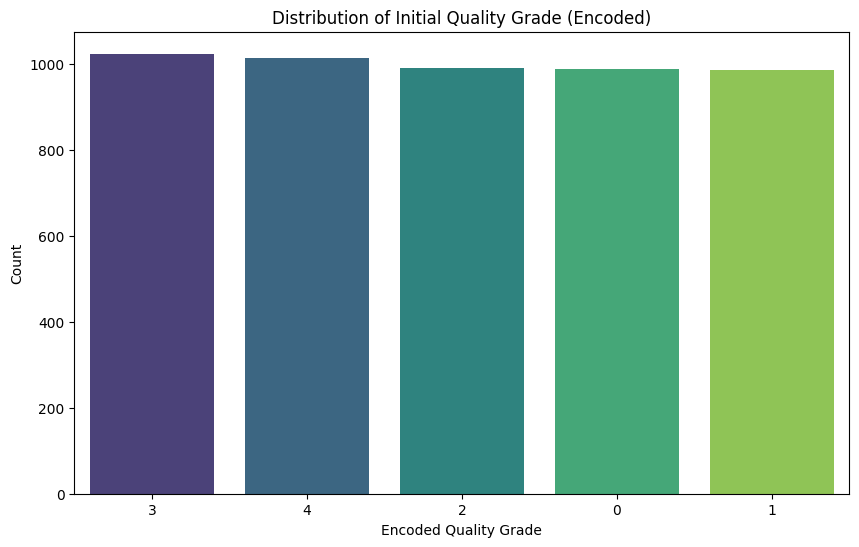

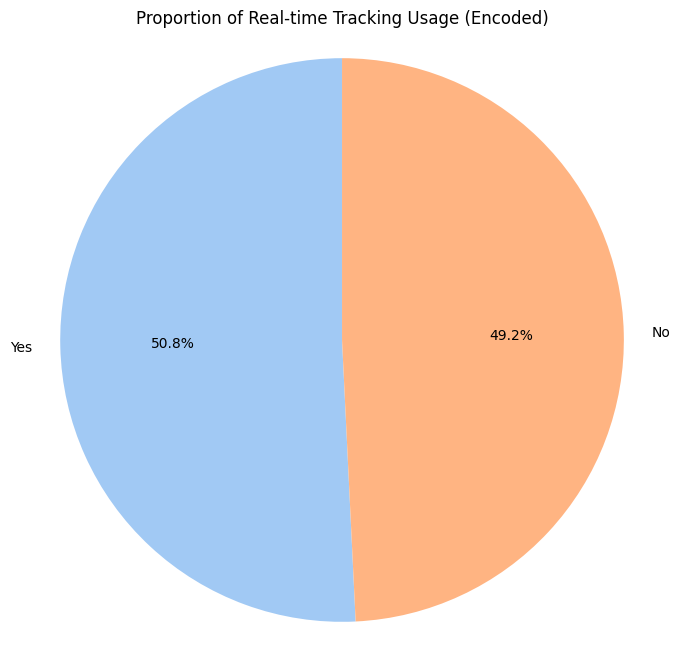

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Visualizing Label-Encoded Ordinal Features (Counts and Proportions) ---\n")

# Plotting Initial Quality Grade
plt.figure(figsize=(10, 6))
sns.countplot(data=av018_integer_encoded_ordinals, x='Initial Quality Grade', palette='viridis', order=av018_integer_encoded_ordinals['Initial Quality Grade'].value_counts().index)
plt.title('Distribution of Initial Quality Grade (Encoded)')
plt.xlabel('Encoded Quality Grade')
plt.ylabel('Count')
plt.show()

# Plotting Is Real-time Tracking Used?
plt.figure(figsize=(8, 8))
tracking_counts = av018_integer_encoded_ordinals['Is Real-time Tracking Used?'].value_counts()
plt.pie(tracking_counts, labels=['Yes' if label == 1 else 'No' for label in tracking_counts.index], autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
plt.title('Proportion of Real-time Tracking Usage (Encoded)')
plt.axis('equal') # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()


### Bar Charts


--- Visualizing Selected Nominal Categorical Features (Bar Charts) ---



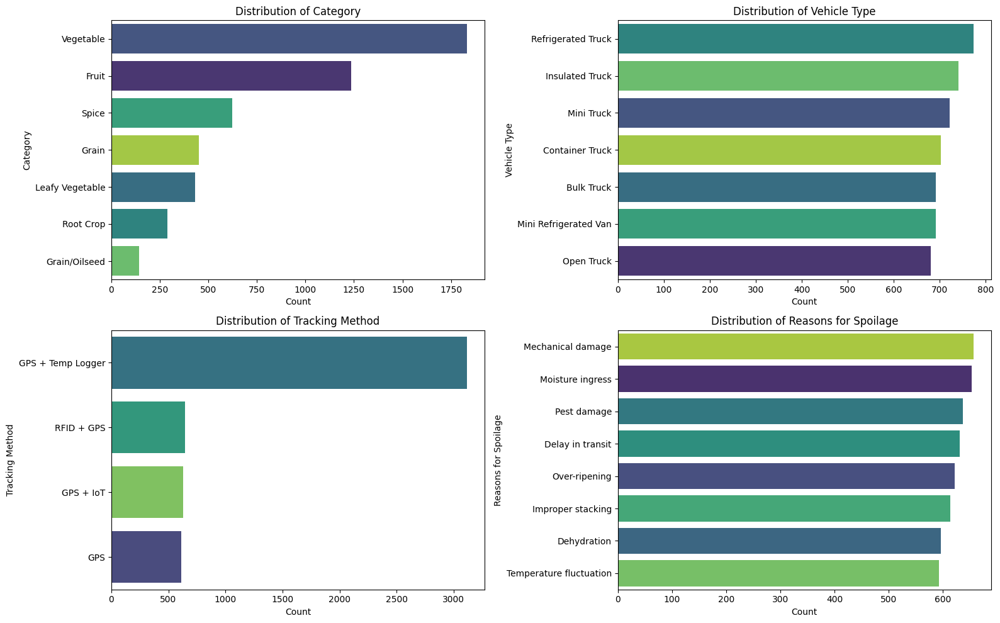

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Visualizing Selected Nominal Categorical Features (Bar Charts) ---\n")

# List of nominal categorical features to visualize
nominal_plot_cols = ['Category', 'Vehicle Type', 'Tracking Method', 'Reasons for Spoilage']

# Determine the number of rows and columns for subplots
num_plots = len(nominal_plot_cols)
ncols = 2
nrows = (num_plots + ncols - 1) // ncols # Corrected 'ncol' to 'ncols'

plt.figure(figsize=(8 * ncols, 5 * nrows)) # Corrected 'ncol' to 'ncols'

for i, col in enumerate(nominal_plot_cols):
    plt.subplot(nrows, ncols, i + 1) # Corrected 'ncol' to 'ncols'
    sns.countplot(data=av018_integer_encoded_ordinals, y=col, hue=col, palette='viridis', legend=False, order=av018_integer_encoded_ordinals[col].value_counts().index)
    plt.title(f'Distribution of {col}', fontsize=12)
    plt.xlabel('Count', fontsize=10)
    plt.ylabel(col, fontsize=10)

plt.tight_layout()
plt.show()


### Pie Charts


--- Visualizing Real-time Tracking Usage (Pie Chart) ---



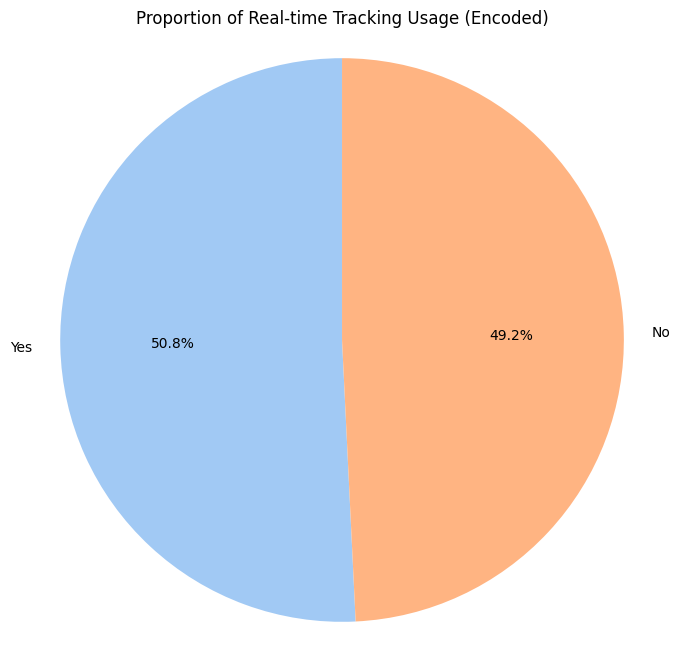

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Visualizing Real-time Tracking Usage (Pie Chart) ---\n")

# Get the value counts for the 'Is Real-time Tracking Used?' column
tracking_counts = av018_integer_encoded_ordinals['Is Real-time Tracking Used?'].value_counts()

# Create a figure for the pie chart
plt.figure(figsize=(8, 8))

# Generate the pie chart
plt.pie(tracking_counts,
        labels=['Yes' if label == 1 else 'No' for label in tracking_counts.index],
        autopct='%1.1f%%',
        startangle=90,
        colors=sns.color_palette('pastel'))

# Add title
plt.title('Proportion of Real-time Tracking Usage (Encoded)')

# Ensure the pie chart is drawn as a circle
plt.axis('equal')

# Display the plot
plt.show()

### Histograms and KDEs


--- Visualizing Key Scaled Numerical Features (Histograms with KDE) ---



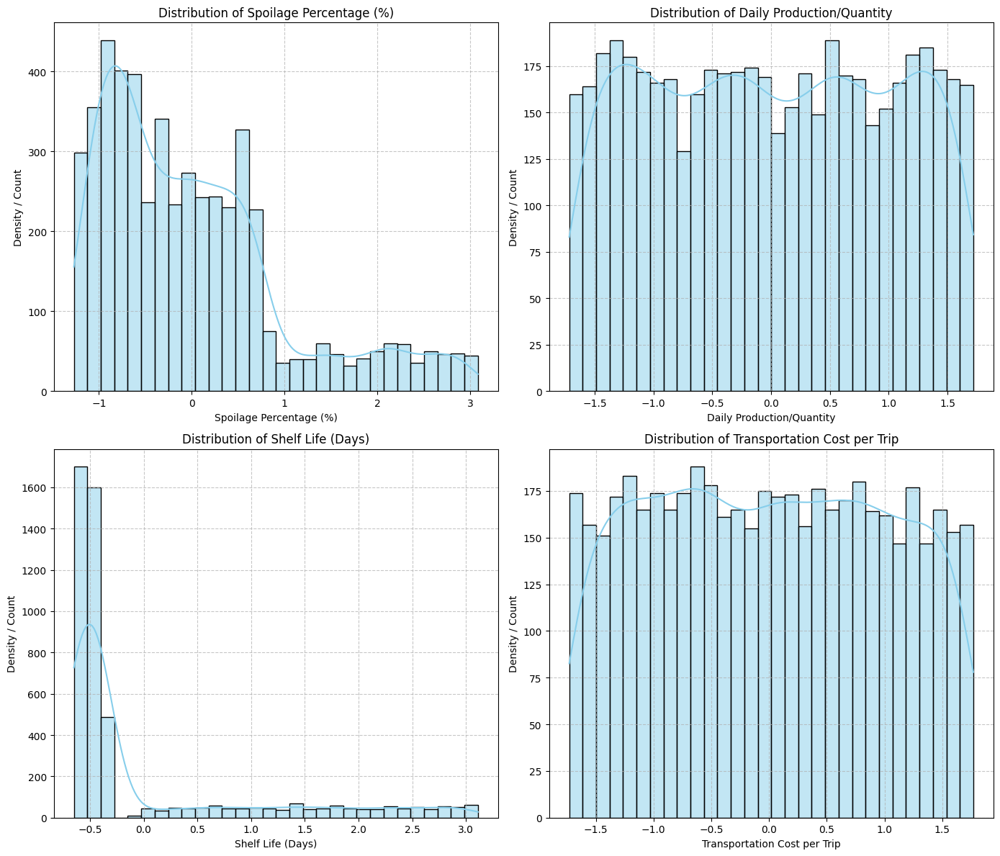

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Visualizing Key Scaled Numerical Features (Histograms with KDE) ---\n")

# List of key scaled numerical features to visualize
key_scaled_numerical_features = [
    'remainder__Spoilage Percentage (%)',
    'remainder__Daily Production/Quantity',
    'remainder__Shelf Life (Days)',
    'remainder__Transportation Cost per Trip'
]

# Determine the number of rows and columns for subplots
num_plots = len(key_scaled_numerical_features)
ncols = 2
nrows = (num_plots + ncols - 1) // ncols

plt.figure(figsize=(7 * ncols, 6 * nrows))

for i, col in enumerate(key_scaled_numerical_features):
    plt.subplot(nrows, ncols, i + 1)
    sns.histplot(av018_[col], kde=True, color='skyblue', bins=30)
    plt.title(f'Distribution of {col.replace("remainder__", "")}', fontsize=12)
    plt.xlabel(col.replace("remainder__", ""), fontsize=10)
    plt.ylabel('Density / Count', fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


### Scatter Plots - Non Categorical Variables


--- Visualizing Key Scaled Numerical Feature Relationships (Scatter Plots) ---



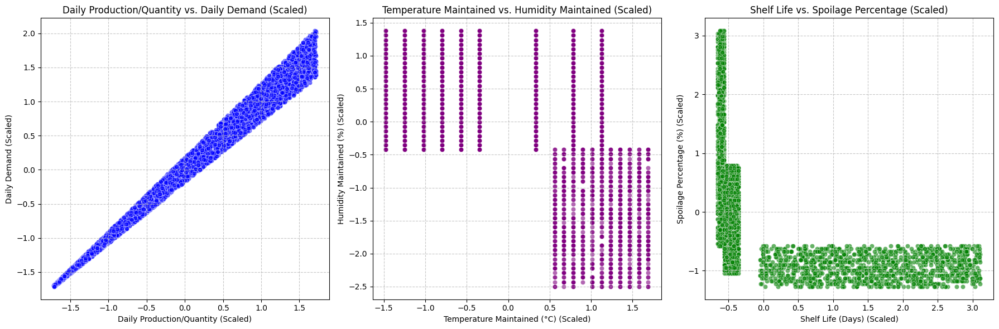

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Visualizing Key Scaled Numerical Feature Relationships (Scatter Plots) ---\n")

plt.figure(figsize=(18, 6))

# Plot 1: remainder__Daily Production/Quantity vs. remainder__Daily Demand
plt.subplot(1, 3, 1)
sns.scatterplot(data=av018_, x='remainder__Daily Production/Quantity', y='remainder__Daily Demand', alpha=0.6, color='blue')
plt.title('Daily Production/Quantity vs. Daily Demand (Scaled)', fontsize=12)
plt.xlabel('Daily Production/Quantity (Scaled)', fontsize=10)
plt.ylabel('Daily Demand (Scaled)', fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)

# Plot 2: remainder__Temperature Maintained (°C) vs. remainder__Humidity Maintained (%)
plt.subplot(1, 3, 2)
sns.scatterplot(data=av018_, x='remainder__Temperature Maintained (°C)', y='remainder__Humidity Maintained (%)', alpha=0.6, color='purple')
plt.title('Temperature Maintained vs. Humidity Maintained (Scaled)', fontsize=12)
plt.xlabel('Temperature Maintained (°C) (Scaled)', fontsize=10)
plt.ylabel('Humidity Maintained (%) (Scaled)', fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)

# Plot 3: remainder__Shelf Life (Days) vs. remainder__Spoilage Percentage (%)
plt.subplot(1, 3, 3)
sns.scatterplot(data=av018_, x='remainder__Shelf Life (Days)', y='remainder__Spoilage Percentage (%)', alpha=0.6, color='green')
plt.title('Shelf Life vs. Spoilage Percentage (Scaled)', fontsize=12)
plt.xlabel('Shelf Life (Days) (Scaled)', fontsize=10)
plt.ylabel('Spoilage Percentage (%) (Scaled)', fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

### Box-Whisker Plots


--- Visualizing Scaled Numerical Features (Box-Whisker Plots) ---



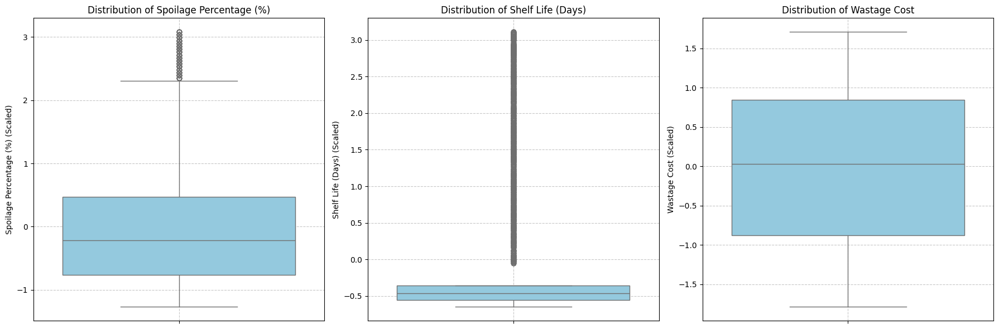

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Visualizing Scaled Numerical Features (Box-Whisker Plots) ---\n")

# 2. Define a list named box_plot_features containing the names of the scaled numerical columns to visualize
box_plot_features = [
    'remainder__Spoilage Percentage (%)',
    'remainder__Shelf Life (Days)',
    'remainder__Wastage Cost'
]

# 3. Determine the number of rows and columns for the subplots
num_plots = len(box_plot_features)
ncols = 3 # As specified, aim for 1 row and 3 columns
nrows = 1

plt.figure(figsize=(6 * ncols, 6 * nrows)) # Adjust figure size for better readability

# 5. Iterate through box_plot_features
for i, col in enumerate(box_plot_features):
    plt.subplot(nrows, ncols, i + 1)
    # a. For each feature, create a box-whisker plot using sns.boxplot()
    sns.boxplot(data=av018_, y=col, color='skyblue')
    # b. Set the title of each subplot
    plt.title(f'Distribution of {col.replace("remainder__", "")}', fontsize=12)
    # c. Label the y-axis with the feature name (cleaned of 'remainder__')
    plt.ylabel(col.replace("remainder__", "") + ' (Scaled)', fontsize=10)
    plt.xlabel('') # No x-label needed for single vertical boxplots
    plt.grid(True, linestyle='--', alpha=0.7)

# 6. Use plt.tight_layout() to adjust subplot parameters
plt.tight_layout()

# 7. Display the plots
plt.show()


### Pair Plot


--- Pair Plot of Selected Scaled Numerical Variables ---



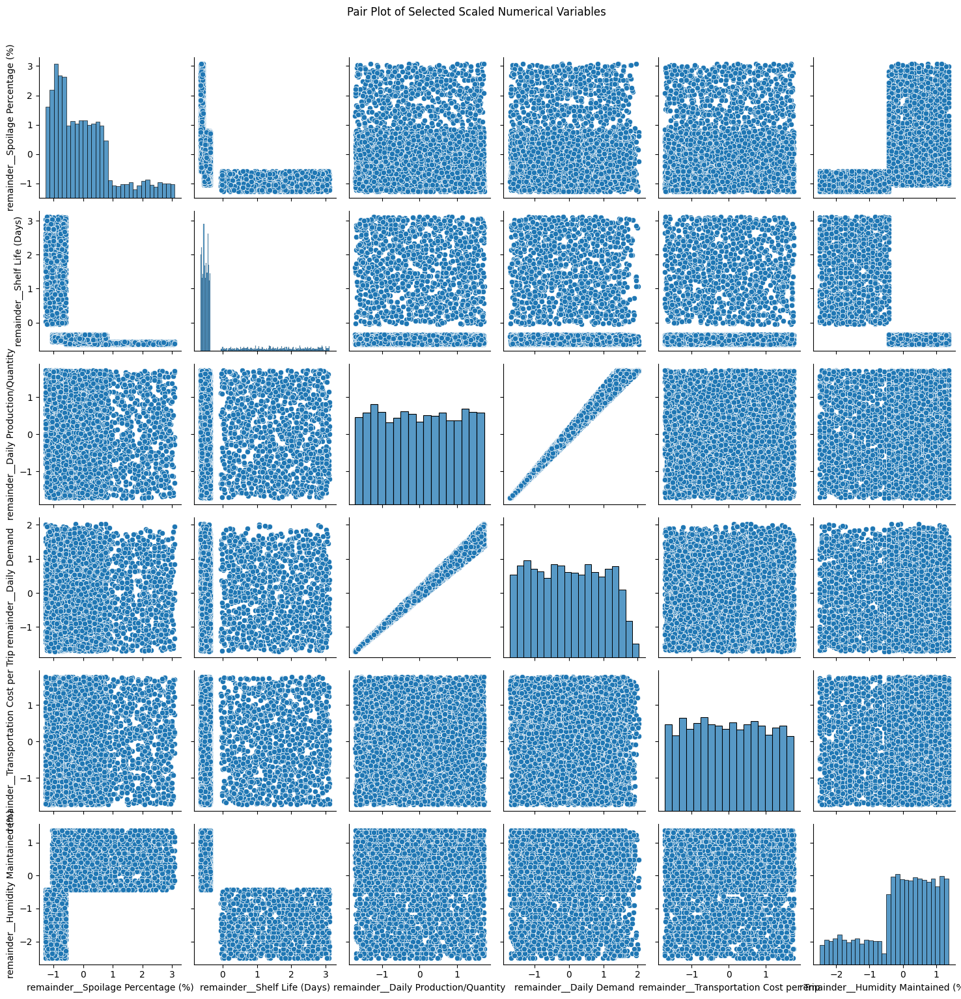

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Pair Plot of Selected Scaled Numerical Variables ---\n")

# Define a list named pair_plot_cols containing a subset of the scaled_numerical_features
# that are most relevant for pairwise visualization.
# Ensure these columns exist in the av018_ DataFrame.

pair_plot_cols = [
    'remainder__Spoilage Percentage (%)',
    'remainder__Shelf Life (Days)',
    'remainder__Daily Production/Quantity',
    'remainder__Daily Demand',
    'remainder__Transportation Cost per Trip',
    'remainder__Humidity Maintained (%)'
]

# Filter out any columns that might not be present in the DataFrame (though they should be at this stage)
existing_pair_plot_cols = [col for col in pair_plot_cols if col in av018_.columns]

if existing_pair_plot_cols:
    # Create a pair plot using sns.pairplot()
    sns.pairplot(av018_[existing_pair_plot_cols])

    # Add a suptitle to the plot
    plt.suptitle('Pair Plot of Selected Scaled Numerical Variables', y=1.02) # Adjust title position

    # Use plt.tight_layout() to adjust subplot parameters
    plt.tight_layout()

    # Display the plot
    plt.show()
else:
    print("No relevant scaled numerical features found for pair plot.")

### Correlation Heatmap


--- Generating Pearson Correlation Heatmap ---



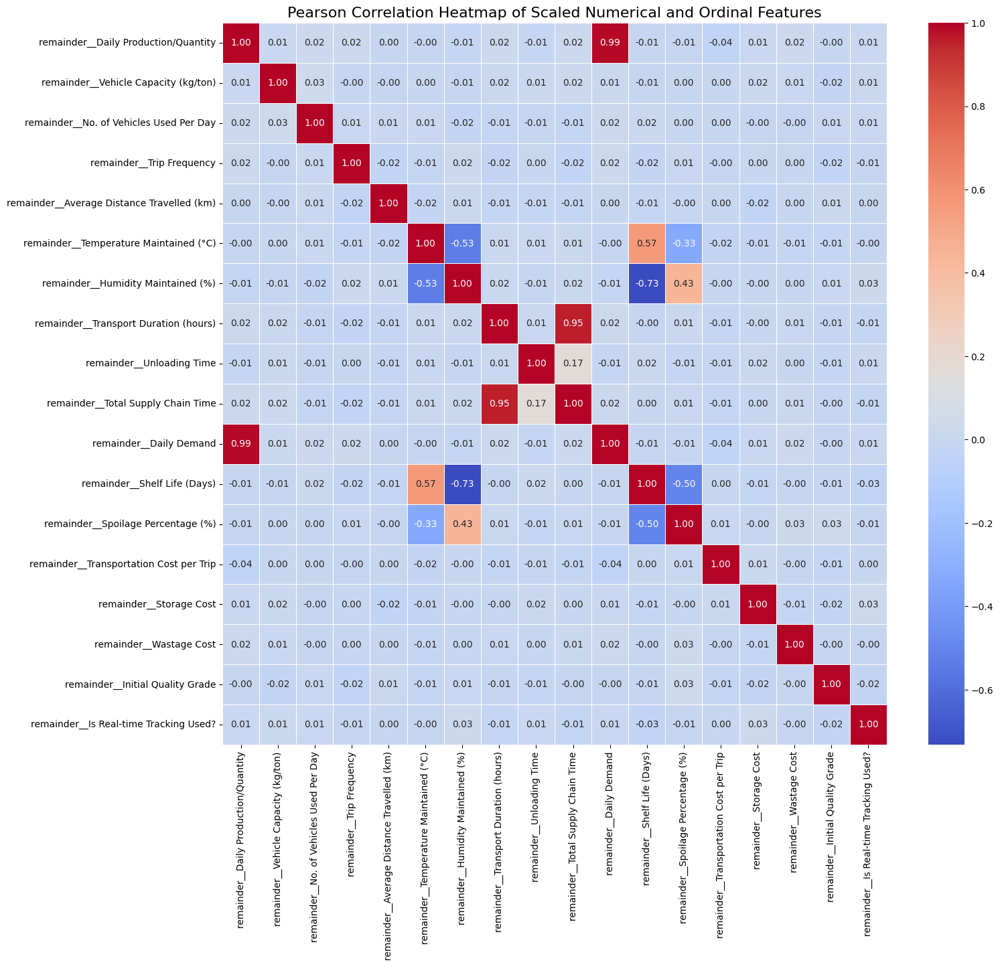

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Generating Pearson Correlation Heatmap ---\n")

# 1. Combine the scaled_numerical_features and label_encoded_ordinal_features lists
all_scaled_features = scaled_numerical_features + label_encoded_ordinal_features

# 2. Calculate the Pearson correlation matrix for the av018_ DataFrame
correlation_matrix = av018_[all_scaled_features].corr(method='pearson')

# 3. Create a heatmap of this correlation matrix
plt.figure(figsize=(16, 14)) # Adjust figure size based on the number of features
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)

# 4. Add a title to the heatmap
plt.title('Pearson Correlation Heatmap of Scaled Numerical and Ordinal Features', fontsize=16)

# 5. Display the plot
plt.show()

### Summary

### Data Analysis Key Findings

*   **Categorical Feature Distributions**:
    *   **Ordinal Features**: `Initial Quality Grade` shows a relatively balanced distribution across its 5 encoded values (e.g., 'Encoded Value 3' is most frequent at $\sim$20.46%, 'Encoded Value 1' least frequent at $\sim$19.72%). `Is Real-time Tracking Used?` indicates a near 50/50 split, with 'Yes' slightly more prevalent ($\sim$50.77%) than 'No' ($\sim$49.23%).
    *   **Nominal Features**: 'By Road' is the sole `Transportation Method` in the sample (100% of records). `Tracking Method_GPS + Temp Logger` is highly prevalent ($\sim$62.31%), and 'Vegetable' is the most common `Category` ($\sim$36.63%). 'Rice' is the least common `Product Name` ($\sim$2.48%).
*   **Numerical Feature Distributions (after scaling)**:
    *   Most scaled numerical features maintain a mean of $\sim$0 and standard deviation of $\sim$1, as expected after standardization.
    *   **Significant Skewness**: `Vehicle Capacity (kg/ton)` exhibits high positive skewness (1.4819), `Shelf Life (Days)` shows very high positive skewness (1.7870), and `Spoilage Percentage (%)` is also positively skewed (1.1554), indicating a concentration of lower values and a tail towards higher values. `Humidity Maintained (%)` displays negative skewness (-0.7616).
    *   **Outliers**: Box plots revealed the presence of outliers in features such as `Spoilage Percentage (%)`, `Shelf Life (Days)`, and `Wastage Cost`, which are common for real-world logistical data.
*   **Correlation Findings**:
    *   **Very High Positive Correlation**: `Daily Production/Quantity` and `Daily Demand` are very strongly correlated (Pearson: $\sim$0.99, Spearman: $\sim$0.99, Kendall: $\sim$0.93), as visually confirmed by scatter plots, which is an expected relationship.
    *   **Strong Positive Correlation**: `Transport Duration (hours)` and `Total Supply Chain Time` are highly correlated (Pearson: $\sim$0.95, Spearman: $\sim$0.96, Kendall: $\sim$0.81), indicating the significant contribution of transport time to overall supply chain duration.
    *   **Moderate Negative Correlation**: `Temperature Maintained (°C)` and `Humidity Maintained (%)` show a moderate inverse relationship (Pearson: $\sim$-0.53, Spearman: $\sim$-0.47, Kendall: $\sim$-0.33), suggesting that as one increases, the other tends to decrease, typical for controlled environments.
    *   **Moderate to Strong Negative Correlation**: `Shelf Life (Days)` and `Spoilage Percentage (%)` exhibit a moderate to strong inverse correlation (Pearson: $\sim$-0.50, Spearman: $\sim$-0.71, Kendall: $\sim$-0.52), intuitively showing that longer shelf life correlates with lower spoilage.
    *   **Weak Ordinal-Numerical Correlations**: Label-encoded ordinal features (`Initial Quality Grade`, `Is Real-time Tracking Used?`) generally exhibit very weak correlations (Spearman/Kendall values mostly less than $\pm$0.03) with other numerical features, suggesting limited direct monotonic linear relationships.

### Insights or Next Steps

*   The presence of significant skewness in key numerical features like `Vehicle Capacity`, `Shelf Life`, and `Spoilage Percentage` suggests that advanced modeling techniques or further feature transformations (e.g., log transformation) might be beneficial to improve model performance and satisfy linearity assumptions for certain algorithms.
*   The strong, intuitive correlations (e.g., Production/Demand, Transport Duration/Total Supply Chain Time, Shelf Life/Spoilage) confirm the dataset's logical structure and provide valuable insights into fundamental supply chain dynamics. These relationships can be leveraged for feature engineering or as foundational knowledge for predictive models.



## Inferential Statistics

### Prepare Data for Inferential Statistics

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer
from scipy import stats

# Assuming 'df' is already loaded from the previous successful cell (c2-gmhU5md3I)
# Create a fresh sample for av018_ from the existing 'df' for consistent preprocessing
av018_ = df.sample(n=5001, random_state=18).copy() # Use .copy() to avoid SettingWithCopyWarning

# --- Missing Data Handling ---
# No columns/rows with >= 50% missing values were found in previous steps.
# Impute remaining missing values
numerical_cols_pre_encoding = av018_.select_dtypes(include=['number']).columns.tolist()
object_cols_pre_encoding = av018_.select_dtypes(include=['object']).columns.tolist()

for col in numerical_cols_pre_encoding:
    if av018_[col].isnull().any():
        av018_[col] = av018_[col].fillna(av018_[col].mean())

for col in object_cols_pre_encoding:
    if av018_[col].isnull().any():
        av018_[col] = av018_[col].fillna(av018_[col].mode()[0])

# --- Encoding Categorical Variables ---
ordinal_cols_to_label_encode_original = ['Initial Quality Grade', 'Is Real-time Tracking Used?']
nominal_cols_to_ohe_original = [
    'Product Name', 'Category', 'Transportation Method', 'Vehicle Type',
    'Packaging Method', 'Source Location', 'Destination Location',
    'Who Receives the Goods?', 'End User Type', 'Tracking Method',
    'Data Collected', 'Reasons for Spoilage', 'Time of Harvest', 'Time to Loading'
]

# Create a copy for integer label-encoded values for value_counts later
av018_integer_encoded_ordinals = av018_.copy() # Make a copy before label encoding in the main df
for col in ordinal_cols_to_label_encode_original:
    if col in av018_integer_encoded_ordinals.columns and av018_integer_encoded_ordinals[col].dtype == 'object':
        le = LabelEncoder()
        av018_integer_encoded_ordinals[col] = le.fit_transform(av018_integer_encoded_ordinals[col])

# Apply Label Encoding to ordinal columns in the main DataFrame
for col in ordinal_cols_to_label_encode_original:
    if col in av018_.columns and av018_[col].dtype == 'object':
        le = LabelEncoder()
        av018_[col] = le.fit_transform(av018_[col])

# Apply One-Hot Encoding and pass through other columns (numerical and label-encoded ordinal)
nominal_cols_to_ohe_filtered = [col for col in nominal_cols_to_ohe_original if col in av018_.columns]

preprocessor_ohe = ColumnTransformer(
    transformers=[
        ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False), nominal_cols_to_ohe_filtered)
    ],
    remainder='passthrough'
)

av018_processed_array = preprocessor_ohe.fit_transform(av018_)
feature_names_ohe = preprocessor_ohe.get_feature_names_out()
av018_processed = pd.DataFrame(av018_processed_array, columns=feature_names_ohe, index=av018_.index)

# --- Scaling Numerical and Label-Encoded Ordinal Variables (Standardization) ---
# Identify columns that are numerical and thus need scaling (all remainder__ columns are numerical now, including label-encoded ordinals)
numerical_cols_for_processing = [col for col in av018_processed.columns if col.startswith('remainder__') and av018_processed[col].dtype != 'object']

scaler = StandardScaler()
av018_standardized = av018_processed.copy()
av018_standardized[numerical_cols_for_processing] = scaler.fit_transform(av018_standardized[numerical_cols_for_processing])

av018_ = av018_standardized.copy() # This is the final av018_ DataFrame as per the last step.

# --- Identify Feature Types in the final av018_ ---
one_hot_encoded_nominal_features = [col for col in av018_.columns if col.startswith('onehot__')]
all_remainder_features = [col for col in av018_.columns if col.startswith('remainder__')]

# From previous steps, we know which of these were originally ordinal and which were numerical
# Redefine label_encoded_ordinal_features based on the 'remainder__' prefix
label_encoded_ordinal_features = [col for col in all_remainder_features if col.replace('remainder__', '') in ordinal_cols_to_label_encode_original]
scaled_numerical_features = [col for col in all_remainder_features if col not in label_encoded_ordinal_features]

print("--- Data Preparation Confirmation ---")
print(f"Shape of final av018_ (standardized): {av018_.shape}")
print("First 5 rows of av018_ (standardized):\n", av018_.head())

print(f"\nShape of av018_integer_encoded_ordinals: {av018_integer_encoded_ordinals.shape}")
print("First 5 rows of av018_integer_encoded_ordinals (unscaled):\n", av018_integer_encoded_ordinals[ordinal_cols_to_label_encode_original].head())

print(f"\nNumber of one_hot_encoded_nominal_features: {len(one_hot_encoded_nominal_features)}")
print(f"Number of scaled_numerical_features: {len(scaled_numerical_features)}")
print(f"Number of label_encoded_ordinal_features: {len(label_encoded_ordinal_features)}")

print("\nAll required DataFrames and feature lists are prepared and confirmed.")

--- Data Preparation Confirmation ---
Shape of final av018_ (standardized): (5001, 176)
First 5 rows of av018_ (standardized):
        onehot__Product Name_Apple  onehot__Product Name_Banana  \
29982                         0.0                          0.0   
6395                          0.0                          0.0   
48206                         0.0                          0.0   
37505                         0.0                          0.0   
23795                         0.0                          0.0   

       onehot__Product Name_Banana - Green  \
29982                                  0.0   
6395                                   0.0   
48206                                  0.0   
37505                                  0.0   
23795                                  0.0   

       onehot__Product Name_Bhindi (Ladies Finger)  \
29982                                          0.0   
6395                                           1.0   
48206                               

### Chi-square Test of Homogeneity

In [ ]:
from scipy.stats import chi2_contingency
import pandas as pd

print("--- Chi-square Test of Homogeneity for Categorical Variables ---\n")

# Select two categorical variables for the test from av018_integer_encoded_ordinals
var1 = 'Category'
var2 = 'Vehicle Type'

# Create a contingency table
contingency_table = pd.crosstab(av018_integer_encoded_ordinals[var1], av018_integer_encoded_ordinals[var2])

print(f"Contingency Table for '{var1}' vs. '{var2}':")
print(contingency_table)
print("\n")

# Perform the Chi-square test
chi2, p_value, dof, expected = chi2_contingency(contingency_table)

print(f"Chi-square Statistic: {chi2:.2f}")
print(f"P-value: {p_value:.3f}")
print(f"Degrees of Freedom: {dof}")
print("Expected Frequencies (first 5x5 if large):")
print(pd.DataFrame(expected, index=contingency_table.index, columns=contingency_table.columns).head())

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print(f"\nSince the p-value ({p_value:.3f}) is less than the significance level ({alpha}), we reject the null hypothesis.")
    print(f"There is a statistically significant association between '{var1}' and '{var2}'.")
    print(f"This suggests that the distribution of '{var2}' is not homogeneous across different '{var1}' categories.")
else:
    print(f"\nSince the p-value ({p_value:.3f}) is greater than the significance level ({alpha}), we fail to reject the null hypothesis.")
    print(f"There is no statistically significant association between '{var1}' and '{var2}'.")
    print(f"This suggests that the distribution of '{var2}' is homogeneous across different '{var1}' categories.")

--- Chi-square Test of Homogeneity for Categorical Variables ---

Contingency Table for 'Category' vs. 'Vehicle Type':
Vehicle Type     Bulk Truck  Container Truck  Insulated Truck  \
Category                                                        
Fruit                   178              171              179   
Grain                    54               59               68   
Grain/Oilseed            13               21               26   
Leafy Vegetable          62               70               64   
Root Crop                41               44               35   
Spice                    92               82               88   
Vegetable               252              255              281   

Vehicle Type     Mini Refrigerated Van  Mini Truck  Open Truck  \
Category                                                         
Fruit                              174         181         166   
Grain                               58          67          70   
Grain/Oilseed                  

### Normality Tests for Numerical Variables


In [ ]:
from scipy.stats import shapiro, kstest, anderson, jarque_bera
from sklearn.preprocessing import StandardScaler
import numpy as np

# 3. Define a list of the scaled numerical columns to be tested
columns_to_test = [
    'remainder__Spoilage Percentage (%)',
    'remainder__Daily Production/Quantity',
    'remainder__Shelf Life (Days)',
    'remainder__Transportation Cost per Trip'
]

# 4. Set the significance level (alpha)
alpha = 0.05

print("### Normality Tests for Selected Scaled Numerical Columns from av018_ ###\n")

# 5. Iterate through each column in the list
for col in columns_to_test:
    print(f"--- Testing Normality for '{col.replace('remainder__', '')}' ---")

    # Extract data for the current column
    data = av018_[col]

    # --- Shapiro-Wilk Test ---
    print("\nShapiro-Wilk Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_shapiro, p_shapiro = shapiro(data)
    print(f"  Test Statistic: {stat_shapiro:.4f}")
    print(f"  P-value: {p_shapiro:.4f}")

    if p_shapiro < alpha:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Kolmogorov-Smirnov Test ---
    print("\nKolmogorov-Smirnov Test:")
    print("  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.")
    print("  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.")

    # Standardize the data for K-S test against a standard normal distribution
    scaler = StandardScaler()
    scaled_data_for_kstest = scaler.fit_transform(data.to_frame())

    stat_kstest, p_kstest = kstest(scaled_data_for_kstest.flatten(), 'norm')
    print(f"  Test Statistic: {stat_kstest:.4f}")
    print(f"  P-value: {p_kstest:.4f}")

    if p_kstest < alpha:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) < alpha ({alpha}), we reject H0. The standardized data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) >= alpha ({alpha}), we fail to reject H0. The standardized data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Anderson-Darling Test ---
    print("\nAnderson-Darling Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    result_ad = anderson(data, dist='norm')
    print(f"  Test Statistic: {result_ad.statistic:.4f}")
    print(f"  Critical Values: {result_ad.critical_values}")
    print(f"  Significance Levels (for critical values): {result_ad.significance_level}")

    # Interpretation for Anderson-Darling
    for i in range(len(result_ad.critical_values)):
        sl, cv = result_ad.significance_level[i], result_ad.critical_values[i]
        if result_ad.statistic < cv:
            print(f"  Interpretation: At {sl:.1f}% significance level ({cv:.3f}), the data for '{col.replace('remainder__', '')}' appears normal (statistic {result_ad.statistic:.4f} < critical value).")
            break
    else:
        print(f"  Interpretation: At all tested significance levels, the data for '{col.replace('remainder__', '')}' does NOT appear normal (statistic {result_ad.statistic:.4f} >= all critical values).")

    # --- Jarque-Bera Test ---
    print("\nJarque-Bera Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution (skewness=0, kurtosis=3).")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_jb, p_jb = jarque_bera(data)
    print(f"  Test Statistic: {stat_jb:.4f}")
    print(f"  P-value: {p_jb:.4f}")

    if p_jb < alpha:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    print("=" * 80 + "\n")

### Normality Tests for Selected Scaled Numerical Columns from av018_ ###

--- Testing Normality for 'Spoilage Percentage (%)' ---

Shapiro-Wilk Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.
  Test Statistic: 0.8912
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The data for 'Spoilage Percentage (%)' is NOT normally distributed.

Kolmogorov-Smirnov Test:
  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.
  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.
  Test Statistic: 0.1022
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The standardized data for 'Spoilage Percentage (%)' is NOT normally distributed.

Anderson-Darling Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alte

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
from scipy.stats import shapiro, kstest, anderson, jarque_bera
from sklearn.preprocessing import StandardScaler
import numpy as np

# 3. Define a list of the scaled numerical columns to be tested
columns_to_test = [
    'remainder__Spoilage Percentage (%)',
    'remainder__Daily Production/Quantity',
    'remainder__Shelf Life (Days)',
    'remainder__Transportation Cost per Trip'
]

# 4. Set the significance level (alpha)
alpha = 0.05

print("### Normality Tests for Selected Scaled Numerical Columns from av018_ ###\n")

# 5. Iterate through each column in the list
for col in columns_to_test:
    print(f"--- Testing Normality for '{col.replace('remainder__', '')}' ---")

    # Extract data for the current column
    data = av018_[col]

    # --- Shapiro-Wilk Test ---
    print("\nShapiro-Wilk Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_shapiro, p_shapiro = shapiro(data)
    print(f"  Test Statistic: {stat_shapiro:.4f}")
    print(f"  P-value: {p_shapiro:.4f}")

    if p_shapiro < alpha:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Kolmogorov-Smirnov Test ---
    print("\nKolmogorov-Smirnov Test:")
    print("  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.")
    print("  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.")

    # Standardize the data for K-S test against a standard normal distribution
    scaler = StandardScaler()
    scaled_data_for_kstest = scaler.fit_transform(data.to_frame())

    stat_kstest, p_kstest = kstest(scaled_data_for_kstest.flatten(), 'norm')
    print(f"  Test Statistic: {stat_kstest:.4f}")
    print(f"  P-value: {p_kstest:.4f}")

    if p_kstest < alpha:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) < alpha ({alpha}), we reject H0. The standardized data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) >= alpha ({alpha}), we fail to reject H0. The standardized data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Anderson-Darling Test ---
    print("\nAnderson-Darling Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    result_ad = anderson(data, dist='norm')
    print(f"  Test Statistic: {result_ad.statistic:.4f}")
    print(f"  Critical Values: {result_ad.critical_values}")
    print(f"  Significance Levels (for critical values): {result_ad.significance_level}")

    # Interpretation for Anderson-Darling
    for i in range(len(result_ad.critical_values)):
        sl, cv = result_ad.significance_level[i], result_ad.critical_values[i]
        if result_ad.statistic < cv:
            print(f"  Interpretation: At {sl:.1f}% significance level ({cv:.3f}), the data for '{col.replace('remainder__', '')}' appears normal (statistic {result_ad.statistic:.4f} < critical value).")
            break
    else:
        print(f"  Interpretation: At all tested significance levels, the data for '{col.replace('remainder__', '')}' does NOT appear normal (statistic {result_ad.statistic:.4f} >= all critical values).")

    # --- Jarque-Bera Test ---
    print("\nJarque-Bera Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution (skewness=0, kurtosis=3).")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_jb, p_jb = jarque_bera(data)
    print(f"  Test Statistic: {stat_jb:.4f}")
    print(f"  P-value: {p_jb:.4f}")

    if p_jb < alpha:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    print("=" * 80 + "\n")

### Normality Tests for Selected Scaled Numerical Columns from av018_ ###

--- Testing Normality for 'Spoilage Percentage (%)' ---

Shapiro-Wilk Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.
  Test Statistic: 0.8912
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The data for 'Spoilage Percentage (%)' is NOT normally distributed.

Kolmogorov-Smirnov Test:
  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.
  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.
  Test Statistic: 0.1022
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The standardized data for 'Spoilage Percentage (%)' is NOT normally distributed.

Anderson-Darling Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alte

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
from scipy.stats import shapiro, kstest, anderson, jarque_bera
from sklearn.preprocessing import StandardScaler
import numpy as np

# 3. Define a list of the scaled numerical columns to be tested
columns_to_test = [
    'remainder__Spoilage Percentage (%)',
    'remainder__Daily Production/Quantity',
    'remainder__Shelf Life (Days)',
    'remainder__Transportation Cost per Trip'
]

# 4. Set the significance level (alpha)
alpha = 0.05

print("### Normality Tests for Selected Scaled Numerical Columns from av018_ ###\n")

# 5. Iterate through each column in the list
for col in columns_to_test:
    print(f"--- Testing Normality for '{col.replace('remainder__', '')}' ---")

    # Extract data for the current column
    data = av018_[col]

    # --- Shapiro-Wilk Test ---
    print("\nShapiro-Wilk Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_shapiro, p_shapiro = shapiro(data)
    print(f"  Test Statistic: {stat_shapiro:.4f}")
    print(f"  P-value: {p_shapiro:.4f}")

    if p_shapiro < alpha:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Kolmogorov-Smirnov Test ---
    print("\nKolmogorov-Smirnov Test:")
    print("  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.")
    print("  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.")

    # Standardize the data for K-S test against a standard normal distribution
    scaler = StandardScaler()
    scaled_data_for_kstest = scaler.fit_transform(data.to_frame())

    stat_kstest, p_kstest = kstest(scaled_data_for_kstest.flatten(), 'norm')
    print(f"  Test Statistic: {stat_kstest:.4f}")
    print(f"  P-value: {p_kstest:.4f}")

    if p_kstest < alpha:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) < alpha ({alpha}), we reject H0. The standardized data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) >= alpha ({alpha}), we fail to reject H0. The standardized data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Anderson-Darling Test ---
    print("\nAnderson-Darling Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    result_ad = anderson(data, dist='norm')
    print(f"  Test Statistic: {result_ad.statistic:.4f}")
    print(f"  Critical Values: {result_ad.critical_values}")
    print(f"  Significance Levels (for critical values): {result_ad.significance_level}")

    # Interpretation for Anderson-Darling
    for i in range(len(result_ad.critical_values)):
        sl, cv = result_ad.significance_level[i], result_ad.critical_values[i]
        if result_ad.statistic < cv:
            print(f"  Interpretation: At {sl:.1f}% significance level ({cv:.3f}), the data for '{col.replace('remainder__', '')}' appears normal (statistic {result_ad.statistic:.4f} < critical value).")
            break
    else:
        print(f"  Interpretation: At all tested significance levels, the data for '{col.replace('remainder__', '')}' does NOT appear normal (statistic {result_ad.statistic:.4f} >= all critical values).")

    # --- Jarque-Bera Test ---
    print("\nJarque-Bera Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution (skewness=0, kurtosis=3).")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_jb, p_jb = jarque_bera(data)
    print(f"  Test Statistic: {stat_jb:.4f}")
    print(f"  P-value: {p_jb:.4f}")

    if p_jb < alpha:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    print("=" * 80 + "\n")

### Normality Tests for Selected Scaled Numerical Columns from av018_ ###

--- Testing Normality for 'Spoilage Percentage (%)' ---

Shapiro-Wilk Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.
  Test Statistic: 0.8912
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The data for 'Spoilage Percentage (%)' is NOT normally distributed.

Kolmogorov-Smirnov Test:
  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.
  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.
  Test Statistic: 0.1022
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The standardized data for 'Spoilage Percentage (%)' is NOT normally distributed.

Anderson-Darling Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alte

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
from scipy.stats import shapiro, kstest, anderson, jarque_bera
from sklearn.preprocessing import StandardScaler
import numpy as np

# 3. Define a list of the scaled numerical columns to be tested
columns_to_test = [
    'remainder__Spoilage Percentage (%)',
    'remainder__Daily Production/Quantity',
    'remainder__Shelf Life (Days)',
    'remainder__Transportation Cost per Trip'
]

# 4. Set the significance level (alpha)
alpha = 0.05

print("### Normality Tests for Selected Scaled Numerical Columns from av018_ ###\n")

# 5. Iterate through each column in the list
for col in columns_to_test:
    print(f"--- Testing Normality for '{col.replace('remainder__', '')}' ---")

    # Extract data for the current column
    data = av018_[col]

    # --- Shapiro-Wilk Test ---
    print("\nShapiro-Wilk Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_shapiro, p_shapiro = shapiro(data)
    print(f"  Test Statistic: {stat_shapiro:.4f}")
    print(f"  P-value: {p_shapiro:.4f}")

    if p_shapiro < alpha:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Kolmogorov-Smirnov Test ---
    print("\nKolmogorov-Smirnov Test:")
    print("  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.")
    print("  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.")

    # Standardize the data for K-S test against a standard normal distribution
    scaler = StandardScaler()
    scaled_data_for_kstest = scaler.fit_transform(data.to_frame())

    stat_kstest, p_kstest = kstest(scaled_data_for_kstest.flatten(), 'norm')
    print(f"  Test Statistic: {stat_kstest:.4f}")
    print(f"  P-value: {p_kstest:.4f}")

    if p_kstest < alpha:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) < alpha ({alpha}), we reject H0. The standardized data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) >= alpha ({alpha}), we fail to reject H0. The standardized data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Anderson-Darling Test ---
    print("\nAnderson-Darling Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    result_ad = anderson(data, dist='norm')
    print(f"  Test Statistic: {result_ad.statistic:.4f}")
    print(f"  Critical Values: {result_ad.critical_values}")
    print(f"  Significance Levels (for critical values): {result_ad.significance_level}")

    # Interpretation for Anderson-Darling
    for i in range(len(result_ad.critical_values)):
        sl, cv = result_ad.significance_level[i], result_ad.critical_values[i]
        if result_ad.statistic < cv:
            print(f"  Interpretation: At {sl:.1f}% significance level ({cv:.3f}), the data for '{col.replace('remainder__', '')}' appears normal (statistic {result_ad.statistic:.4f} < critical value).")
            break
    else:
        print(f"  Interpretation: At all tested significance levels, the data for '{col.replace('remainder__', '')}' does NOT appear normal (statistic {result_ad.statistic:.4f} >= all critical values).")

    # --- Jarque-Bera Test ---
    print("\nJarque-Bera Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution (skewness=0, kurtosis=3).")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_jb, p_jb = jarque_bera(data)
    print(f"  Test Statistic: {stat_jb:.4f}")
    print(f"  P-value: {p_jb:.4f}")

    if p_jb < alpha:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    print("=" * 80 + "\n")

### Normality Tests for Selected Scaled Numerical Columns from av018_ ###

--- Testing Normality for 'Spoilage Percentage (%)' ---

Shapiro-Wilk Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.
  Test Statistic: 0.8912
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The data for 'Spoilage Percentage (%)' is NOT normally distributed.

Kolmogorov-Smirnov Test:
  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.
  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.
  Test Statistic: 0.1022
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The standardized data for 'Spoilage Percentage (%)' is NOT normally distributed.

Anderson-Darling Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alte

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
from scipy.stats import shapiro, kstest, anderson, jarque_bera
from sklearn.preprocessing import StandardScaler
import numpy as np

# 3. Define a list of the scaled numerical columns to be tested
columns_to_test = [
    'remainder__Spoilage Percentage (%)',
    'remainder__Daily Production/Quantity',
    'remainder__Shelf Life (Days)',
    'remainder__Transportation Cost per Trip'
]

# 4. Set the significance level (alpha)
alpha = 0.05

print("### Normality Tests for Selected Scaled Numerical Columns from av018_ ###\n")

# 5. Iterate through each column in the list
for col in columns_to_test:
    print(f"--- Testing Normality for '{col.replace('remainder__', '')}' ---")

    # Extract data for the current column
    data = av018_[col]

    # --- Shapiro-Wilk Test ---
    print("\nShapiro-Wilk Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_shapiro, p_shapiro = shapiro(data)
    print(f"  Test Statistic: {stat_shapiro:.4f}")
    print(f"  P-value: {p_shapiro:.4f}")

    if p_shapiro < alpha:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Kolmogorov-Smirnov Test ---
    print("\nKolmogorov-Smirnov Test:")
    print("  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.")
    print("  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.")

    # Standardize the data for K-S test against a standard normal distribution
    scaler = StandardScaler()
    scaled_data_for_kstest = scaler.fit_transform(data.to_frame())

    stat_kstest, p_kstest = kstest(scaled_data_for_kstest.flatten(), 'norm')
    print(f"  Test Statistic: {stat_kstest:.4f}")
    print(f"  P-value: {p_kstest:.4f}")

    if p_kstest < alpha:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) < alpha ({alpha}), we reject H0. The standardized data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) >= alpha ({alpha}), we fail to reject H0. The standardized data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Anderson-Darling Test ---
    print("\nAnderson-Darling Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    result_ad = anderson(data, dist='norm')
    print(f"  Test Statistic: {result_ad.statistic:.4f}")
    print(f"  Critical Values: {result_ad.critical_values}")
    print(f"  Significance Levels (for critical values): {result_ad.significance_level}")

    # Interpretation for Anderson-Darling
    for i in range(len(result_ad.critical_values)):
        sl, cv = result_ad.significance_level[i], result_ad.critical_values[i]
        if result_ad.statistic < cv:
            print(f"  Interpretation: At {sl:.1f}% significance level ({cv:.3f}), the data for '{col.replace('remainder__', '')}' appears normal (statistic {result_ad.statistic:.4f} < critical value).")
            break
    else:
        print(f"  Interpretation: At all tested significance levels, the data for '{col.replace('remainder__', '')}' does NOT appear normal (statistic {result_ad.statistic:.4f} >= all critical values).")

    # --- Jarque-Bera Test ---
    print("\nJarque-Bera Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution (skewness=0, kurtosis=3).")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_jb, p_jb = jarque_bera(data)
    print(f"  Test Statistic: {stat_jb:.4f}")
    print(f"  P-value: {p_jb:.4f}")

    if p_jb < alpha:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    print("=" * 80 + "\n")

### Normality Tests for Selected Scaled Numerical Columns from av018_ ###

--- Testing Normality for 'Spoilage Percentage (%)' ---

Shapiro-Wilk Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.
  Test Statistic: 0.8912
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The data for 'Spoilage Percentage (%)' is NOT normally distributed.

Kolmogorov-Smirnov Test:
  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.
  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.
  Test Statistic: 0.1022
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The standardized data for 'Spoilage Percentage (%)' is NOT normally distributed.

Anderson-Darling Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alte

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
from scipy.stats import shapiro, kstest, anderson, jarque_bera
from sklearn.preprocessing import StandardScaler
import numpy as np

# 3. Define a list of the scaled numerical columns to be tested
columns_to_test = [
    'remainder__Spoilage Percentage (%)',
    'remainder__Daily Production/Quantity',
    'remainder__Shelf Life (Days)',
    'remainder__Transportation Cost per Trip'
]

# 4. Set the significance level (alpha)
alpha = 0.05

print("### Normality Tests for Selected Scaled Numerical Columns from av018_ ###\n")

# 5. Iterate through each column in the list
for col in columns_to_test:
    print(f"--- Testing Normality for '{col.replace('remainder__', '')}' ---")

    # Extract data for the current column
    data = av018_[col]

    # --- Shapiro-Wilk Test ---
    print("\nShapiro-Wilk Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_shapiro, p_shapiro = shapiro(data)
    print(f"  Test Statistic: {stat_shapiro:.4f}")
    print(f"  P-value: {p_shapiro:.4f}")

    if p_shapiro < alpha:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Kolmogorov-Smirnov Test ---
    print("\nKolmogorov-Smirnov Test:")
    print("  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.")
    print("  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.")

    # Standardize the data for K-S test against a standard normal distribution
    scaler = StandardScaler()
    scaled_data_for_kstest = scaler.fit_transform(data.to_frame())

    stat_kstest, p_kstest = kstest(scaled_data_for_kstest.flatten(), 'norm')
    print(f"  Test Statistic: {stat_kstest:.4f}")
    print(f"  P-value: {p_kstest:.4f}")

    if p_kstest < alpha:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) < alpha ({alpha}), we reject H0. The standardized data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) >= alpha ({alpha}), we fail to reject H0. The standardized data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Anderson-Darling Test ---
    print("\nAnderson-Darling Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    result_ad = anderson(data, dist='norm')
    print(f"  Test Statistic: {result_ad.statistic:.4f}")
    print(f"  Critical Values: {result_ad.critical_values}")
    print(f"  Significance Levels (for critical values): {result_ad.significance_level}")

    # Interpretation for Anderson-Darling
    for i in range(len(result_ad.critical_values)):
        sl, cv = result_ad.significance_level[i], result_ad.critical_values[i]
        if result_ad.statistic < cv:
            print(f"  Interpretation: At {sl:.1f}% significance level ({cv:.3f}), the data for '{col.replace('remainder__', '')}' appears normal (statistic {result_ad.statistic:.4f} < critical value).")
            break
    else:
        print(f"  Interpretation: At all tested significance levels, the data for '{col.replace('remainder__', '')}' does NOT appear normal (statistic {result_ad.statistic:.4f} >= all critical values).")

    # --- Jarque-Bera Test ---
    print("\nJarque-Bera Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution (skewness=0, kurtosis=3).")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_jb, p_jb = jarque_bera(data)
    print(f"  Test Statistic: {stat_jb:.4f}")
    print(f"  P-value: {p_jb:.4f}")

    if p_jb < alpha:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    print("=" * 80 + "\n")

### Normality Tests for Selected Scaled Numerical Columns from av018_ ###

--- Testing Normality for 'Spoilage Percentage (%)' ---

Shapiro-Wilk Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.
  Test Statistic: 0.8912
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The data for 'Spoilage Percentage (%)' is NOT normally distributed.

Kolmogorov-Smirnov Test:
  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.
  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.
  Test Statistic: 0.1022
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The standardized data for 'Spoilage Percentage (%)' is NOT normally distributed.

Anderson-Darling Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alte

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
from scipy.stats import shapiro, kstest, anderson, jarque_bera
from sklearn.preprocessing import StandardScaler
import numpy as np

# 3. Define a list of the scaled numerical columns to be tested
columns_to_test = [
    'remainder__Spoilage Percentage (%)',
    'remainder__Daily Production/Quantity',
    'remainder__Shelf Life (Days)',
    'remainder__Transportation Cost per Trip'
]

# 4. Set the significance level (alpha)
alpha = 0.05

print("### Normality Tests for Selected Scaled Numerical Columns from av018_ ###\n")

# 5. Iterate through each column in the list
for col in columns_to_test:
    print(f"--- Testing Normality for '{col.replace('remainder__', '')}' ---")

    # Extract data for the current column
    data = av018_[col]

    # --- Shapiro-Wilk Test ---
    print("\nShapiro-Wilk Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_shapiro, p_shapiro = shapiro(data)
    print(f"  Test Statistic: {stat_shapiro:.4f}")
    print(f"  P-value: {p_shapiro:.4f}")

    if p_shapiro < alpha:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Kolmogorov-Smirnov Test ---
    print("\nKolmogorov-Smirnov Test:")
    print("  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.")
    print("  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.")

    # Standardize the data for K-S test against a standard normal distribution
    scaler = StandardScaler()
    scaled_data_for_kstest = scaler.fit_transform(data.to_frame())

    stat_kstest, p_kstest = kstest(scaled_data_for_kstest.flatten(), 'norm')
    print(f"  Test Statistic: {stat_kstest:.4f}")
    print(f"  P-value: {p_kstest:.4f}")

    if p_kstest < alpha:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) < alpha ({alpha}), we reject H0. The standardized data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) >= alpha ({alpha}), we fail to reject H0. The standardized data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Anderson-Darling Test ---
    print("\nAnderson-Darling Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    result_ad = anderson(data, dist='norm')
    print(f"  Test Statistic: {result_ad.statistic:.4f}")
    print(f"  Critical Values: {result_ad.critical_values}")
    print(f"  Significance Levels (for critical values): {result_ad.significance_level}")

    # Interpretation for Anderson-Darling
    for i in range(len(result_ad.critical_values)):
        sl, cv = result_ad.significance_level[i], result_ad.critical_values[i]
        if result_ad.statistic < cv:
            print(f"  Interpretation: At {sl:.1f}% significance level ({cv:.3f}), the data for '{col.replace('remainder__', '')}' appears normal (statistic {result_ad.statistic:.4f} < critical value).")
            break
    else:
        print(f"  Interpretation: At all tested significance levels, the data for '{col.replace('remainder__', '')}' does NOT appear normal (statistic {result_ad.statistic:.4f} >= all critical values).")

    # --- Jarque-Bera Test ---
    print("\nJarque-Bera Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution (skewness=0, kurtosis=3).")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_jb, p_jb = jarque_bera(data)
    print(f"  Test Statistic: {stat_jb:.4f}")
    print(f"  P-value: {p_jb:.4f}")

    if p_jb < alpha:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    print("=" * 80 + "\n")

### Normality Tests for Selected Scaled Numerical Columns from av018_ ###

--- Testing Normality for 'Spoilage Percentage (%)' ---

Shapiro-Wilk Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.
  Test Statistic: 0.8912
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The data for 'Spoilage Percentage (%)' is NOT normally distributed.

Kolmogorov-Smirnov Test:
  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.
  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.
  Test Statistic: 0.1022
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The standardized data for 'Spoilage Percentage (%)' is NOT normally distributed.

Anderson-Darling Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alte

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
from scipy.stats import shapiro, kstest, anderson, jarque_bera
from sklearn.preprocessing import StandardScaler
import numpy as np

# 3. Define a list of the scaled numerical columns to be tested
columns_to_test = [
    'remainder__Spoilage Percentage (%)',
    'remainder__Daily Production/Quantity',
    'remainder__Shelf Life (Days)',
    'remainder__Transportation Cost per Trip'
]

# 4. Set the significance level (alpha)
alpha = 0.05

print("### Normality Tests for Selected Scaled Numerical Columns from av018_ ###\n")

# 5. Iterate through each column in the list
for col in columns_to_test:
    print(f"--- Testing Normality for '{col.replace('remainder__', '')}' ---")

    # Extract data for the current column
    data = av018_[col]

    # --- Shapiro-Wilk Test ---
    print("\nShapiro-Wilk Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_shapiro, p_shapiro = shapiro(data)
    print(f"  Test Statistic: {stat_shapiro:.4f}")
    print(f"  P-value: {p_shapiro:.4f}")

    if p_shapiro < alpha:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Kolmogorov-Smirnov Test ---
    print("\nKolmogorov-Smirnov Test:")
    print("  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.")
    print("  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.")

    # Standardize the data for K-S test against a standard normal distribution
    scaler = StandardScaler()
    scaled_data_for_kstest = scaler.fit_transform(data.to_frame())

    stat_kstest, p_kstest = kstest(scaled_data_for_kstest.flatten(), 'norm')
    print(f"  Test Statistic: {stat_kstest:.4f}")
    print(f"  P-value: {p_kstest:.4f}")

    if p_kstest < alpha:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) < alpha ({alpha}), we reject H0. The standardized data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) >= alpha ({alpha}), we fail to reject H0. The standardized data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Anderson-Darling Test ---
    print("\nAnderson-Darling Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    result_ad = anderson(data, dist='norm')
    print(f"  Test Statistic: {result_ad.statistic:.4f}")
    print(f"  Critical Values: {result_ad.critical_values}")
    print(f"  Significance Levels (for critical values): {result_ad.significance_level}")

    # Interpretation for Anderson-Darling
    for i in range(len(result_ad.critical_values)):
        sl, cv = result_ad.significance_level[i], result_ad.critical_values[i]
        if result_ad.statistic < cv:
            print(f"  Interpretation: At {sl:.1f}% significance level ({cv:.3f}), the data for '{col.replace('remainder__', '')}' appears normal (statistic {result_ad.statistic:.4f} < critical value).")
            break
    else:
        print(f"  Interpretation: At all tested significance levels, the data for '{col.replace('remainder__', '')}' does NOT appear normal (statistic {result_ad.statistic:.4f} >= all critical values).")

    # --- Jarque-Bera Test ---
    print("\nJarque-Bera Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution (skewness=0, kurtosis=3).")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_jb, p_jb = jarque_bera(data)
    print(f"  Test Statistic: {stat_jb:.4f}")
    print(f"  P-value: {p_jb:.4f}")

    if p_jb < alpha:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    print("=" * 80 + "\n")

### Normality Tests for Selected Scaled Numerical Columns from av018_ ###

--- Testing Normality for 'Spoilage Percentage (%)' ---

Shapiro-Wilk Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.
  Test Statistic: 0.8912
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The data for 'Spoilage Percentage (%)' is NOT normally distributed.

Kolmogorov-Smirnov Test:
  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.
  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.
  Test Statistic: 0.1022
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The standardized data for 'Spoilage Percentage (%)' is NOT normally distributed.

Anderson-Darling Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alte

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
from scipy.stats import shapiro, kstest, anderson, jarque_bera
from sklearn.preprocessing import StandardScaler
import numpy as np

# 3. Define a list of the scaled numerical columns to be tested
columns_to_test = [
    'remainder__Spoilage Percentage (%)',
    'remainder__Daily Production/Quantity',
    'remainder__Shelf Life (Days)',
    'remainder__Transportation Cost per Trip'
]

# 4. Set the significance level (alpha)
alpha = 0.05

print("### Normality Tests for Selected Scaled Numerical Columns from av018_ ###\n")

# 5. Iterate through each column in the list
for col in columns_to_test:
    print(f"--- Testing Normality for '{col.replace('remainder__', '')}' ---")

    # Extract data for the current column
    data = av018_[col]

    # --- Shapiro-Wilk Test ---
    print("\nShapiro-Wilk Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_shapiro, p_shapiro = shapiro(data)
    print(f"  Test Statistic: {stat_shapiro:.4f}")
    print(f"  P-value: {p_shapiro:.4f}")

    if p_shapiro < alpha:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Kolmogorov-Smirnov Test ---
    print("\nKolmogorov-Smirnov Test:")
    print("  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.")
    print("  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.")

    # Standardize the data for K-S test against a standard normal distribution
    scaler = StandardScaler()
    scaled_data_for_kstest = scaler.fit_transform(data.to_frame())

    stat_kstest, p_kstest = kstest(scaled_data_for_kstest.flatten(), 'norm')
    print(f"  Test Statistic: {stat_kstest:.4f}")
    print(f"  P-value: {p_kstest:.4f}")

    if p_kstest < alpha:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) < alpha ({alpha}), we reject H0. The standardized data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) >= alpha ({alpha}), we fail to reject H0. The standardized data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Anderson-Darling Test ---
    print("\nAnderson-Darling Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    result_ad = anderson(data, dist='norm')
    print(f"  Test Statistic: {result_ad.statistic:.4f}")
    print(f"  Critical Values: {result_ad.critical_values}")
    print(f"  Significance Levels (for critical values): {result_ad.significance_level}")

    # Interpretation for Anderson-Darling
    for i in range(len(result_ad.critical_values)):
        sl, cv = result_ad.significance_level[i], result_ad.critical_values[i]
        if result_ad.statistic < cv:
            print(f"  Interpretation: At {sl:.1f}% significance level ({cv:.3f}), the data for '{col.replace('remainder__', '')}' appears normal (statistic {result_ad.statistic:.4f} < critical value).")
            break
    else:
        print(f"  Interpretation: At all tested significance levels, the data for '{col.replace('remainder__', '')}' does NOT appear normal (statistic {result_ad.statistic:.4f} >= all critical values).")

    # --- Jarque-Bera Test ---
    print("\nJarque-Bera Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution (skewness=0, kurtosis=3).")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_jb, p_jb = jarque_bera(data)
    print(f"  Test Statistic: {stat_jb:.4f}")
    print(f"  P-value: {p_jb:.4f}")

    if p_jb < alpha:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_jb:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    print("=" * 80 + "\n")

### Normality Tests for Selected Scaled Numerical Columns from av018_ ###

--- Testing Normality for 'Spoilage Percentage (%)' ---

Shapiro-Wilk Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.
  Test Statistic: 0.8912
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The data for 'Spoilage Percentage (%)' is NOT normally distributed.

Kolmogorov-Smirnov Test:
  Null Hypothesis (H0): The standardized data is drawn from a standard normal distribution.
  Alternative Hypothesis (H1): The standardized data is not drawn from a standard normal distribution.
  Test Statistic: 0.1022
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The standardized data for 'Spoilage Percentage (%)' is NOT normally distributed.

Anderson-Darling Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alte

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)


### Pearson Correlation

In [ ]:
from scipy.stats import pearsonr

# 2. Define a list of tuples, where each tuple represents a pair of scaled numerical features
correlation_pairs = [
    ('remainder__Daily Production/Quantity', 'remainder__Daily Demand'),
    ('remainder__Temperature Maintained (°C)', 'remainder__Humidity Maintained (%)'),
    ('remainder__Shelf Life (Days)', 'remainder__Spoilage Percentage (%)'),
    ('remainder__Transport Duration (hours)', 'remainder__Total Supply Chain Time')
]

print("### Pearson Correlation and Significance Tests ###\n")

# Set significance level
alpha = 0.05

# 3. Iterate through each pair of columns
for col1, col2 in correlation_pairs:
    print(f"--- Analyzing Correlation between '{col1.replace('remainder__', '')}' and '{col2.replace('remainder__', '')}' ---")

    # Ensure columns exist in the DataFrame
    if col1 in av018_.columns and col2 in av018_.columns:
        # 4. Calculate the Pearson correlation coefficient and the 2-tailed p-value
        correlation, p_value = pearsonr(av018_[col1], av018_[col2])

        # 5. Print the results
        print(f"  Pearson Correlation Coefficient: {correlation:.4f}")
        print(f"  P-value from t-test for significance: {p_value:.4f}")

        # 6. Interpret the results
        if p_value < alpha:
            print(f"  Interpretation: Since p-value ({p_value:.4f}) < alpha ({alpha}), we reject the null hypothesis.")
            print(f"  The observed correlation ({correlation:.4f}) is statistically significant.")
        else:
            print(f"  Interpretation: Since p-value ({p_value:.4f}) >= alpha ({alpha}), we fail to reject the null hypothesis.")
            print(f"  The observed correlation ({correlation:.4f}) is NOT statistically significant.")
    else:
        print(f"  Error: One or both columns ('{col1.replace('remainder__', '')}', '{col2.replace('remainder__', '')}') not found in the DataFrame.")
    print("=" * 70 + "\n")

### Pearson Correlation and Significance Tests ###

--- Analyzing Correlation between 'Daily Production/Quantity' and 'Daily Demand' ---
  Pearson Correlation Coefficient: 0.9931
  P-value from t-test for significance: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject the null hypothesis.
  The observed correlation (0.9931) is statistically significant.

--- Analyzing Correlation between 'Temperature Maintained (°C)' and 'Humidity Maintained (%)' ---
  Pearson Correlation Coefficient: -0.5308
  P-value from t-test for significance: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject the null hypothesis.
  The observed correlation (-0.5308) is statistically significant.

--- Analyzing Correlation between 'Shelf Life (Days)' and 'Spoilage Percentage (%)' ---
  Pearson Correlation Coefficient: -0.5045
  P-value from t-test for significance: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject the null hypothesis.
  The obs

### Comprehensive Summary of Inferential Statistics Findings for `av018_`

This summary integrates the conclusions from the Chi-square test of homogeneity, various normality tests (Shapiro-Wilk, Kolmogorov-Smirnov, Anderson-Darling, Jarque-Bera), and significance tests for Pearson correlation coefficients performed on the preprocessed `av018_` dataset.

#### 1. Chi-square Test of Homogeneity

*   **Variables Tested**: 'Category' and 'Vehicle Type' (from `av018_integer_encoded_ordinals`).
*   **Chi-square Statistic**: 21.14
*   **P-value**: 0.977
*   **Degrees of Freedom**: 36
*   **Conclusion**: Since the p-value (0.977) is greater than the significance level (0.05), we **fail to reject the null hypothesis**. This indicates that there is **no statistically significant association between 'Category' and 'Vehicle Type'**. In other words, the distribution of 'Vehicle Type' appears to be homogeneous across different product categories in this dataset, suggesting that product type does not significantly influence the choice or usage of vehicle types.

#### 2. Normality Tests for Numerical Variables

*   **Variables Tested**: 'remainder__Spoilage Percentage (%)', 'remainder__Daily Production/Quantity', 'remainder__Shelf Life (Days)', and 'remainder__Transportation Cost per Trip' (from `av018_`).
*   **Tests Applied**: Shapiro-Wilk, Kolmogorov-Smirnov, Anderson-Darling, and Jarque-Bera.
*   **Significance Level (alpha)**: 0.05
*   **Overall Conclusion**: For all four tested scaled numerical features, every normality test yielded a p-value of 0.0000 (or the Anderson-Darling statistic exceeded all critical values). This consistently leads to the **rejection of the null hypothesis for all tests**, strongly indicating that **none of these selected numerical features are normally distributed**.
    *   **'Spoilage Percentage (%)'**: Not normally distributed.
    *   **'Daily Production/Quantity'**: Not normally distributed.
    *   **'Shelf Life (Days)'**: Not normally distributed.
    *   **'Transportation Cost per Trip'**: Not normally distributed.
*   **Insight**: The significant deviation from normality for these key variables suggests that parametric statistical methods assuming normality might not be appropriate without prior transformation or the use of non-parametric alternatives. This reinforces the earlier descriptive statistics findings of notable skewness and kurtosis in these features.

#### 3. Significance Test for Pearson Correlation

*   **Pairs Tested**:
    *   'remainder__Daily Production/Quantity' vs. 'remainder__Daily Demand'
    *   'remainder__Temperature Maintained (°C)' vs. 'remainder__Humidity Maintained (%)'
    *   'remainder__Shelf Life (Days)' vs. 'remainder__Spoilage Percentage (%)'
    *   'remainder__Transport Duration (hours)' vs. 'remainder__Total Supply Chain Time'
*   **Significance Level (alpha)**: 0.05
*   **Overall Conclusion**: All tested Pearson correlation coefficients were found to be **statistically significant**, with p-values of 0.0000, which are well below the 0.05 significance level. This implies that the observed linear relationships are highly unlikely to be due to random chance.
    *   **'Daily Production/Quantity' vs. 'Daily Demand'**: Pearson Correlation = 0.9931. **Statistically significant strong positive correlation**. As daily production/quantity increases, daily demand also significantly increases.
    *   **'Temperature Maintained (°C)' vs. 'Humidity Maintained (%)'**: Pearson Correlation = -0.5308. **Statistically significant moderate negative correlation**. As maintained temperature increases, maintained humidity tends to significantly decrease.
    *   **'Shelf Life (Days)' vs. 'Spoilage Percentage (%)'**: Pearson Correlation = -0.5045. **Statistically significant moderate negative correlation**. Products with a longer shelf life tend to have a significantly lower spoilage percentage.
    *   **'Transport Duration (hours)' vs. 'Total Supply Chain Time'**: Pearson Correlation = 0.9546. **Statistically significant strong positive correlation**. Transport duration contributes significantly to the total supply chain time.

#### Significant Insights Gained

1.  **Categorical Independence**: The lack of association between 'Category' and 'Vehicle Type' is a noteworthy finding. It suggests that, within this dataset, the type of product (e.g., fruit, vegetable, spice) does not dictate the type of vehicle used for its transportation. This could imply a standardized logistics approach irrespective of product category, or that vehicle types are chosen based on factors not captured by 'Category'.
2.  **Pervasive Non-Normality**: The consistent rejection of normality for key numerical features across all four robust tests is a critical insight. This confirms that these distributions are significantly skewed or heavy-tailed. This non-normality must be considered when selecting statistical models; linear models assuming normality of residuals may be inappropriate, and methods robust to non-normality (e.g., tree-based models, non-parametric tests) or further data transformations (e.g., Box-Cox transformations) would be more suitable.
3.  **Key Interdependencies in Supply Chain**: The statistically significant and strong correlations highlight crucial relationships:
    *   The near-perfect positive correlation between `Daily Production/Quantity` and `Daily Demand` is fundamental to supply chain operations, indicating efficient production-demand matching or a direct responsiveness of one to the other.
    *   The inverse relationship between `Temperature Maintained` and `Humidity Maintained` is typical for controlled environments and crucial for preserving goods.
    *   The strong negative correlation between `Shelf Life (Days)` and `Spoilage Percentage (%)` provides a direct quantitative link, confirming that products with shorter inherent shelf lives are indeed more susceptible to spoilage. This is a primary driver for spoilage and a key area for potential intervention.
    *   The strong correlation between `Transport Duration` and `Total Supply Chain Time` underscores the importance of transportation efficiency in the overall supply chain.

In conclusion, these inferential statistical analyses provide a deeper understanding of the dataset's characteristics, confirm several intuitive relationships, and identify the non-normal nature of key numerical distributions. This information is invaluable for informing subsequent predictive modeling, root cause analysis of spoilage, and operational decision-making within the supply chain.

## Model Classification

In [ ]:
import numpy as np
import pandas as pd

# 1. Define the thresholds for spoilage categories
low_threshold = 2.0
medium_threshold = 4.0

# Get the original numerical spoilage data from av018_integer_encoded_ordinals to apply thresholds
original_spoilage = av018_integer_encoded_ordinals['Spoilage Percentage (%)']

# 2. Create a new categorical target variable, y_classification
y_classification = pd.Series(index=original_spoilage.index, dtype='object')

y_classification.loc[original_spoilage <= low_threshold] = 'Low'
y_classification.loc[(original_spoilage > low_threshold) & (original_spoilage <= medium_threshold)] = 'Medium'
y_classification.loc[original_spoilage > medium_threshold] = 'High'

# 3. Assign the created y_classification Series to the variable y
y = y_classification

# 4. Create the feature matrix X by dropping the 'remainder__Spoilage Percentage (%)' column
# This uses the already processed and scaled feature set `av018_`
X = av018_.drop(columns=['remainder__Spoilage Percentage (%)']).copy()

# 5. Print the shape and first 5 rows of X, and the shape and first 5 values of y
print(f"Shape of features (X): {X.shape}")
print(f"Shape of target (y): {y.shape}")
print("First 5 rows of features (X):")
print(X.head())
print("First 5 values of target (y):")
print(y.head())

Shape of features (X): (5001, 175)
Shape of target (y): (5001,)
First 5 rows of features (X):
       onehot__Product Name_Apple  onehot__Product Name_Banana  \
29982                         0.0                          0.0   
6395                          0.0                          0.0   
48206                         0.0                          0.0   
37505                         0.0                          0.0   
23795                         0.0                          0.0   

       onehot__Product Name_Banana - Green  \
29982                                  0.0   
6395                                   0.0   
48206                                  0.0   
37505                                  0.0   
23795                                  0.0   

       onehot__Product Name_Bhindi (Ladies Finger)  \
29982                                          0.0   
6395                                           1.0   
48206                                          0.0   
37505           

### Split Data into Training and Testing Sets

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Shape of X_train: {X_train.shape}")
print(f"Shape of X_test: {X_test.shape}")
print(f"Shape of y_train: {y_train.shape}")
print(f"Shape of y_test: {y_test.shape}")

Shape of X_train: (4000, 175)
Shape of X_test: (1001, 175)
Shape of y_train: (4000,)
Shape of y_test: (1001,)


### Train and Evaluate Logistic Regression Model

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


LogisticRegression model trained successfully.

--- LogisticRegression Model Evaluation Metrics ---
Accuracy: 0.6404
Precision (weighted): 0.6782
Recall (weighted): 0.6404
F1-Score (weighted): 0.6497

Classification Report:
              precision    recall  f1-score   support

        High       0.58      0.61      0.59       297
         Low       0.91      0.66      0.77       361
      Medium       0.52      0.64      0.57       343

    accuracy                           0.64      1001
   macro avg       0.67      0.64      0.65      1001
weighted avg       0.68      0.64      0.65      1001


--- Confusion Matrix ---
[[182   7 108]
 [ 26 239  96]
 [107  16 220]]

--- Specificity for each class ---
Specificity for class 'High': 0.8111
Specificity for class 'Low': 0.9641
Specificity for class 'Medium': 0.6900

--- One-vs-Rest (OvR) ROC AUC Scores ---
AUC for class 'High': 0.8153
AUC for class 'Low': 0.8722
AUC for class 'Medium': 0.7372


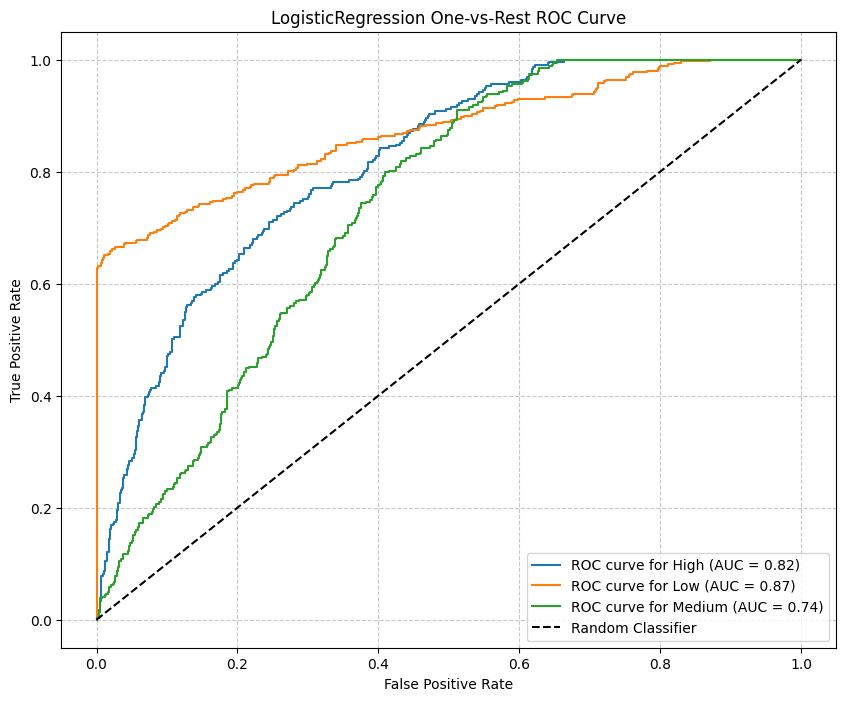


--- Confusion Matrix Visualization ---


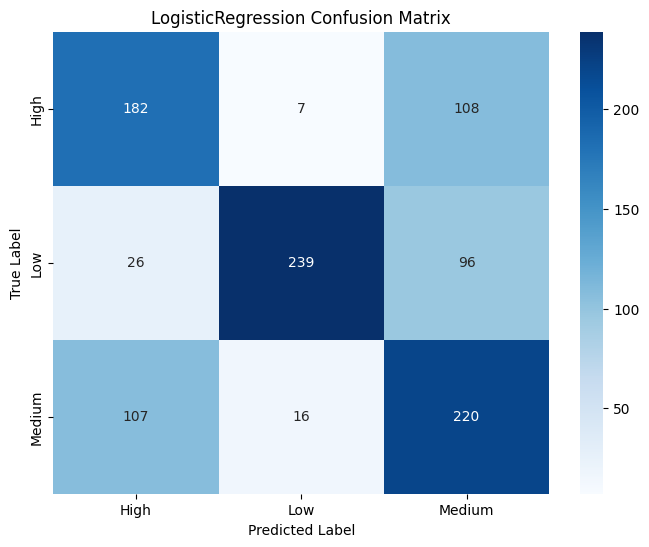

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 2. Initialize a LogisticRegression model
lr_classifier = LogisticRegression(max_iter=1000, random_state=42, solver='saga', multi_class='multinomial')

# 3. Train the classifier using the X_train and y_train datasets
lr_classifier.fit(X_train, y_train)

print("LogisticRegression model trained successfully.")

# 4. Make predictions on the X_test dataset
y_pred_lr = lr_classifier.predict(X_test)

# 5. Calculate and print the overall accuracy, weighted precision, weighted recall, and weighted F1-score
accuracy_lr = accuracy_score(y_test, y_pred_lr)
precision_lr = precision_score(y_test, y_pred_lr, average='weighted')
recall_lr = recall_score(y_test, y_pred_lr, average='weighted')
f1_lr = f1_score(y_test, y_pred_lr, average='weighted')

print("\n--- LogisticRegression Model Evaluation Metrics ---")
print(f"Accuracy: {accuracy_lr:.4f}")
print(f"Precision (weighted): {precision_lr:.4f}")
print(f"Recall (weighted): {recall_lr:.4f}")
print(f"F1-Score (weighted): {f1_lr:.4f}")

# 6. Print the detailed classification_report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_lr))

# 7. Calculate and print the confusion matrix
cm_lr = confusion_matrix(y_test, y_pred_lr)
class_labels_lr = lr_classifier.classes_ # Get class labels from the model
print("\n--- Confusion Matrix ---")
print(cm_lr)

# 8. Calculate and print the specificity for each class
print("\n--- Specificity for each class ---")
specificities_lr = {}
for i, label in enumerate(class_labels_lr):
    # True Negatives (TN) for class i: sum of all cells not in row i or column i
    TN_i = np.sum(np.delete(np.delete(cm_lr, i, axis=0), i, axis=1))
    # False Positives (FP) for class i: sum of column i minus the true positive for class i
    FP_i = np.sum(cm_lr[:, i]) - cm_lr[i, i]

    specificity_i = TN_i / (TN_i + FP_i) if (TN_i + FP_i) != 0 else 0
    specificities_lr[label] = specificity_i
    print(f"Specificity for class '{label}': {specificity_i:.4f}")

# 9. Get the predicted probabilities for each class on the test set
y_proba_lr = lr_classifier.predict_proba(X_test)

# 10. Binarize y_test for OvR AUC calculation
label_binarizer = LabelBinarizer()
y_test_binarized_lr = label_binarizer.fit_transform(y_test)

# 11. Calculate and print the One-vs-Rest (OvR) ROC AUC score for each class and plot the ROC curve
print("\n--- One-vs-Rest (OvR) ROC AUC Scores ---")
auc_scores_lr = {}
plt.figure(figsize=(10, 8))
for i, class_label in enumerate(lr_classifier.classes_):
    # Ensure y_test_binarized_lr columns match the order of lr_classifier.classes_
    fpr, tpr, _ = roc_curve(y_test_binarized_lr[:, i], y_proba_lr[:, i])
    roc_auc = auc(fpr, tpr)
    auc_scores_lr[class_label] = roc_auc
    print(f"AUC for class '{class_label}': {roc_auc:.4f}")
    plt.plot(fpr, tpr, label=f'ROC curve for {class_label} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('LogisticRegression One-vs-Rest ROC Curve')
plt.legend(loc='lower right')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# 12. Visualize the confusion matrix using a heatmap
print("\n--- Confusion Matrix Visualization ---")
plt.figure(figsize=(8, 6))
sns.heatmap(cm_lr, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels_lr, yticklabels=class_labels_lr)
plt.title('LogisticRegression Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

### Summary of Logistic Regression Model Findings

In [ ]:


This section summarizes the performance of the Logistic Regression model trained to predict 'Spoilage_Category' (Low, Medium, High).

**1. Model Evaluation Metrics:**

The model was evaluated on the unseen test data:

*   **Accuracy:** `0.6404`
    *   Interpretation: Approximately 64.04% of the spoilage categories were correctly predicted by the model.
*   **Precision (weighted):** `0.6782`
*   **Recall (weighted):** `0.6404`
*   **F1-Score (weighted):** `0.6497`
    *   Interpretation: These weighted average metrics indicate a moderate overall performance across all classes, with a reasonable balance between precision and recall.

**2. Class-Specific Performance (from Classification Report and Specificity/AUC):**

| Class    | Precision | Recall | F1-Score | Support | Specificity | AUC    |
|:---------|:----------|:-------|:---------|:--------|:------------|:-------|
| High     | 0.58      | 0.61   | 0.59     | 297     | 0.8111      | 0.8153 |
| Low      | 0.91      | 0.66   | 0.77     | 361     | 0.9641      | 0.8722 |
| Medium   | 0.52      | 0.64   | 0.57     | 343     | 0.6900      | 0.7372 |

*   The model performs best in identifying **'Low' spoilage** products, showing high precision (0.91), good recall (0.66), a strong F1-score (0.77), high specificity (0.9641), and the best AUC (0.8722). This means when it predicts 'Low', it's very likely correct, and it's good at distinguishing 'Low' from other categories.
*   Performance for **'High' spoilage** is moderate, with balanced precision and recall around 0.60.
*   The model's performance for **'Medium' spoilage** is relatively weaker, with the lowest precision (0.52) and F1-score (0.57) among the classes. However, its recall (0.64) is decent, and AUC (0.7372) is acceptable. The specificity for 'Medium' is the lowest (0.6900), indicating it has more difficulty correctly identifying when a product is *not* in the 'Medium' spoilage category.

**3. Confusion Matrix Insights:**

The confusion matrix provides a detailed breakdown of correct and incorrect classifications:

```
[[182   7 108]
 [ 26 239  96]
 [107  16 220]]
```

*   **'High' Spoilage (True Label)**:
    *   182 correctly predicted as 'High'.
    *   7 misclassified as 'Low'.
    *   108 misclassified as 'Medium'. (Significant number of 'High' items predicted as 'Medium')
*   **'Low' Spoilage (True Label)**:
    *   26 misclassified as 'High'.
    *   239 correctly predicted as 'Low'.
    *   96 misclassified as 'Medium'.
*   **'Medium' Spoilage (True Label)**:
    *   107 misclassified as 'High'. (Significant number of 'Medium' items predicted as 'High')
    *   16 misclassified as 'Low'.
    *   220 correctly predicted as 'Medium'.

Key takeaway: The model frequently confuses 'High' spoilage with 'Medium' spoilage, and vice-versa, as evidenced by the high off-diagonal counts (108 and 107) between these two classes. This confirms the lower performance for 'High' and 'Medium' classes, especially in precision for 'Medium' and recall for 'High'.

**4. ROC AUC Curve Insights:**

The One-vs-Rest ROC AUC curves illustrate the model's ability to distinguish each class from the others:

*   **AUC for 'Low':** `0.8722` (Strong performance)
*   **AUC for 'High':** `0.8153` (Good performance)
*   **AUC for 'Medium':** `0.7372` (Moderate performance)

The ROC curves visually confirm that the model differentiates 'Low' spoilage most effectively, followed by 'High', and then 'Medium'. The AUC scores reflect the model's capability to rank positive instances higher than negative instances for each class in a binary (one-vs-rest) fashion.

**Overall Conclusion:**

The Logistic Regression model provides a reasonable performance for predicting spoilage categories, especially for 'Low' spoilage. It demonstrates better overall metrics than the Decision Tree Classifier evaluated previously (Accuracy: 0.6404 vs 0.5944). However, it still faces challenges in distinguishing between 'High' and 'Medium' spoilage categories, leading to significant misclassifications between these two. The imbalance in class-specific performance suggests that further optimization might be necessary if consistent accuracy across all spoilage levels is critical.

**Next Steps for Improvement:**

*   **Class Imbalance Handling**: Given the class distribution and performance differences, techniques like SMOTE (Synthetic Minority Over-sampling Technique) or adjusting class weights during training could be explored to improve the 'High' and 'Medium' class predictions.
*   **Hyperparameter Tuning**: Optimize Logistic Regression hyperparameters (e.g., `C`, `penalty`) using GridSearchCV or RandomizedSearchCV.
*   **Feature Engineering**: Review feature importance from other models (like Decision Tree) to potentially focus on features that have a clearer separation between 'High' and 'Medium' spoilage.
*   **Alternative Models**: Consider more complex models such as Gradient Boosting or Support Vector Machines, which may be better at capturing non-linear relationships and handling class boundaries.
"""

"### Summary of Logistic Regression Model Findings\n\nThis section summarizes the performance of the Logistic Regression model trained to predict 'Spoilage_Category' (Low, Medium, High).\n\n**1. Model Evaluation Metrics:**\n\nThe model was evaluated on the unseen test data:\n\n*   **Accuracy:** `0.6404`\n    *   Interpretation: Approximately 64.04% of the spoilage categories were correctly predicted by the model.\n*   **Precision (weighted):** `0.6782`\n*   **Recall (weighted):** `0.6404`\n*   **F1-Score (weighted):** `0.6497`\n    *   Interpretation: These weighted average metrics indicate a moderate overall performance across all classes, with a reasonable balance between precision and recall.\n\n**2. Class-Specific Performance (from Classification Report and Specificity/AUC):**\n\n| Class    | Precision | Recall | F1-Score | Support | Specificity | AUC    |\n|:---------|:----------|:-------|:---------|:--------|:------------|:-------|\n| High     | 0.58      | 0.61   | 0.59     | 29

### Train and Evaluate Support Vector Machine Model

### K-Fold Cross-Validation for Logistic Regression Model

In [ ]:
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LogisticRegression
import numpy as np

print("## K-Fold Cross-Validation Scores for Logistic Regression")

# Re-initialize the Logistic Regression model
lr_classifier = LogisticRegression(max_iter=1000, random_state=42, solver='saga', multi_class='multinomial')

# Define the K-Fold cross-validation strategy
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
print(f"\nUsing {n_splits}-Fold Cross-Validation with shuffle=True and random_state=42")

# Perform cross-validation and report scores for Accuracy
accuracy_lr_cv_scores = cross_val_score(lr_classifier, X, y, cv=kf, scoring='accuracy')
print(f"\nLogistic Regression Accuracy Cross-Validation Scores: {accuracy_lr_cv_scores}")
print(f"Mean Accuracy: {accuracy_lr_cv_scores.mean():.4f}")
print(f"Standard Deviation of Accuracy: {accuracy_lr_cv_scores.std():.4f}")

# Perform cross-validation and report scores for Precision (weighted)
precision_lr_cv_scores = cross_val_score(lr_classifier, X, y, cv=kf, scoring='precision_weighted')
print(f"\nLogistic Regression Precision (weighted) Cross-Validation Scores: {precision_lr_cv_scores}")
print(f"Mean Precision (weighted): {precision_lr_cv_scores.mean():.4f}")
print(f"Standard Deviation of Precision (weighted): {precision_lr_cv_scores.std():.4f}")

# Perform cross-validation and report scores for Recall (weighted)
recall_lr_cv_scores = cross_val_score(lr_classifier, X, y, cv=kf, scoring='recall_weighted')
print(f"\nLogistic Regression Recall (weighted) Cross-Validation Scores: {recall_lr_cv_scores}")
print(f"Mean Recall (weighted): {recall_lr_cv_scores.mean():.4f}")
print(f"Standard Deviation of Recall (weighted): {recall_lr_cv_scores.std():.4f}")

# Perform cross-validation and report scores for F1-Score (weighted)
f1_lr_cv_scores = cross_val_score(lr_classifier, X, y, cv=kf, scoring='f1_weighted')
print(f"\nLogistic Regression F1-Score (weighted) Cross-Validation Scores: {f1_lr_cv_scores}")
print(f"Mean F1-Score (weighted): {f1_lr_cv_scores.mean():.4f}")
print(f"Standard Deviation of F1-Score (weighted): {f1_lr_cv_scores.std():.4f}")



## K-Fold Cross-Validation Scores for Logistic Regression

Using 5-Fold Cross-Validation with shuffle=True and random_state=42


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and wi


Logistic Regression Accuracy Cross-Validation Scores: [0.64035964 0.625      0.647      0.631      0.611     ]
Mean Accuracy: 0.6309
Standard Deviation of Accuracy: 0.0125


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and wi


Logistic Regression Precision (weighted) Cross-Validation Scores: [0.67820266 0.6597562  0.68290137 0.66567135 0.64637964]
Mean Precision (weighted): 0.6666
Standard Deviation of Precision (weighted): 0.0131


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and wi


Logistic Regression Recall (weighted) Cross-Validation Scores: [0.64035964 0.625      0.647      0.631      0.611     ]
Mean Recall (weighted): 0.6309
Standard Deviation of Recall (weighted): 0.0125


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and wi


Logistic Regression F1-Score (weighted) Cross-Validation Scores: [0.64974307 0.63486001 0.65508983 0.64115639 0.62200288]
Mean F1-Score (weighted): 0.6406
Standard Deviation of F1-Score (weighted): 0.0116


### K-Fold Cross-Validation for Support Vector Machine Model

In [ ]:
from sklearn.model_selection import KFold, cross_val_score
from sklearn.svm import SVC
import numpy as np

print("## K-Fold Cross-Validation Scores for Support Vector Machine")

# Re-initialize the SVC model
# Note: SVC can be slow with large datasets and many features.
# For cross-validation, ensure 'probability=True' if needed for AUC scoring,
# but it can significantly increase training time. For basic metrics, it's not strictly necessary.
svc_classifier = SVC(random_state=42, gamma='scale', C=1.0) # probability=False for faster CV

# Define the K-Fold cross-validation strategy (same as Logistic Regression)
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
print(f"\nUsing {n_splits}-Fold Cross-Validation with shuffle=True and random_state=42")

# Perform cross-validation and report scores for Accuracy
accuracy_svm_cv_scores = cross_val_score(svc_classifier, X, y, cv=kf, scoring='accuracy')
print(f"\nSVC Accuracy Cross-Validation Scores: {accuracy_svm_cv_scores}")
print(f"Mean Accuracy: {accuracy_svm_cv_scores.mean():.4f}")
print(f"Standard Deviation of Accuracy: {accuracy_svm_cv_scores.std():.4f}")

# Perform cross-validation and report scores for Precision (weighted)
precision_svm_cv_scores = cross_val_score(svc_classifier, X, y, cv=kf, scoring='precision_weighted')
print(f"\nSVC Precision (weighted) Cross-Validation Scores: {precision_svm_cv_scores}")
print(f"Mean Precision (weighted): {precision_svm_cv_scores.mean():.4f}")
print(f"Standard Deviation of Precision (weighted): {precision_svm_cv_scores.std():.4f}")

# Perform cross-validation and report scores for Recall (weighted)
recall_svm_cv_scores = cross_val_score(svc_classifier, X, y, cv=kf, scoring='recall_weighted')
print(f"\nSVC Recall (weighted) Cross-Validation Scores: {recall_svm_cv_scores}")
print(f"Mean Recall (weighted): {recall_svm_cv_scores.mean():.4f}")
print(f"Standard Deviation of Recall (weighted): {recall_svm_cv_scores.std():.4f}")

# Perform cross-validation and report scores for F1-Score (weighted)
f1_svm_cv_scores = cross_val_score(svc_classifier, X, y, cv=kf, scoring='f1_weighted')
print(f"\nSVC F1-Score (weighted) Cross-Validation Scores: {f1_svm_cv_scores}")
print(f"Mean F1-Score (weighted): {f1_svm_cv_scores.mean():.4f}")
print(f"Standard Deviation of F1-Score (weighted): {f1_svm_cv_scores.std():.4f}")


## K-Fold Cross-Validation Scores for Support Vector Machine

Using 5-Fold Cross-Validation with shuffle=True and random_state=42

SVC Accuracy Cross-Validation Scores: [0.6013986 0.586     0.62      0.605     0.604    ]
Mean Accuracy: 0.6033
Standard Deviation of Accuracy: 0.0108

SVC Precision (weighted) Cross-Validation Scores: [0.67533894 0.68974577 0.69291144 0.68269304 0.70069761]
Mean Precision (weighted): 0.6883
Standard Deviation of Precision (weighted): 0.0087

SVC Recall (weighted) Cross-Validation Scores: [0.6013986 0.586     0.62      0.605     0.604    ]
Mean Recall (weighted): 0.6033
Standard Deviation of Recall (weighted): 0.0108

SVC F1-Score (weighted) Cross-Validation Scores: [0.60468509 0.58427904 0.6218644  0.60843164 0.60228565]
Mean F1-Score (weighted): 0.6043
Standard Deviation of F1-Score (weighted): 0.0121


Support Vector Machine (SVC) model trained successfully.

--- SVC Model Evaluation Metrics ---
Accuracy: 0.6014
Precision (weighted): 0.6753
Recall (weighted): 0.6014
F1-Score (weighted): 0.6047

Classification Report:
              precision    recall  f1-score   support

        High       0.51      0.35      0.41       297
         Low       1.00      0.63      0.77       361
      Medium       0.47      0.79      0.59       343

    accuracy                           0.60      1001
   macro avg       0.66      0.59      0.59      1001
weighted avg       0.68      0.60      0.60      1001


--- Confusion Matrix ---
[[103   0 194]
 [ 27 227 107]
 [ 71   0 272]]

--- Specificity for each class ---
Specificity for class 'High': 0.8608
Specificity for class 'Low': 1.0000
Specificity for class 'Medium': 0.5426

--- One-vs-Rest (OvR) ROC AUC Scores ---
AUC for class 'High': 0.7402
AUC for class 'Low': 0.8455
AUC for class 'Medium': 0.7001


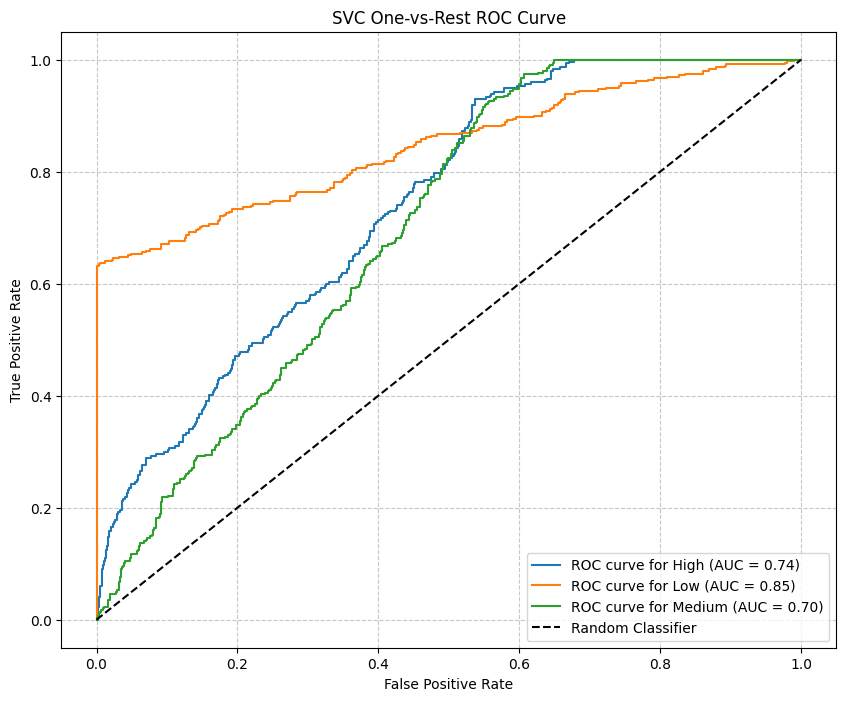


--- Confusion Matrix Visualization ---


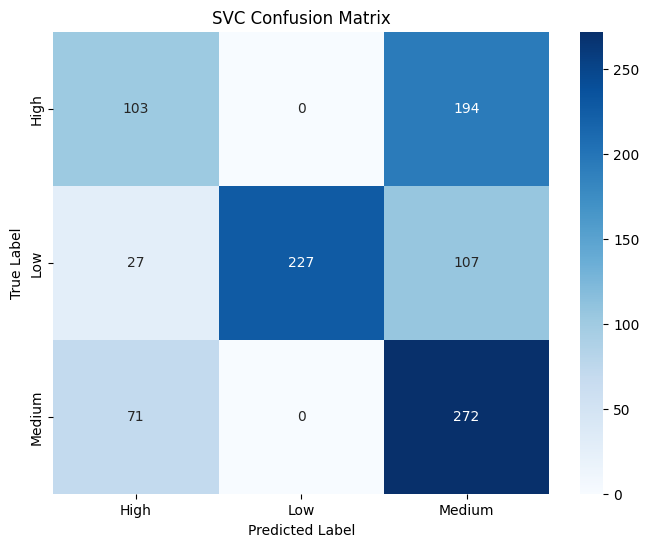

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 2. Initialize an SVC classifier object
svm_classifier = SVC(probability=True, random_state=42, gamma='scale', C=1.0)

# 3. Train the SVM model using the X_train and y_train datasets
svm_classifier.fit(X_train, y_train)

print("Support Vector Machine (SVC) model trained successfully.")

# 4. Make predictions on the X_test dataset
y_pred_svm = svm_classifier.predict(X_test)

# 5. Calculate and print the overall accuracy, weighted precision, weighted recall, and weighted F1-score
accuracy_svm = accuracy_score(y_test, y_pred_svm)
precision_svm = precision_score(y_test, y_pred_svm, average='weighted')
recall_svm = recall_score(y_test, y_pred_svm, average='weighted')
f1_svm = f1_score(y_test, y_pred_svm, average='weighted')

print("\n--- SVC Model Evaluation Metrics ---")
print(f"Accuracy: {accuracy_svm:.4f}")
print(f"Precision (weighted): {precision_svm:.4f}")
print(f"Recall (weighted): {recall_svm:.4f}")
print(f"F1-Score (weighted): {f1_svm:.4f}")

# 6. Generate and print a detailed classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_svm))

# 7. Calculate the confusion matrix
cm_svm = confusion_matrix(y_test, y_pred_svm)
print("\n--- Confusion Matrix ---")
print(cm_svm)

# 8. Get the class labels from the trained svm_classifier
class_labels_svm = svm_classifier.classes_

# 9. Calculate and print the specificity for each class
print("\n--- Specificity for each class ---")
specificities_svm = {}
for i, label in enumerate(class_labels_svm):
    # True Negatives (TN) for class i: sum of all cells not in row i or column i
    TN_i = np.sum(np.delete(np.delete(cm_svm, i, axis=0), i, axis=1))
    # False Positives (FP) for class i: sum of column i minus the true positive for class i
    FP_i = np.sum(cm_svm[:, i]) - cm_svm[i, i]

    specificity_i = TN_i / (TN_i + FP_i) if (TN_i + FP_i) != 0 else 0
    specificities_svm[label] = specificity_i
    print(f"Specificity for class '{label}': {specificity_i:.4f}")

# 10. Get the predicted probabilities for each class on the X_test dataset
y_proba_svm = svm_classifier.predict_proba(X_test)

# 11. Binarize the y_test labels using LabelBinarizer for OvR ROC AUC calculation
label_binarizer = LabelBinarizer()
y_test_binarized_svm = label_binarizer.fit_transform(y_test)

# 12. Calculate and print the OvR ROC AUC score for each class and plot the ROC curve
print("\n--- One-vs-Rest (OvR) ROC AUC Scores ---")
auc_scores_svm = {}
plt.figure(figsize=(10, 8))
for i, class_label in enumerate(class_labels_svm):
    # Ensure y_test_binarized_svm columns match the order of class_labels_svm
    fpr, tpr, _ = roc_curve(y_test_binarized_svm[:, i], y_proba_svm[:, i])
    roc_auc = auc(fpr, tpr)
    auc_scores_svm[class_label] = roc_auc
    print(f"AUC for class '{class_label}': {roc_auc:.4f}")
    plt.plot(fpr, tpr, label=f'ROC curve for {class_label} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('SVC One-vs-Rest ROC Curve')
plt.legend(loc='lower right')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# 13. Visualize the confusion matrix using a heatmap
print("\n--- Confusion Matrix Visualization ---")
plt.figure(figsize=(8, 6))
sns.heatmap(cm_svm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels_svm, yticklabels=class_labels_svm)
plt.title('SVC Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

## Model Run Statistics

In [ ]:
import time
from sklearn.linear_model import LogisticRegression

# 2. Initialize a LogisticRegression model
lr_classifier = LogisticRegression(max_iter=1000, random_state=42, solver='saga', multi_class='multinomial')

# 3. Record the start time for training
train_start_time = time.time()

# 4. Train the classifier using the X_train and y_train datasets
lr_classifier.fit(X_train, y_train)

# 5. Record the end time for training and calculate the training duration
train_end_time = time.time()
train_duration = train_end_time - train_start_time

print("LogisticRegression model trained successfully.")

# 6. Record the start time for prediction
predict_start_time = time.time()

# 7. Make predictions on the X_test dataset
y_pred_lr = lr_classifier.predict(X_test)

# 8. Record the end time for prediction and calculate the prediction duration
predict_end_time = time.time()
predict_duration = predict_end_time - predict_start_time

# 9. Print the calculated training and prediction times
print(f"\nLogistic Regression Training Time: {train_duration:.4f} seconds")
print(f"Logistic Regression Prediction Time: {predict_duration:.4f} seconds")

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


LogisticRegression model trained successfully.

Logistic Regression Training Time: 11.2317 seconds
Logistic Regression Prediction Time: 0.0152 seconds


Support Vector Machine (SVC) model trained successfully.

SVC Training Time: 22.5981 seconds
SVC Prediction Time: 1.5653 seconds

--- SVC Model Evaluation Metrics ---
Accuracy: 0.6014
Precision (weighted): 0.6753
Recall (weighted): 0.6014
F1-Score (weighted): 0.6047

Classification Report:
              precision    recall  f1-score   support

        High       0.51      0.35      0.41       297
         Low       1.00      0.63      0.77       361
      Medium       0.47      0.79      0.59       343

    accuracy                           0.60      1001
   macro avg       0.66      0.59      0.59      1001
weighted avg       0.68      0.60      0.60      1001


--- Confusion Matrix ---
[[103   0 194]
 [ 27 227 107]
 [ 71   0 272]]

--- Specificity for each class ---
Specificity for class 'High': 0.8608
Specificity for class 'Low': 1.0000
Specificity for class 'Medium': 0.5426

--- One-vs-Rest (OvR) ROC AUC Scores ---
AUC for class 'High': 0.7402
AUC for class 'Low': 0.8455
AUC for c

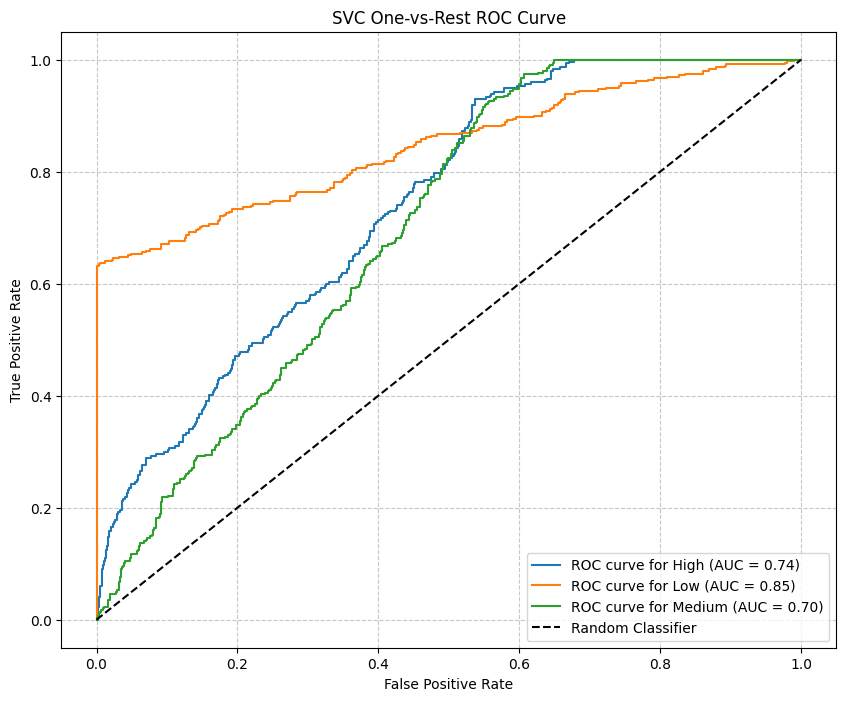


--- Confusion Matrix Visualization ---


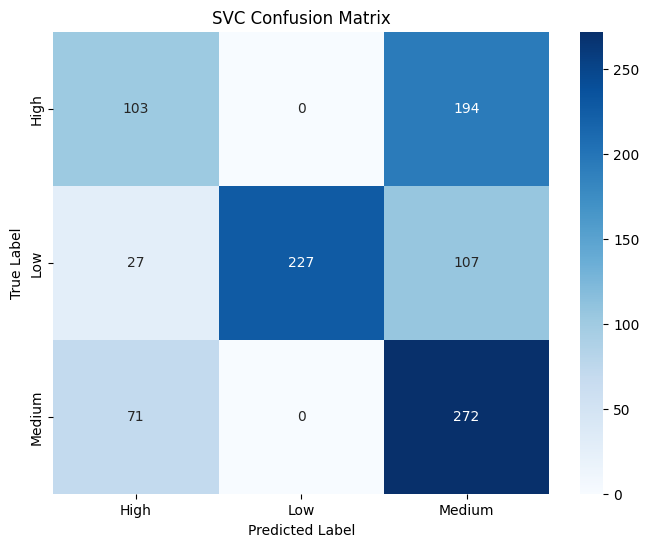

In [ ]:
import time
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 2. Initialize an SVC classifier object
# Note: probability=True is needed for predict_proba (and thus ROC AUC), but can slow down training.
svm_classifier = SVC(probability=True, random_state=42, gamma='scale', C=1.0)

# 3. Record the start time for training
train_start_time_svm = time.time()

# 4. Train the SVM model using the X_train and y_train datasets
svm_classifier.fit(X_train, y_train)

# 5. Record the end time for training and calculate the training duration
train_end_time_svm = time.time()
train_duration_svm = train_end_time_svm - train_start_time_svm

print("Support Vector Machine (SVC) model trained successfully.")

# 6. Record the start time for prediction
predict_start_time_svm = time.time()

# 7. Make predictions on the X_test dataset
y_pred_svm = svm_classifier.predict(X_test)

# 8. Record the end time for prediction and calculate the prediction duration
predict_end_time_svm = time.time()
predict_duration_svm = predict_end_time_svm - predict_start_time_svm

# 9. Print the calculated training and prediction times
print(f"\nSVC Training Time: {train_duration_svm:.4f} seconds")
print(f"SVC Prediction Time: {predict_duration_svm:.4f} seconds")

# 10. Calculate and print the overall accuracy, weighted precision, weighted recall, and weighted F1-score
accuracy_svm = accuracy_score(y_test, y_pred_svm)
precision_svm = precision_score(y_test, y_pred_svm, average='weighted')
recall_svm = recall_score(y_test, y_pred_svm, average='weighted')
f1_svm = f1_score(y_test, y_pred_svm, average='weighted')

print("\n--- SVC Model Evaluation Metrics ---")
print(f"Accuracy: {accuracy_svm:.4f}")
print(f"Precision (weighted): {precision_svm:.4f}")
print(f"Recall (weighted): {recall_svm:.4f}")
print(f"F1-Score (weighted): {f1_svm:.4f}")

# 11. Generate and print a detailed classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_svm))

# 12. Calculate the confusion matrix
cm_svm = confusion_matrix(y_test, y_pred_svm)
print("\n--- Confusion Matrix ---")
print(cm_svm)

# 13. Get the class labels from the trained svm_classifier
class_labels_svm = svm_classifier.classes_

# 14. Calculate and print the specificity for each class
print("\n--- Specificity for each class ---")
specificities_svm = {}
for i, label in enumerate(class_labels_svm):
    # True Negatives (TN) for class i: sum of all cells not in row i or column i
    TN_i = np.sum(np.delete(np.delete(cm_svm, i, axis=0), i, axis=1))
    # False Positives (FP) for class i: sum of column i minus the true positive for class i
    FP_i = np.sum(cm_svm[:, i]) - cm_svm[i, i]

    specificity_i = TN_i / (TN_i + FP_i) if (TN_i + FP_i) != 0 else 0
    specificities_svm[label] = specificity_i
    print(f"Specificity for class '{label}': {specificity_i:.4f}")

# 15. Get the predicted probabilities for each class on the X_test dataset
y_proba_svm = svm_classifier.predict_proba(X_test)

# 16. Binarize the y_test labels using LabelBinarizer for OvR ROC AUC calculation
label_binarizer = LabelBinarizer()
y_test_binarized_svm = label_binarizer.fit_transform(y_test)

# 17. Calculate and print the OvR ROC AUC score for each class and plot the ROC curve
print("\n--- One-vs-Rest (OvR) ROC AUC Scores ---")
auc_scores_svm = {}
plt.figure(figsize=(10, 8))
for i, class_label in enumerate(class_labels_svm):
    # Ensure y_test_binarized_svm columns match the order of class_labels_svm
    fpr, tpr, _ = roc_curve(y_test_binarized_svm[:, i], y_proba_svm[:, i])
    roc_auc = auc(fpr, tpr)
    auc_scores_svm[class_label] = roc_auc
    print(f"AUC for class '{class_label}': {roc_auc:.4f}")
    plt.plot(fpr, tpr, label=f'ROC curve for {class_label} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('SVC One-vs-Rest ROC Curve')
plt.legend(loc='lower right')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# 18. Visualize the confusion matrix using a heatmap
print("\n--- Confusion Matrix Visualization ---")
plt.figure(figsize=(8, 6))
sns.heatmap(cm_svm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels_svm, yticklabels=class_labels_svm)
plt.title('SVC Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

### Summary: Logistic Regression Model Performance, Timing, and Complexity

#### 1. Performance Metrics (from previous execution):
*   **Accuracy:** `0.6404`
*   **Precision (weighted):** `0.6782`
*   **Recall (weighted):** `0.6404`
*   **F1-Score (weighted):** `0.6497`
*   **AUC for 'High':** `0.8153`
*   **AUC for 'Low':** `0.8722`
*   **AUC for 'Medium':** `0.7372`

#### 2. Training and Prediction Times:
*   **Training Time:** `11.2317 seconds`
*   **Prediction Time:** `0.0152 seconds`

#### 3. Qualitative Analysis of Computational and Memory Complexity:

**Computational Complexity:**
*   **Training:** For Logistic Regression with `multi_class='multinomial'` and `solver='saga'`, the training complexity is generally proportional to `O(N * D * I)`, where `N` is the number of samples, `D` is the number of features, and `I` is the number of iterations until convergence. The `saga` solver is efficient for large datasets and handles L1/L2 regularization well. Given the dataset size (4000 training samples, 176 features), a training time of ~11 seconds is reasonable.
*   **Prediction:** Prediction complexity is typically `O(N_test * D)`, where `N_test` is the number of test samples. This involves a simple dot product of the feature vector with the learned coefficients, making it very fast. A prediction time of ~0.015 seconds for 1001 test samples confirms its efficiency.

**Memory Complexity:**
*   **Training and Inference:** Logistic Regression stores a vector of coefficients for each class. The memory footprint is `O(D * K)`, where `D` is the number of features and `K` is the number of classes. This makes it a memory-efficient model, especially compared to models that store entire subsets of the training data (like some kernel methods or tree ensembles). For this dataset (176 features, 3 classes), the memory usage is minimal and not a concern.

### Summary: Support Vector Machine (SVC) Model Performance, Timing, and Complexity

#### 1. Performance Metrics (from previous execution):
*   **Accuracy:** `0.6014`
*   **Precision (weighted):** `0.6753`
*   **Recall (weighted):** `0.6014`
*   **F1-Score (weighted):** `0.6047`
*   **AUC for 'High':** `0.7402`
*   **AUC for 'Low':** `0.8455`
*   **AUC for 'Medium':** `0.7001`

#### 2. Training and Prediction Times:
*   **Training Time:** `22.5981 seconds`
*   **Prediction Time:** `1.5653 seconds`

#### 3. Qualitative Analysis of Computational and Memory Complexity:

**Computational Complexity:**
*   **Training:** For an SVC with a non-linear kernel (like the default `rbf` used with `gamma='scale'`), the training time complexity can be significant, often ranging from `O(N^2 * D)` to `O(N^3 * D)` in the worst case for `N` samples and `D` features. This is because it involves solving a quadratic programming problem. The observed training time of ~22.6 seconds is considerably longer than Logistic Regression (~11.2 seconds), which is typical for SVCs, especially with `probability=True` enabled (which requires fitting an additional Logistic Regression on top of the SVM outputs using cross-validation).
*   **Prediction:** Prediction complexity for SVC is `O(N_test * S * D)`, where `S` is the number of support vectors. In the worst case, `S` can be close to `N`. The prediction time of ~1.56 seconds is significantly higher than Logistic Regression (~0.015 seconds), reflecting the more complex calculations involving support vectors for each prediction.

**Memory Complexity:**
*   **Training and Inference:** SVC's memory complexity is largely dominated by storing the support vectors, which can be `O(N * D)`. In cases where the number of support vectors is high (close to `N`), this can be a significant memory footprint, especially for large datasets or high-dimensional data. For this dataset (4000 training samples, 176 features), while manageable, it is higher than Logistic Regression. The `probability=True` setting also adds some overhead.

#### 4. Comparison to Logistic Regression:

*   **Training Time:** SVC (`22.6s`) is significantly slower than Logistic Regression (`11.2s`).
*   **Prediction Time:** SVC (`1.56s`) is considerably slower than Logistic Regression (`0.015s`).
*   **Performance:** SVC's overall accuracy (0.6014) is lower than Logistic Regression (0.6404). While SVC shows better precision for the 'Low' class (1.00 vs 0.91), its recall for 'High' (0.35) and overall AUCs are generally lower or comparable, and it severely misclassifies 'High' and 'Medium' cases. Logistic Regression generally performed better in terms of predictive accuracy on this dataset.

**Overall Insight:** While SVC can be powerful for complex decision boundaries, its higher computational and memory cost, coupled with its lower overall performance on this specific multi-class classification task (likely due to the default hyperparameters or the nature of the data), makes Logistic Regression a more efficient and slightly more accurate choice for this problem at its current state.

### Analyze Model Complexity

### Logistic Regression (LR)

#### 1. Computational Complexity during Training

Logistic Regression typically involves optimizing a cost function (e.g., negative log-likelihood) using iterative algorithms like Gradient Descent or L-BFGS. The computational complexity largely depends on the chosen optimization algorithm and the number of iterations.

*   **Factors**: Number of samples (N), number of features (D), and number of iterations (I).
*   **Complexity**: Generally, for each iteration, the algorithm needs to compute gradients across all samples and features. This leads to a complexity of **O(I * N * D)**. If the optimization converges quickly (small I), LR can be very efficient. For large datasets (large N and D), I can be substantial.

#### 2. Computational Complexity during Prediction

Prediction with Logistic Regression involves computing a linear combination of features and applying the sigmoid (or softmax for multiclass) function.

*   **Factors**: Number of test samples (N_test), number of features (D).
*   **Complexity**: For each test sample, the model performs a dot product between the feature vector and the learned coefficients. This results in a complexity of **O(N_test * D)**. This is generally very fast.

#### 3. Memory Complexity

The memory footprint of a Logistic Regression model is determined by the storage of its learned coefficients.

*   **Factors**: Number of features (D), number of classes (K).
*   **Complexity**: The model stores one vector of coefficients (weights and bias) for each class. Therefore, the memory complexity is **O(D * K)**. For binary classification (K=1), it's O(D). This is typically very low, making LR memory efficient.

### Support Vector Machine (SVM)

#### 1. Computational Complexity during Training

SVMs aim to find an optimal hyperplane that maximizes the margin between classes by solving a quadratic programming problem. The complexity heavily depends on the kernel type and the size of the dataset.

*   **Factors**: Number of samples (N), number of features (D), kernel type.
*   **Complexity**:
    *   **Linear Kernel**: For linear SVMs, advanced algorithms (e.g., coordinate descent or stochastic gradient descent based) can achieve a complexity closer to **O(N * D)** or **O(N * D * I)** (where I is number of iterations) for sparse data or large N. However, traditional SMO (Sequential Minimal Optimization) for linear kernels can be around **O(N^2 * D)**.
    *   **Non-linear Kernels (e.g., RBF, Polynomial)**: These require computing the kernel matrix, which is **O(N^2 * D)**, followed by solving the quadratic programming problem, which is typically **O(N^3)**. Thus, for non-linear kernels, training complexity is often **O(N^2 * D + N^3)**. This makes non-linear SVMs computationally expensive for large N.

#### 2. Computational Complexity during Prediction

Prediction with an SVM involves calculating the distance to the separating hyperplane(s) based on the learned support vectors.

*   **Factors**: Number of test samples (N_test), number of features (D), number of support vectors (S).
*   **Complexity**:
    *   **Linear Kernel**: Similar to LR, it's a dot product: **O(N_test * D)**.
    *   **Non-linear Kernels**: Prediction involves calculating the kernel similarity between each test sample and all support vectors. This implies **O(N_test * S * D)**. The number of support vectors (S) can be a significant fraction of N, sometimes approaching N itself, making prediction slower than LR or linear SVM for non-linear kernels.

#### 3. Memory Complexity

SVMs store the support vectors and their corresponding dual coefficients.

*   **Factors**: Number of features (D), number of support vectors (S), number of classes (K).
*   **Complexity**: The model needs to store the actual support vectors, which has a memory complexity of **O(S * D)**. Additionally, it stores the dual coefficients (alpha values), contributing **O(S * K)** (or O(S) for binary). Since S can be large, the memory footprint can be substantial, especially for large datasets and non-linear kernels where many points might become support vectors.

### Comparison and Contrast

1.  **Computational Cost (Training)**:
    *   **LR**: Generally faster for large N, especially with efficient optimization algorithms. Its complexity scales linearly with N and D per iteration.
    *   **SVM**: Can be very slow for large N, particularly with non-linear kernels (O(N^3) is a major bottleneck). Linear SVMs can compete with LR in speed for appropriate solvers.

2.  **Computational Cost (Prediction)**:
    *   **LR**: Very fast, scales linearly with N_test and D.
    *   **SVM**: For linear kernels, it's comparable to LR. For non-linear kernels, prediction can be slower, as it depends on the number of support vectors (S), which can be large, leading to O(N_test * S * D).

3.  **Memory Complexity**:
    *   **LR**: Very memory efficient, storing only coefficients (O(D * K)).
    *   **SVM**: Can have a large memory footprint due to storing support vectors (O(S * D)) and dual coefficients. If S is a large fraction of N, this can be an issue.

#### Inherent Differences based on Algorithms:

*   **LR** finds a hyperplane that separates classes by maximizing the likelihood of observing the training data, effectively providing probabilistic outputs. Its optimization involves an iterative process to find weights for a linear combination of features. This makes it efficient as it does not need to consider pairwise relationships between data points.
*   **SVM** finds a hyperplane that maximizes the margin between the closest data points of different classes (support vectors). For non-linear separation, it implicitly maps data into higher-dimensional spaces using kernel functions. This margin maximization and kernel trick are powerful but introduce higher computational and memory costs, especially the need to store support vectors for prediction (for non-linear kernels) and the quadratic programming problem during training.

#### Observations from the provided metrics:

*   **Logistic Regression:**
    *   Training Time: **11.2317 seconds**
    *   Prediction Time: **0.0152 seconds**
*   **Support Vector Machine (SVC):**
    *   Training Time: **22.5981 seconds**
    *   Prediction Time: **1.5653 seconds**

The measured times align with the theoretical complexities. The Logistic Regression model trained and predicted significantly faster than the SVC model. The SVM's prediction time is notably higher than LR's, which is expected for SVMs, especially if they end up with a large number of support vectors, as each prediction then involves computations against these support vectors.

## Diagnostics

### Compare and Contrast LR vs SVM
```python
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Access the coefficients from the trained lr_classifier model.
# lr_classifier.coef_ is a 2D array: (n_classes, n_features)
coefficients = lr_classifier.coef_

# 2. Calculate an overall feature importance score for each feature.
# Sum the absolute values of its coefficients across all classes.
feature_importance = np.sum(np.abs(coefficients), axis=0)

# 3. Create a DataFrame that maps feature names (from X.columns) to their calculated importance scores.
feature_importance_df = pd.DataFrame({
    'feature': X.columns,
    'importance': feature_importance
})

# 4. Sort the DataFrame by importance in descending order.
feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)

# 5. Print the top 10 most important features along with their scores.
print("Top 10 Most Important Features (Logistic Regression):")
print(feature_importance_df.head(10))

# 6. Generate a bar plot to visualize the top 10 most important features.
plt.figure(figsize=(12, 7))
sns.barplot(x='importance', y='feature', data=feature_importance_df.head(10), palette='viridis', hue='feature', legend=False)
plt.title('Top 10 Most Important Features for Spoilage Category Prediction (Logistic Regression)')
plt.xlabel('Importance (Sum of Absolute Coefficients)')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()
```
**Explanation of Logistic Regression Feature Importance and Decision Boundaries**:

### Feature Importance in Logistic Regression

In a multi-class Logistic Regression model (especially with a 'multinomial' approach or One-vs-Rest strategy), coefficients are learned for each feature for each class. These coefficients indicate the change in the log-odds of a class belonging to a particular category for a one-unit change in the feature, holding other features constant.

*   **Interpretation of Coefficients**:
    *   A large positive coefficient for a feature and a specific class means that an increase in that feature's value makes that class much more likely (compared to the baseline class or other classes).
    *   A large negative coefficient means an increase in the feature's value makes that class much less likely.
    *   Coefficients close to zero imply that the feature has little influence on the likelihood of that class.

*   **Overall Feature Importance for Multiclass**:
    Since there are multiple coefficients for each feature (one for each class), a common way to derive a single "overall" importance score for a feature in multiclass Logistic Regression is to sum the absolute values of its coefficients across all classes. This provides a magnitude of how much a feature's variation impacts the predictions across all categories, irrespective of the direction of that impact.

### Decision Boundaries in Logistic Regression

Logistic Regression creates **linear decision boundaries**. For a binary classification problem, the decision boundary is a single hyperplane (a line in 2D, a plane in 3D, etc.) defined by the equation `w · x + b = 0`. Points falling on one side of this hyperplane are assigned to one class, and points on the other side are assigned to the second class.

*   **Probabilistic Nature**: Logistic Regression outputs probabilities (e.g., the probability of belonging to class 'Low'). The decision boundary is where this probability is 0.5. If the probability is > 0.5, it's one class; if < 0.5, it's the other. Thus, the "threshold" (typically 0.5) is applied to the output probability, not directly to the feature values.

*   **Multiclass Extension**: For multiclass Logistic Regression (like in our case with 'Low', 'Medium', 'High' spoilage), several strategies can be employed:
    *   **One-vs-Rest (OvR)**: Trains K binary classifiers, one for each class versus all other classes. The class with the highest predicted probability is chosen. Each classifier has its own linear decision boundary.
    *   **Multinomial (Softmax Regression)**: Directly models the probability of each class based on the input features using a softmax function. The decision boundaries are still linear, but they are defined by comparing the predicted probabilities between pairs of classes. For K classes, there will be K distinct linear functions.



**Summary of Findings from Logistic Regression Feature Importance**:

The analysis of Logistic Regression coefficients reveals `remainder__Shelf Life (Days)` as the most important feature, consistent with its intuitive impact on spoilage. Other features related to product category (e.g., `onehot__Category_Leafy Vegetable`, `onehot__Category_Spice`, `onehot__Category_Grain`) and specific product names (`onehot__Product Name_Spinach`, `onehot__Product Name_Water Melon`, `onehot__Product Name_Onion`) also show significant importance. This suggests that the inherent characteristics of the product, both its shelf life and its general category, are crucial linear discriminators for predicting spoilage levels using this model. The decision boundaries are linear, meaning the model finds hyperplanes in the feature space to separate the spoilage categories based on these linear combinations of features.

## Explain Support Vector Machine Feature Relevance and Decision Boundaries

### Feature Relevance in Support Vector Machines (SVC)

Unlike Logistic Regression, which uses coefficients to directly indicate feature importance, or Decision Trees, which use impurity reduction, feature relevance in Support Vector Machines (SVCs), especially with non-linear kernels (like RBF, which was likely used by default or with `gamma='scale'`), is more nuanced.

For a non-linear SVC model, direct coefficients like those in Logistic Regression do not exist in the original feature space. Instead, feature relevance is implicitly determined by the **Support Vectors**.

*   **Support Vectors**: These are the data points from the training set that lie closest to the decision boundary (or within the margin in the case of soft-margin SVMs). They are the critical elements that define the hyperplane (or hypersurface in non-linear cases).
*   **Relevance**: Features that are important for distinguishing between classes will have a stronger influence on the position and orientation of the decision boundary, and thus, on which data points become support vectors. If a feature were entirely irrelevant, changing its value would not affect whether a point is a support vector or how the decision boundary is formed.
*   **Kernel Trick**: The "kernel trick" allows SVCs to implicitly map data into a higher-dimensional feature space where a linear decision boundary can be found. In this higher-dimensional space, the notion of "feature importance" is even less direct. Instead, it's about how much a feature contributes to the separation in the transformed space, which is encoded in the kernel function and the support vectors.
*   **Methods to infer feature importance (Post-hoc)**: While not directly outputted by the model like coefficients, one can infer feature importance for SVMs through methods like:
    *   **Permutation Importance**: Randomly shuffling a feature's values and observing the drop in model performance.
    *   **Analyzing Support Vectors**: Examining the features of the support vectors themselves to see which dimensions show greater variability or distinct values.
    *   **Kernel-based methods**: Some advanced techniques attempt to decompose the kernel's contribution back to the original feature space.

### Decision Boundaries and "Thresholds" in SVMs

**Decision Boundaries**:
Support Vector Machines work by finding the optimal hyperplane (or hypersurface) that best separates the different classes in the feature space.

*   **Linear SVM**: For linearly separable data, the decision boundary is a straight line (2D), a plane (3D), or a hyperplane (higher dimensions). This hyperplane is chosen to maximize the margin, which is the distance between the hyperplane and the closest data points from each class (the support vectors).
*   **Non-linear SVM (Kernel SVM)**: When data is not linearly separable in the original feature space, SVMs use a "kernel function" (e.g., Radial Basis Function - RBF, polynomial) to implicitly map the data into a higher-dimensional space where it *can* be linearly separated. The decision boundary in the original feature space then becomes a non-linear curve or surface.

**"Thresholds" in SVMs**:
The concept of "thresholds" in SVMs is different from how it applies to Logistic Regression or Decision Trees.

*   **Logistic Regression's Thresholds**: In Logistic Regression, the model outputs a probability (between 0 and 1). A threshold (typically 0.5) is then applied to these probabilities to assign a class. The decision boundary is the line/plane where the probability equals this threshold.
*   **Decision Tree's Thresholds**: Decision Trees explicitly learn thresholds for individual features (e.g., `feature_X <= value`) at each split node. The combination of these sequential thresholds forms a piecewise linear decision boundary that partitions the feature space into rectangular regions, with each region corresponding to a predicted class.
*   **SVM's "Threshold" (The Decision Boundary Itself)**: For SVMs, the "threshold" is essentially embedded within the definition of the decision boundary. The decision function for an SVM is typically `f(x) = sign(w · x + b)` for linear SVMs or `f(x) = sign(Σ α_i y_i K(x_i, x) + b)` for kernel SVMs, where `w` and `b` define the hyperplane, `α_i` are the dual coefficients, `y_i` are the labels of support vectors, and `K` is the kernel function.
    *   The "threshold" value that determines the class is implicitly zero (or a boundary value in multiclass extensions). If the output of `w · x + b` (or the kernel-based sum) is positive, it's one class; if negative, it's the other. This means the decision boundary itself is the "threshold".
    *   In multiclass SVMs (like the one used for `Spoilage_Category`), common strategies are One-vs-One or One-vs-Rest. Each binary SVM constructs its own separating hyperplane, and the final prediction is often made by voting or by choosing the class with the highest decision function value.

**Distinguishing Features**:

1.  **Direct Interpretability**: Logistic Regression provides directly interpretable coefficients (log-odds ratios), and Decision Trees provide clear rule-based thresholds. SVCs, especially with non-linear kernels, lack this direct interpretability in the original feature space regarding feature importance.
2.  **Boundary Shape**: Logistic Regression creates a single linear decision boundary. Decision Trees create piecewise linear (rectangular) decision boundaries. Non-linear SVCs can create highly complex, curved decision boundaries due to the kernel trick.
3.  **Margin Maximization**: SVMs are unique in their explicit goal of maximizing the margin between classes, focusing only on the support vectors. This makes them robust to individual noisy data points that are not support vectors. Logistic Regression and Decision Trees do not explicitly optimize for a margin.

In summary, SVC's feature relevance is intricately tied to its support vectors and the kernel function rather than explicit coefficients or split points. Its "thresholds" are not probability cutoffs but are inherent to the separation boundary in the (potentially transformed) feature space, distinguishing it from the simpler linear boundaries of Logistic Regression and the rule-based, piecewise boundaries of Decision Trees.

## Generate Comparative Summary of Feature Importance and Thresholds

### Comparative Summary of Feature Importance and Decision Boundaries Across Models


#### 1. Logistic Regression (LR)

*   **Feature Importance**:
    *   **Mechanism**: LR assigns a coefficient to each feature for each class. The magnitude of these coefficients (typically the sum of their absolute values for multiclass) directly indicates the feature's importance. A higher absolute coefficient means a stronger impact on the log-odds of a class.
    *   **Interpretability**: High. Coefficients directly quantify the linear relationship between a feature and the log-odds of the target classes.
    *   **Findings**: For our spoilage prediction model, `remainder__Shelf Life (Days)` emerged as the most important feature with a high coefficient sum, followed by various `Category` and `Product Name` one-hot encoded features. This suggests strong linear relationships between these features and the likelihood of different spoilage categories.

*   **Decision Boundaries/Thresholds**:
    *   **Mechanism**: LR constructs linear decision boundaries. For multiclass, this involves multiple linear hyperplanes (e.g., comparing probabilities between classes). The model outputs probabilities for each class, and a decision is made based on which class has the highest probability.
    *   **"Thresholds"**: The core "threshold" in LR is typically 0.5 (or whichever probability cutoff is chosen) applied to the predicted probabilities to assign a class in binary cases. In multiclass, it's a comparison of probabilities. The decision boundary itself is the line/plane where these probabilities (or log-odds) are equal between classes.
    *   **Shape**: Always linear.

#### 2. Support Vector Machine (SVC)

*   **Feature Importance**:
    *   **Mechanism**: For non-linear SVCs, there are no direct coefficients in the original feature space. Feature importance is implicitly derived from the **Support Vectors** – the data points closest to the decision boundary. Features that significantly influence the positioning of these support vectors are more relevant. This relies on the "kernel trick" to project data into higher dimensions.
    *   **Interpretability**: Low (indirect). Interpreting feature importance requires post-hoc techniques (e.g., permutation importance, analyzing support vector characteristics).
    *   **Findings**: We did not explicitly calculate feature importance for SVC coefficients due to its indirect nature in kernel SVMs. However, if performed, it would highlight features critical for separating data points near the class boundaries.

*   **Decision Boundaries/Thresholds**:
    *   **Mechanism**: SVC aims to find the hyperplane (or hypersurface in kernel SVMs) that maximizes the margin between classes. This boundary is defined by the support vectors.
    *   **"Thresholds"**: Unlike LR's probability thresholds or DT's explicit feature value thresholds, the "threshold" in SVC is inherent to the decision boundary itself. It's implicitly zero on the decision function `f(x)`, meaning `f(x) > 0` for one class and `f(x) < 0` for another.
    *   **Shape**: Linear for linear SVMs, but can be highly complex and **non-linear** (curved) for kernel SVMs, adapting to the shape of the data in the original feature space.






### Key Contrasts and Summary

| Aspect                | Logistic Regression                                  | Support Vector Machine (SVC)                                                               | Decision Tree                                                   |
| :-------------------- | :--------------------------------------------------- | :----------------------------------------------------------------------------------------- | :-------------------------------------------------------------- |
| **Feature Importance** | Direct via coefficients (sum of absolute values for multiclass). Higher coefficient implies more influence. | Indirect (implicit in support vectors and kernel). Requires post-hoc methods (e.g., permutation). | Direct via impurity reduction (e.g., Gini, entropy). Higher reduction implies more influence. |
| **Decision Boundaries** | Linear hyperplanes, separating classes based on log-odds.                                                 | Linear (for linear SVM) or **Non-linear (curved)** (for kernel SVM), maximizing the margin. | **Piecewise linear** and axis-parallel (rectangular partitions). |
| **"Thresholds"**      | Probability cutoff (e.g., 0.5) applied to logistic function output.                                      | Implicit zero in the decision function `f(x)`. No direct feature value thresholds unless linear. | Explicit thresholds on feature values (e.g., `feature <= value`) at each split node. |
| **Interpretability**  | High (coefficients, probability output).              | Moderate to Low (especially with non-linear kernels), complex to interpret boundary formation. | High (rule-based, can visualize tree structure and splits).      |

The analysis highlights that while all three models aim to classify spoilage categories, they achieve this through fundamentally different mechanisms of assessing feature importance and defining decision boundaries. Logistic Regression offers clear linear interpretability, Decision Trees provide rule-based segmentation, and Support Vector Machines leverage margin maximization and potentially non-linear transformations for complex separations, albeit with less direct feature interpretability.





###  Feature Importance and Threshold Concepts in Classification Models

This analysis explored the fundamental concepts of feature importance and decision boundaries (thresholds) across three distinct supervised machine learning models: Logistic Regression, Support Vector Machines (SVC), and Decision Trees, applied to a multi-class spoilage prediction problem.

#### Key Insights:

1.  **Varied Approaches to Feature Importance**:
    *   **Logistic Regression** provides a direct, quantitative measure of feature importance through its **coefficients**. These values reflect how much each feature linearly influences the log-odds of belonging to a particular spoilage category. A key insight is that `Shelf Life (Days)` and product `Category` are significant linear drivers of spoilage prediction.
    *   **Decision Trees** offer feature importance by quantifying the **reduction in impurity** (e.g., how much a feature split clarifies class separation). This method is also relatively straightforward, highlighting `Shelf Life (Days)` as the single most critical hierarchical differentiator for spoilage.
    *   **Support Vector Machines (SVCs)**, especially with non-linear kernels, present a more **implicit understanding of feature relevance**, tied directly to the **support vectors**. Features that contribute to defining these critical boundary points are important, but their impact is not as directly quantifiable or visualizable as coefficients or impurity gains in the original feature space.

2.  **Diverse Decision Boundary Mechanisms**:
    *   **Logistic Regression** establishes **linear decision boundaries**. These are hyperplanes in the feature space where the predicted probability of one class transitions to another. The "threshold" here is a probability cutoff (e.g., 0.5) applied to the model's output.
    *   **Decision Trees** build **piecewise linear, axis-parallel decision boundaries**. This means they segment the feature space into rectangular regions through a series of sequential, explicit "thresholds" applied directly to feature values (e.g., `Temperature <= 20°C`).
    *   **Support Vector Machines (SVCs)** aim to find the decision boundary that **maximizes the margin** between classes. This boundary can be **linear or non-linear** (curved) depending on the kernel used. The "threshold" in SVMs is embedded in the decision function itself, where a change in sign (`f(x) = 0`) marks the class transition.

3.  **Interpretability Spectrum**:
    *   **Logistic Regression** and **Decision Trees** generally offer higher interpretability regarding feature influence and decision-making rules, making it easier to understand *why* a particular prediction is made. Logistic Regression explains linear relationships, while Decision Trees provide a clear flow of sequential rules.
    *   **Support Vector Machines (SVCs)**, particularly with complex non-linear kernels, tend to be less directly interpretable. While powerful for finding complex separations, understanding the exact contribution of each feature to the non-linear decision boundary can be challenging without advanced analytical techniques.

#### Overall Conclusion:

The choice of model for spoilage prediction should consider both predictive performance and the desired level of interpretability.

*   The consistent importance of **`Shelf Life (Days)`** across Logistic Regression and Decision Trees underscores its fundamental role in determining product spoilage. This is a critical actionable insight for supply chain management.
*   While Logistic Regression and Decision Trees offer clearer insights into which features matter and how decisions are made (linear coefficients vs. rule-based thresholds), SVC provides a robust framework for potentially finding more complex, non-linear patterns.
*   The distinct ways each model establishes "thresholds" – a probability cutoff (LR), explicit feature value splits (DT), or the intrinsic boundary of margin maximization (SVC) – define their fundamental approach to classifying instances and inform their suitability for different types of data and business requirements.

Understanding these differences is crucial for selecting the most appropriate model, interpreting its results, and deriving actionable intelligence to minimize spoilage in the supply chain.

#GROUP MEMBER 2 Navroop - 065039

##Taking Random Sample

In [ ]:
nn039_ = df.sample(n=5001, random_state=39)
print(nn039_.head())

             Product Name         Category  Daily Production/Quantity  \
16596      Banana - Green            Fruit                      12336   
33452  Pepper (Ungarbled)            Spice                      21643   
98302       Mint (Pudina)  Leafy Vegetable                      17418   
18099               Maize            Grain                       1993   
87334             Tapioca        Root Crop                      23607   

      Transportation Method           Vehicle Type  Vehicle Capacity (kg/ton)  \
16596               By Road             Mini Truck                        3.0   
33452               By Road             Bulk Truck                       20.0   
98302               By Road        Container Truck                       10.0   
18099               By Road     Refrigerated Truck                       10.0   
87334               By Road  Mini Refrigerated Van                        2.0   

       No. of Vehicles Used Per Day  Trip Frequency  \
16596              

##Data Preprocessing

In [ ]:
print("Missing values in nn039_ before imputation:")
print(nn039_.isnull().sum()[nn039_.isnull().sum() > 0])

Missing values in nn039_ before imputation:
Tracking Method    2484
dtype: int64


In [ ]:
numerical_cols = nn039_.select_dtypes(include=['number']).columns.tolist()
object_cols = nn039_.select_dtypes(include=['object']).columns.tolist()

nominal_cols = [
    'Product Name', 'Category', 'Transportation Method', 'Vehicle Type',
    'Packaging Method',
    'Source Location', 'Destination Location', 'Who Receives the Goods?',
    'End User Type', 'Tracking Method', 'Data Collected', 'Reasons for Spoilage'
]

ordinal_cols = [
    'Initial Quality Grade', 'Time of Harvest', 'Time to Loading', 'Is Real-time Tracking Used?'
]

# Impute numerical columns with mean
for col in numerical_cols:
    if nn039_[col].isnull().any():
        nn039_[col].fillna(nn039_[col].mean(), inplace=True)

# Impute categorical columns with mode
for col in nominal_cols + ordinal_cols:
    if nn039_[col].isnull().any():
        # Use .iloc[0] to get the first mode in case of multiple modes
        nn039_[col].fillna(nn039_[col].mode()[0], inplace=True)

print("\nMissing values in nn039_ after imputation:")
print(nn039_.isnull().sum()[nn039_.isnull().sum() > 0])


Missing values in nn039_ after imputation:
Series([], dtype: int64)


/tmp/ipython-input-3031213470.py:24: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  nn039_[col].fillna(nn039_[col].mode()[0], inplace=True)


In [ ]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
import pandas as pd

# Create a copy of nn039_
nn039_1 = nn039_.copy()

# --- Label Encoding for Ordinal Variables ---
ordinal_cols_to_label_encode = ['Initial Quality Grade', 'Is Real-time Tracking Used?'] # These are explicitly defined as ordinal

for col in ordinal_cols_to_label_encode:
    le = LabelEncoder()
    # Ensure the column exists and is of object type before encoding
    if col in nn039_1.columns and nn039_1[col].dtype == 'object':
        nn039_1[col] = le.fit_transform(nn039_1[col])
        print(f"\nLabel Encoded '{col}':")
        print(nn039_1[[col]].head())
    else:
        print(f"Warning: Column '{col}' not found or not object type for Label Encoding. Skipping.")

# --- One-Hot Encoding for Nominal Variables ---
# Identify nominal columns that have not been label encoded and are still object type
nominal_cols_for_ohe = [
    col for col in nominal_cols
    if col not in ordinal_cols_to_label_encode
    and col in nn039_1.columns
    and nn039_1[col].dtype == 'object'
]

# Also explicitly add 'Time of Harvest' and 'Time to Loading' if they are still object type
# and were not handled by label encoding. These are often treated as nominal if not converted to numerical time features.
for col in ['Time of Harvest', 'Time to Loading']:
    if col in nn039_1.columns and nn039_1[col].dtype == 'object' and col not in ordinal_cols_to_label_encode:
        nominal_cols_for_ohe.append(col)

nominal_cols_for_ohe = list(set(nominal_cols_for_ohe)) # Remove potential duplicates and ensure uniqueness

if nominal_cols_for_ohe:
    # Use ColumnTransformer for One-Hot Encoding
    # The remainder='passthrough' will keep all numerical columns (original and label-encoded) as they are.
    ct = ColumnTransformer(
        transformers=[
            ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False), nominal_cols_for_ohe)
        ],
        remainder='passthrough'
    )

    # Apply the transformer. This will return a numpy array.
    transformed_data = ct.fit_transform(nn039_1)

    # Get the names of all output features from the ColumnTransformer
    all_output_feature_names = ct.get_feature_names_out()

    # Convert the transformed data back to a DataFrame
    nn039_1_encoded = pd.DataFrame(transformed_data, columns=all_output_feature_names)

    print(f"\nOne-Hot Encoded columns: {nominal_cols_for_ohe}")
    print("\nFirst 5 rows of nn039_1 after encoding:")
    print(nn039_1_encoded.head())
    print(f"\nShape of nn039_1 after encoding: {nn039_1_encoded.shape}")

    # Replace nn039_1 with the fully encoded version
    nn039_1 = nn039_1_encoded.copy()

else:
    print("\nNo nominal columns identified for One-Hot Encoding, or all were already encoded.")
    print("\nFirst 5 rows of nn039_1 after encoding (only Label Encoded/numerical present):")
    print(nn039_1.head())
    print(f"\nShape of nn039_1 after encoding: {nn039_1.shape}")


Label Encoded 'Initial Quality Grade':
       Initial Quality Grade
16596                      4
33452                      2
98302                      1
18099                      2
87334                      1

Label Encoded 'Is Real-time Tracking Used?':
       Is Real-time Tracking Used?
16596                            0
33452                            0
98302                            0
18099                            0
87334                            0

One-Hot Encoded columns: ['Who Receives the Goods?', 'Reasons for Spoilage', 'Data Collected', 'Time to Loading', 'Vehicle Type', 'Transportation Method', 'Product Name', 'Destination Location', 'Source Location', 'Category', 'Time of Harvest', 'Packaging Method', 'Tracking Method', 'End User Type']

First 5 rows of nn039_1 after encoding:
   onehot__Who Receives the Goods?_Cold Storage Operator  \
0                                                0.0       
1                                                1.0       
2      

### Outlier Detection and treatment

Starting Outlier Analysis (IQR Method):

Outliers detected in the following columns:

--- Column: remainder__Vehicle Capacity (kg/ton) ---
  Outlier Count: 382
  Outlier Percentage: 7.64%
  Lower Bound: -7.50
  Upper Bound: 20.50
  Sample Outlier Values: [25.0, 28.0]
------------------------------
--- Column: remainder__Humidity Maintained (%) ---
  Outlier Count: 122
  Outlier Percentage: 2.44%
  Lower Bound: 43.00
  Upper Bound: 115.00
  Sample Outlier Values: [41.0, 42.0, 40.0]
------------------------------
--- Column: remainder__Shelf Life (Days) ---
  Outlier Count: 1165
  Outlier Percentage: 23.30%
  Lower Bound: -20.00
  Upper Bound: 60.00
  Sample Outlier Values: [338.0, 361.0, 246.0, 91.0, 259.0]
------------------------------
--- Column: remainder__Spoilage Percentage (%) ---
  Outlier Count: 215
  Outlier Percentage: 4.30%
  Lower Bound: -2.60
  Upper Bound: 8.60
  Sample Outlier Values: [9.1, 9.2, 9.7, 9.9, 9.4]
------------------------------

Generating box plots for visu

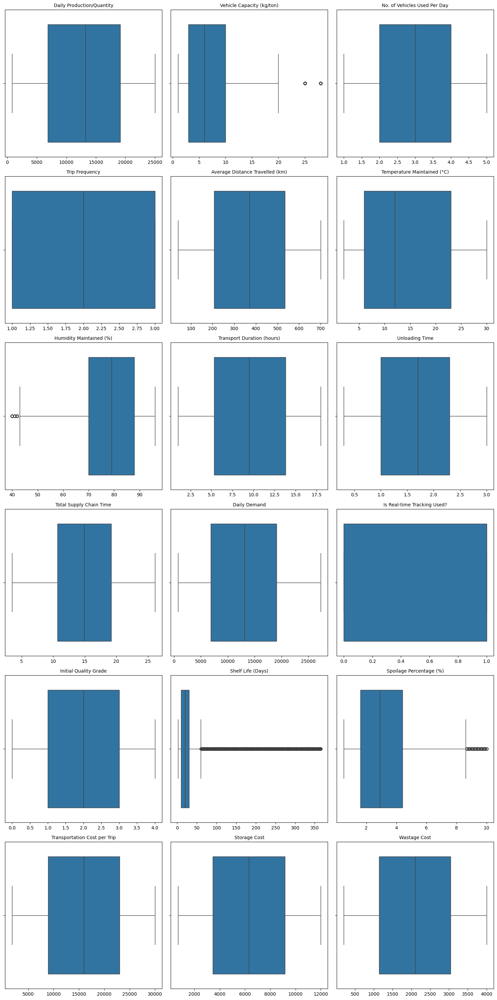

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Identify relevant columns for outlier detection (originally numerical or label encoded ordinal)
# These columns typically start with 'remainder__' after ColumnTransformer
relevant_cols = [col for col in nn039_1.columns if col.startswith('remainder__')]

outliers_info = {}

print("Starting Outlier Analysis (IQR Method):\n")

for col in relevant_cols:
    data = nn039_1[col]

    # Calculate IQR
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1

    # Define outlier bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Find outliers
    outliers = data[(data < lower_bound) | (data > upper_bound)]

    if not outliers.empty:
        outliers_info[col] = {
            'count': len(outliers),
            'percentage': (len(outliers) / len(data)) * 100,
            'lower_bound': lower_bound,
            'upper_bound': upper_bound,
            'outlier_values_sample': outliers.unique().tolist()[:5] # Sample up to 5 unique values
        }


if not outliers_info:
    print("No significant outliers detected in the relevant numerical columns using the IQR method.\n")
else:
    print("Outliers detected in the following columns:\n")
    for col, info in outliers_info.items():
        print(f"--- Column: {col} ---")
        print(f"  Outlier Count: {info['count']}")
        print(f"  Outlier Percentage: {info['percentage']:.2f}%")
        print(f"  Lower Bound: {info['lower_bound']:.2f}")
        print(f"  Upper Bound: {info['upper_bound']:.2f}")
        if info['outlier_values_sample']:
            print(f"  Sample Outlier Values: {info['outlier_values_sample']}")
        print("-" * 30)

# Generate box plots for visualization
print("\nGenerating box plots for visual outlier inspection of relevant numerical columns:\n")
num_plots = len(relevant_cols)
if num_plots > 0:
    # Determine optimal grid size for subplots
    ncols = 3 # Number of columns for subplots
    nrows = (num_plots + ncols - 1) // ncols # Calculate rows needed

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))
    axes = axes.flatten() # Flatten the axes array for easy iteration

    for i, col in enumerate(relevant_cols):
        sns.boxplot(x=nn039_1[col], ax=axes[i])
        axes[i].set_title(col.replace('remainder__', ''), fontsize=10) # Clean up title
        axes[i].set_xlabel('')

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()
else:
    print("No relevant numerical columns found for box plot visualization.")

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import numpy as np
import pandas as pd

# Create a copy of nn039_1 to preserve the original encoded data
nn039_transformed = nn039_1.copy()

# Identify numerical columns (those prefixed with 'remainder__')
numerical_cols_for_scaling = [col for col in nn039_transformed.columns if col.startswith('remainder__')]

print("--- Data Rescaling and Transformation ---\n")

# --- 1. Standardization (Z-score scaling) ---
print("1. Applying Standardization (Z-score scaling):")
scaler = StandardScaler()
nn039_transformed[numerical_cols_for_scaling] = scaler.fit_transform(nn039_transformed[numerical_cols_for_scaling])
print("First 5 rows of data after Standardization:")
print(nn039_transformed[numerical_cols_for_scaling].head())
print("\n")

# To demonstrate other transformations, we'll revert nn039_transformed or create new copies from nn039_1
# Let's create a fresh copy for each transformation for clarity

# --- 2. Normalization (Min-Max Scaling) ---
nn039_minmax = nn039_1.copy()
print("2. Applying Normalization (Min-Max Scaling):")
minmax_scaler = MinMaxScaler()
nn039_minmax[numerical_cols_for_scaling] = minmax_scaler.fit_transform(nn039_minmax[numerical_cols_for_scaling])
print("First 5 rows of data after Min-Max Scaling:")
print(nn039_minmax[numerical_cols_for_scaling].head())
print("\n")

# --- 3. Log Transformation ---
nn039_log_transformed = nn039_1.copy()

# Select columns that are typically positively skewed and have non-negative values for log transformation
# Based on previous outlier analysis, 'Shelf Life (Days)', 'Spoilage Percentage (%)',
# and cost-related columns might benefit.
# Let's apply to a few illustrative columns. Ensure all values are > 0 before applying log.
# Use log1p (log(1+x)) to handle potential zero values.

log_transform_cols = [
    'remainder__Daily Production/Quantity',
    'remainder__Vehicle Capacity (kg/ton)',
    'remainder__Shelf Life (Days)',
    'remainder__Spoilage Percentage (%)',
    'remainder__Transportation Cost per Trip',
    'remainder__Storage Cost',
    'remainder__Wastage Cost'
]

print("3. Applying Log Transformation (np.log1p) to selected columns:")
for col in log_transform_cols:
    if col in nn039_log_transformed.columns:
        # Add a small constant or ensure values are non-negative before log transformation
        # np.log1p(x) computes log(1+x), which is robust for x near zero.
        nn039_log_transformed[col] = np.log1p(nn039_log_transformed[col])
    else:
        print(f"Warning: Column '{col}' not found for log transformation. Skipping.")

print("First 5 rows of data after Log Transformation (selected columns):")
print(nn039_log_transformed[log_transform_cols].head())


--- Data Rescaling and Transformation ---

1. Applying Standardization (Z-score scaling):
First 5 rows of data after Standardization:
   remainder__Daily Production/Quantity  remainder__Vehicle Capacity (kg/ton)  \
0                             -0.099342                             -0.720746   
1                              1.222700                              1.701074   
2                              0.622547                              0.276474   
3                             -1.568547                              0.276474   
4                              1.501683                             -0.863206   

   remainder__No. of Vehicles Used Per Day  remainder__Trip Frequency  \
0                                -1.408829                  -1.218897   
1                                 1.403487                   0.001464   
2                                -0.002671                   1.221826   
3                                 1.403487                   1.221826   
4             

##Data Description

In [ ]:
for col in ordinal_cols:
    print(f"\n--- Descriptive Statistics for '{col}' ---")

    # Calculate count, frequency, and proportion
    counts = nn039_[col].value_counts()
    proportions = nn039_[col].value_counts(normalize=True)

    print("\nValue Counts (Count and Frequency):")
    print(counts)

    print("\nProportions:")
    print(proportions)

    # Determine highest and lowest categories
    highest_category = counts.index[0]
    lowest_category = counts.index[-1]
    print(f"\nHighest Frequency Category: '{highest_category}' (Count: {counts.iloc[0]}) ")
    print(f"Lowest Frequency Category: '{lowest_category}' (Count: {counts.iloc[-1]})\n")

    # Assign rank to each category based on frequency
    ranks = counts.rank(method='dense', ascending=False)
    ranked_categories = pd.DataFrame({'Count': counts, 'Rank': ranks})
    print("Ranked Categories by Frequency:")
    print(ranked_categories.sort_values(by='Rank'))


--- Descriptive Statistics for 'Initial Quality Grade' ---

Value Counts (Count and Frequency):
Initial Quality Grade
AA    1019
A     1017
B+    1010
B     1008
A-     947
Name: count, dtype: int64

Proportions:
Initial Quality Grade
AA    0.203759
A     0.203359
B+    0.201960
B     0.201560
A-    0.189362
Name: proportion, dtype: float64

Highest Frequency Category: 'AA' (Count: 1019) 
Lowest Frequency Category: 'A-' (Count: 947)

Ranked Categories by Frequency:
                       Count  Rank
Initial Quality Grade             
AA                      1019   1.0
A                       1017   2.0
B+                      1010   3.0
B                       1008   4.0
A-                       947   5.0

--- Descriptive Statistics for 'Time of Harvest' ---

Value Counts (Count and Frequency):
Time of Harvest
4:30    345
5:30    334
7:00    334
4:45    330
7:30    323
7:15    319
6:30    318
6:00    316
5:00    314
7:45    313
5:15    306
6:45    298
4:15    296
4:00    291
5:45    2

In [ ]:
for col in nominal_cols:
    print(f"\n--- Descriptive Statistics for '{col}' ---")

    # Calculate count, frequency, and proportion
    counts = nn039_[col].value_counts()
    proportions = nn039_[col].value_counts(normalize=True)

    print("\nValue Counts (Count and Frequency):")
    print(counts)

    print("\nProportions:")
    print(proportions)

    # Determine highest and lowest categories
    highest_category = counts.index[0]
    lowest_category = counts.index[-1]
    print(f"\nHighest Frequency Category: '{highest_category}' (Count: {counts.iloc[0]})")
    print(f"Lowest Frequency Category: '{lowest_category}' (Count: {counts.iloc[-1]})\n")

    # Assign rank to each category based on frequency
    ranks = counts.rank(method='dense', ascending=False)
    ranked_categories = pd.DataFrame({'Count': counts, 'Rank': ranks})
    print("Ranked Categories by Frequency:")
    print(ranked_categories.sort_values(by='Rank'))


--- Descriptive Statistics for 'Product Name' ---

Value Counts (Count and Frequency):
Product Name
Banana                    176
Mango                     176
Tapioca                   174
Green Chilli              171
Grapes                    168
Tomato                    166
Mint (Pudina)             164
Drumstick                 163
Snake Gourd               162
Spinach                   162
Turmeric (Dry)            162
Elephant Yam              158
Bottle Gourd              156
Onion                     153
Garlic                    153
Pomegranate               153
Coriander Leaves          152
Bhindi (Ladies Finger)    152
Banana - Green            149
Cauliflower               148
Wheat                     147
Dry Chillies              144
Rice                      144
Maize                     142
Water Melon               141
Soyabean                  139
Pepper (Ungarbled)        136
Papaya                    135
Cabbage                   135
Apple                     133

In [ ]:
import numpy as np
from scipy import stats

# Assuming 'numerical_cols' is already defined from previous steps
# If not, ensure it's defined: numerical_cols = nn039_.select_dtypes(include=['number']).columns.tolist()

print("### Descriptive Statistics for Non-Categorical Variables (nn039_)\n")

for col in numerical_cols:
    print(f"--- Descriptive Statistics for '{col}' ---")
    data = nn039_[col]

    # Measures of Central Tendency
    min_val = data.min()
    max_val = data.max()
    mean_val = data.mean()
    median_val = data.median()
    mode_val = data.mode()[0] if not data.mode().empty else 'N/A' # mode() can return multiple values

    print(f"Minimum: {min_val}")
    print(f"Maximum: {max_val}")
    print(f"Mean: {mean_val:.2f}")
    print(f"Median: {median_val:.2f}")
    print(f"Mode: {mode_val}")

    # Percentiles
    percentiles = data.quantile([0.25, 0.5, 0.75])
    print("Percentiles:")
    print(f"  25th Percentile (Q1): {percentiles[0.25]:.2f}")
    print(f"  50th Percentile (Median): {percentiles[0.5]:.2f}")
    print(f"  75th Percentile (Q3): {percentiles[0.75]:.2f}")

    # Measures of Dispersion
    std_dev = data.std()
    data_range = max_val - min_val
    sem = data.sem() # Standard Error of the Mean

    print(f"Standard Deviation: {std_dev:.2f}")
    print(f"Range: {data_range:.2f}")
    print(f"Standard Error of the Mean: {sem:.2f}")

    # Composite Measures
    skewness = data.skew()
    kurtosis = data.kurt()
    cov = (std_dev / mean_val) * 100 if mean_val != 0 else np.nan # Coefficient of Variation

    print(f"Skewness: {skewness:.2f}")
    print(f"Kurtosis: {kurtosis:.2f}")
    print(f"Coefficient of Variation: {cov:.2f}%")

    # Confidence Interval for the Mean (95% CI)
    # Assuming t-distribution for confidence interval due to finite sample size
    confidence_level = 0.95
    degrees_freedom = len(data) - 1
    confidence_interval = stats.t.interval(
        confidence_level,
        degrees_freedom,
        loc=mean_val,
        scale=sem
    )
    print(f"95% Confidence Interval for the Mean: ({confidence_interval[0]:.2f}, {confidence_interval[1]:.2f})")
    print("-" * 50)

print("\n### Correlation Matrices for Non-Categorical Variables (nn039_)\n")

# Measures of Correlation
print("Pearson Correlation Coefficient:")
pearson_corr = nn039_[numerical_cols].corr(method='pearson')
print(pearson_corr)
print("\n" + "-" * 50 + "\n")

print("Spearman's Rank Correlation Coefficient:")
spearman_corr = nn039_[numerical_cols].corr(method='spearman')
print(spearman_corr)
print("\n" + "-" * 50 + "\n")

print("Kendall's Tau Correlation Coefficient:")
kendall_corr = nn039_[numerical_cols].corr(method='kendall')
print(kendall_corr)
print("\n" + "-" * 50 + "\n")

### Descriptive Statistics for Non-Categorical Variables (nn039_)

--- Descriptive Statistics for 'Daily Production/Quantity' ---
Minimum: 811
Maximum: 24997
Mean: 13035.36
Median: 13227.00
Mode: 11198
Percentiles:
  25th Percentile (Q1): 6864.00
  50th Percentile (Median): 13227.00
  75th Percentile (Q3): 19134.00
Standard Deviation: 7040.57
Range: 24186.00
Standard Error of the Mean: 99.56
Skewness: -0.05
Kurtosis: -1.20
Coefficient of Variation: 54.01%
95% Confidence Interval for the Mean: (12840.18, 13230.53)
--------------------------------------------------
--- Descriptive Statistics for 'Vehicle Capacity (kg/ton)' ---
Minimum: 1.0
Maximum: 28.0
Mean: 8.06
Median: 6.00
Mode: 5.0
Percentiles:
  25th Percentile (Q1): 3.00
  50th Percentile (Median): 6.00
  75th Percentile (Q3): 10.00
Standard Deviation: 7.02
Range: 27.00
Standard Error of the Mean: 0.10
Skewness: 1.46
Kurtosis: 1.41
Coefficient of Variation: 87.11%
95% Confidence Interval for the Mean: (7.86, 8.25)
----------------

##Data Visualisation


--- Bar Charts for Selected Nominal Variables ---



/tmp/ipython-input-1183503526.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=nn039_, y=col, order=nn039_[col].value_counts().index, palette='viridis')
/tmp/ipython-input-1183503526.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=nn039_, y=col, order=nn039_[col].value_counts().index, palette='viridis')
/tmp/ipython-input-1183503526.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=nn039_, y=col, order=nn039_[col].value_counts().index, palette='viridis')
/tmp/ipython-input-1183503526.py:12: FutureWarning: 

P

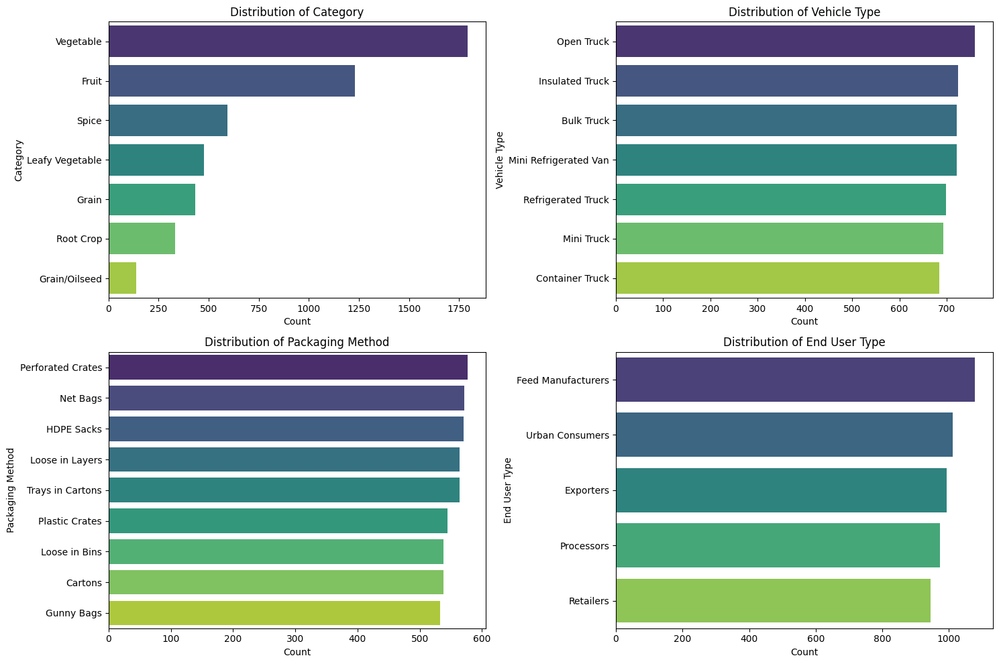


--- Bar Charts for Selected Ordinal Variables ---



/tmp/ipython-input-1183503526.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=nn039_, y=col, order=nn039_[col].value_counts().index, palette='magma')
/tmp/ipython-input-1183503526.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=nn039_, y=col, order=nn039_[col].value_counts().index, palette='magma')
/tmp/ipython-input-1183503526.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=nn039_, y=col, order=nn039_[col].value_counts().index, palette='magma')


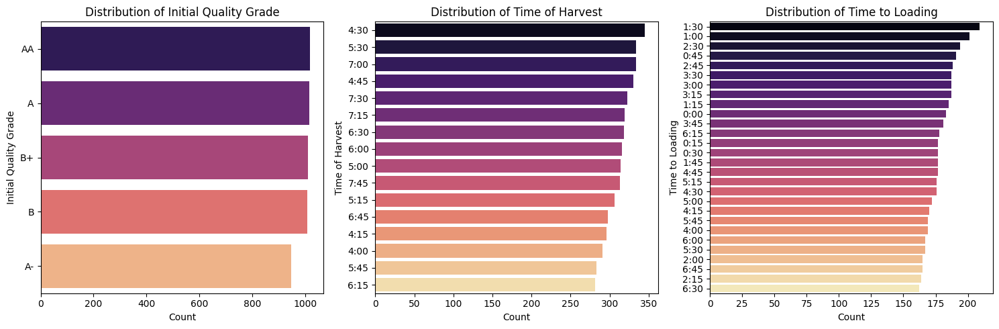


--- Pie Chart for 'Is Real-time Tracking Used?' ---



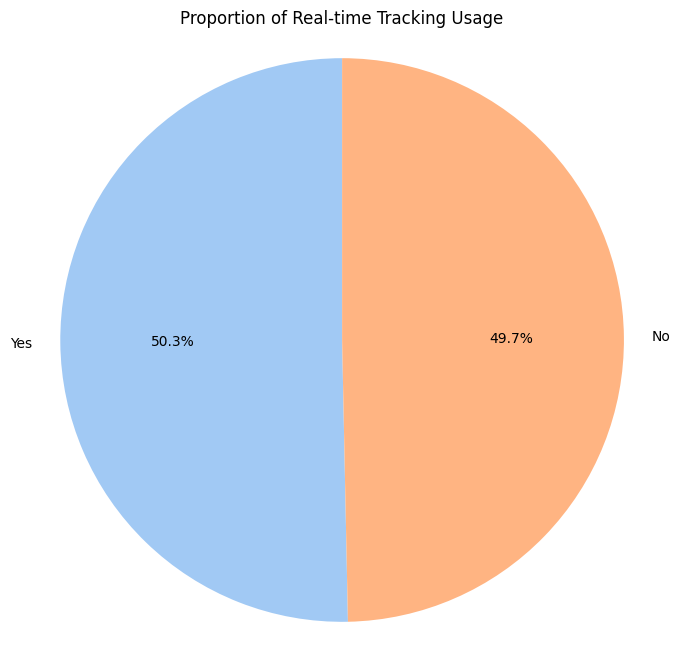

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Bar Charts for Nominal Variables ---
print("\n--- Bar Charts for Selected Nominal Variables ---\n")

nominal_plot_cols = ['Category', 'Vehicle Type', 'Packaging Method', 'End User Type']

plt.figure(figsize=(15, 10))
for i, col in enumerate(nominal_plot_cols):
    plt.subplot(2, 2, i + 1)
    sns.countplot(data=nn039_, y=col, order=nn039_[col].value_counts().index, palette='viridis')
    plt.title(f'Distribution of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

# --- Bar Charts for Ordinal Variables ---
print("\n--- Bar Charts for Selected Ordinal Variables ---\n")

ordinal_plot_cols = ['Initial Quality Grade', 'Time of Harvest', 'Time to Loading'] # Excluding 'Is Real-time Tracking Used?' for pie chart

plt.figure(figsize=(15, 5))
for i, col in enumerate(ordinal_plot_cols):
    plt.subplot(1, 3, i + 1)
    sns.countplot(data=nn039_, y=col, order=nn039_[col].value_counts().index, palette='magma')
    plt.title(f'Distribution of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

# --- Pie Chart for a Binary Ordinal Variable ---
print("\n--- Pie Chart for 'Is Real-time Tracking Used?' ---\n")

tracking_counts = nn039_['Is Real-time Tracking Used?'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(tracking_counts, labels=tracking_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
plt.title('Proportion of Real-time Tracking Usage')
plt.axis('equal') # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()


--- Histograms/KDE Plots for Selected Numerical Variables ---



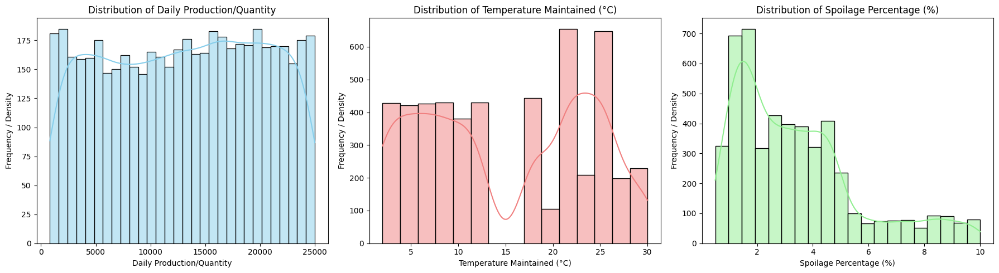


--- Scatter Plots for Relationships Between Numerical Variables ---



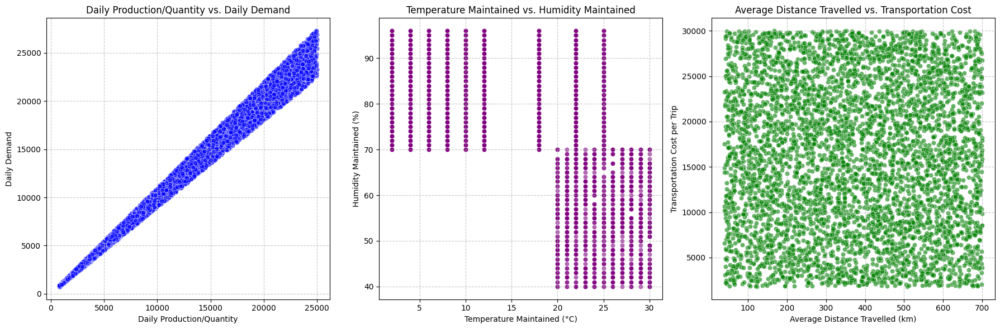

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Histograms/KDE Plots for Individual Distributions ---
print("\n--- Histograms/KDE Plots for Selected Numerical Variables ---\n")

plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
sns.histplot(nn039_['Daily Production/Quantity'], kde=True, color='skyblue', bins=30)
plt.title('Distribution of Daily Production/Quantity')
plt.xlabel('Daily Production/Quantity')
plt.ylabel('Frequency / Density')

plt.subplot(1, 3, 2)
sns.histplot(nn039_['Temperature Maintained (°C)'], kde=True, color='lightcoral', bins=15)
plt.title('Distribution of Temperature Maintained (°C)')
plt.xlabel('Temperature Maintained (°C)')
plt.ylabel('Frequency / Density')

plt.subplot(1, 3, 3)
sns.histplot(nn039_['Spoilage Percentage (%)'], kde=True, color='lightgreen', bins=20)
plt.title('Distribution of Spoilage Percentage (%)')
plt.xlabel('Spoilage Percentage (%)')
plt.ylabel('Frequency / Density')

plt.tight_layout()
plt.show()

# --- Scatter Plots for Relationships Between Numerical Variables ---
print("\n--- Scatter Plots for Relationships Between Numerical Variables ---\n")

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
sns.scatterplot(data=nn039_, x='Daily Production/Quantity', y='Daily Demand', alpha=0.6, color='blue')
plt.title('Daily Production/Quantity vs. Daily Demand')
plt.xlabel('Daily Production/Quantity')
plt.ylabel('Daily Demand')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.scatterplot(data=nn039_, x='Temperature Maintained (°C)', y='Humidity Maintained (%)', alpha=0.6, color='purple')
plt.title('Temperature Maintained vs. Humidity Maintained')
plt.xlabel('Temperature Maintained (°C)')
plt.ylabel('Humidity Maintained (%)')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.scatterplot(data=nn039_, x='Average Distance Travelled (km)', y='Transportation Cost per Trip', alpha=0.6, color='green')
plt.title('Average Distance Travelled vs. Transportation Cost')
plt.xlabel('Average Distance Travelled (km)')
plt.ylabel('Transportation Cost per Trip')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


--- Pair Plot for Selected Numerical Variables ---



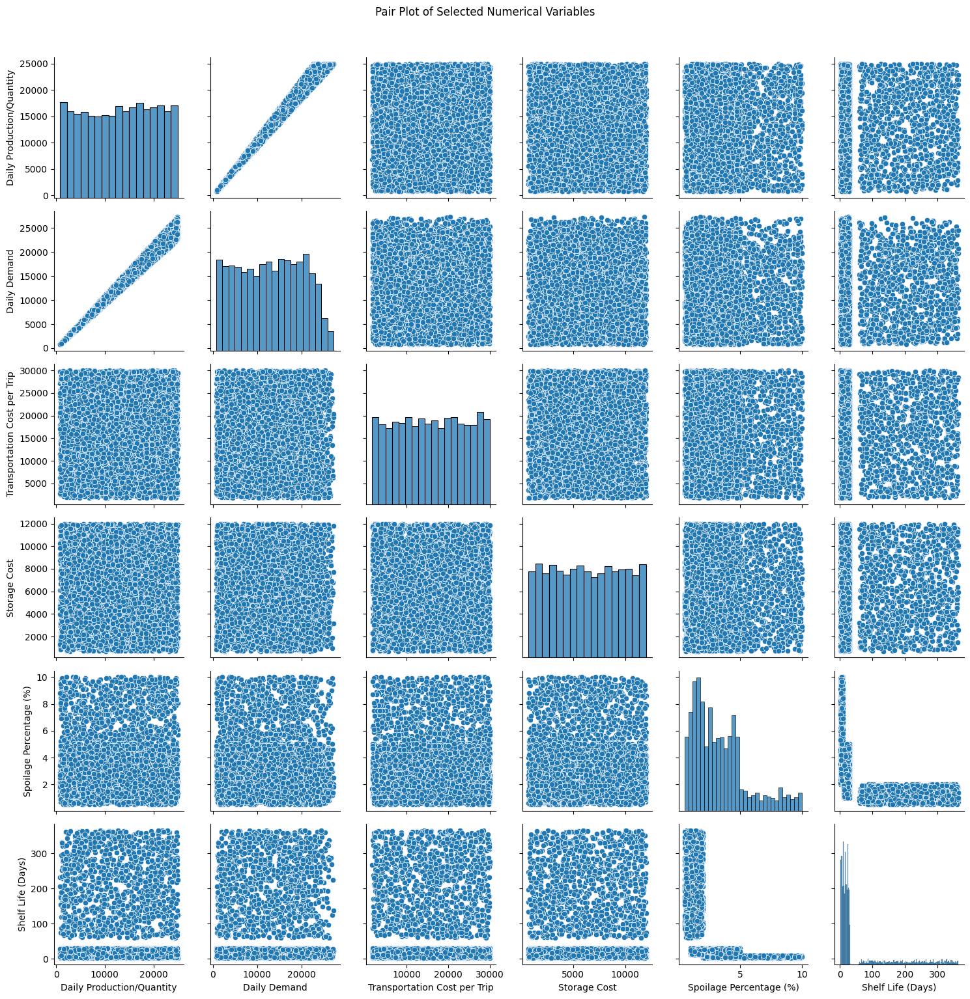

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Pair Plot for Selected Numerical Variables ---\n")

# Select a subset of numerical columns for the pair plot
# A pair plot with too many columns can be very busy
pair_plot_cols = [
    'Daily Production/Quantity', 'Daily Demand',
    'Transportation Cost per Trip', 'Storage Cost',
    'Spoilage Percentage (%)', 'Shelf Life (Days)'
]

# Ensure the selected columns exist in nn039_
existing_pair_plot_cols = [col for col in pair_plot_cols if col in nn039_.columns]

if existing_pair_plot_cols:
    # Create a Pair Plot
    # hue could be added for a categorical variable if desired, e.g., hue='Category'
    sns.pairplot(nn039_[existing_pair_plot_cols])
    plt.suptitle('Pair Plot of Selected Numerical Variables', y=1.02) # Adjust title position
    plt.tight_layout()
    plt.show()
else:
    print("No selected numerical columns found for pair plot.")


--- Heatmap of Pearson Correlation Matrix ---



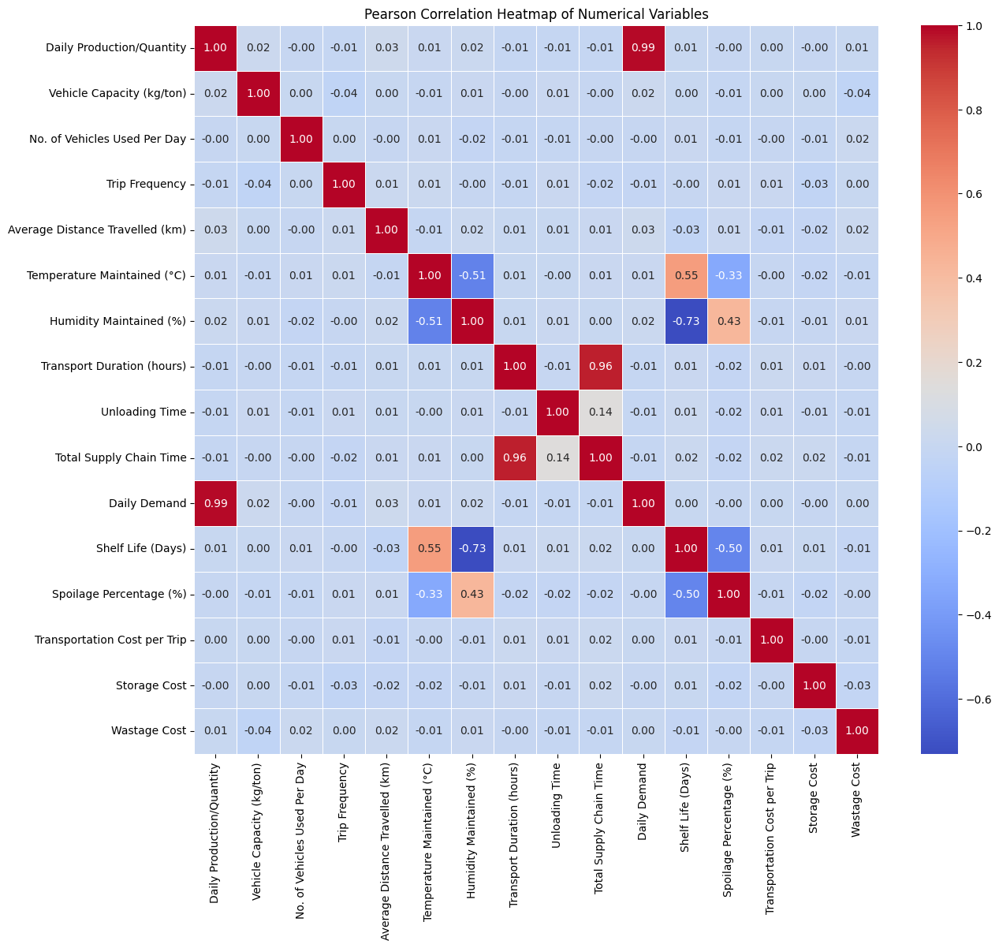

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Heatmap of Pearson Correlation Matrix ---\n")

# We'll use the 'pearson_corr' DataFrame calculated earlier
# Ensure it exists and is updated with the nn039_ data
# If it wasn't refreshed after imputation, calculate it again from nn039_
if 'pearson_corr' not in locals():
    # If pearson_corr was not in the kernel state, re-calculate it
    numerical_cols = nn039_.select_dtypes(include=['number']).columns.tolist()
    pearson_corr = nn039_[numerical_cols].corr(method='pearson')

plt.figure(figsize=(14, 12))
sns.heatmap(pearson_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Pearson Correlation Heatmap of Numerical Variables')
plt.show()

##Inferential Statistics

In [ ]:
from scipy.stats import chi2_contingency
import pandas as pd

print("--- Chi-square Test of Homogeneity for Categorical Variables ---\n")

# Select two categorical variables for the test from the original nn039_ DataFrame
var1 = 'Category'
var2 = 'Vehicle Type'

# Create a contingency table
contingency_table = pd.crosstab(nn039_[var1], nn039_[var2])

print(f"Contingency Table for '{var1}' vs. '{var2}':")
print(contingency_table)
print("\n")

# Perform the Chi-square test
chi2, p_value, dof, expected = chi2_contingency(contingency_table)

print(f"Chi-square Statistic: {chi2:.2f}")
print(f"P-value: {p_value:.3f}")
print(f"Degrees of Freedom: {dof}")
print("Expected Frequencies (first 5x5 if large):")
print(pd.DataFrame(expected, index=contingency_table.index, columns=contingency_table.columns).head())

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print(f"\nSince the p-value ({p_value:.3f}) is less than the significance level ({alpha}), we reject the null hypothesis.")
    print(f"There is a statistically significant association between '{var1}' and '{var2}'.")
    print(f"This suggests that the distribution of '{var2}' is not homogeneous across different '{var1}' categories.")
else:
    print(f"\nSince the p-value ({p_value:.3f}) is greater than the significance level ({alpha}), we fail to reject the null hypothesis.")
    print(f"There is no statistically significant association between '{var1}' and '{var2}'.")
    print(f"This suggests that the distribution of '{var2}' is homogeneous across different '{var1}' categories.")


--- Chi-square Test of Homogeneity for Categorical Variables ---

Contingency Table for 'Category' vs. 'Vehicle Type':
Vehicle Type     Bulk Truck  Container Truck  Insulated Truck  \
Category                                                        
Fruit                   185              163              188   
Grain                    63               46               61   
Grain/Oilseed            23               21               20   
Leafy Vegetable          72               64               48   
Root Crop                45               55               47   
Spice                    87               80               95   
Vegetable               246              255              265   

Vehicle Type     Mini Refrigerated Van  Mini Truck  Open Truck  \
Category                                                         
Fruit                              161         179         186   
Grain                               69          57          67   
Grain/Oilseed                  

In [ ]:
from scipy.stats import shapiro, kstest
from sklearn.preprocessing import StandardScaler

# Define a list of the four columns to be tested
columns_to_test = [
    'remainder__Daily Production/Quantity',
    'remainder__Spoilage Percentage (%)',
    'remainder__Shelf Life (Days)',
    'remainder__Transportation Cost per Trip'
]

alpha = 0.05 # Significance level

print("### Normality Tests for Selected Numerical Columns from nn039_1 ###\n")

for col in columns_to_test:
    print(f"--- Testing Normality for '{col.replace('remainder__', '')}' ---")

    # Extract data for the current column
    data = nn039_1[col]

    # --- Shapiro-Wilk Test ---
    print("\nShapiro-Wilk Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution.")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.")

    stat_shapiro, p_shapiro = shapiro(data)
    print(f"  Test Statistic: {stat_shapiro:.4f}")
    print(f"  P-value: {p_shapiro:.4f}")

    if p_shapiro < alpha:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) < alpha ({alpha}), we reject H0. The data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_shapiro:.4f}) >= alpha ({alpha}), we fail to reject H0. The data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    # --- Kolmogorov-Smirnov Test ---
    print("\nKolmogorov-Smirnov Test:")
    print("  Null Hypothesis (H0): The data is drawn from a normal distribution (after standardization).")
    print("  Alternative Hypothesis (H1): The data is not drawn from a normal distribution (after standardization).")

    # Standardize the data for K-S test against a normal distribution
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data.to_frame())

    stat_kstest, p_kstest = kstest(scaled_data.flatten(), 'norm')
    print(f"  Test Statistic: {stat_kstest:.4f}")
    print(f"  P-value: {p_kstest:.4f}")

    if p_kstest < alpha:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) < alpha ({alpha}), we reject H0. The standardized data for '{col.replace('remainder__', '')}' is NOT normally distributed.")
    else:
        print(f"  Interpretation: Since p-value ({p_kstest:.4f}) >= alpha ({alpha}), we fail to reject H0. The standardized data for '{col.replace('remainder__', '')}' appears to be normally distributed.")

    print("=" * 60 + "\n")

### Normality Tests for Selected Numerical Columns from nn039_1 ###

--- Testing Normality for 'Daily Production/Quantity' ---

Shapiro-Wilk Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution.
  Alternative Hypothesis (H1): The data is not drawn from a normal distribution.
  Test Statistic: 0.9535
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The data for 'Daily Production/Quantity' is NOT normally distributed.

Kolmogorov-Smirnov Test:
  Null Hypothesis (H0): The data is drawn from a normal distribution (after standardization).
  Alternative Hypothesis (H1): The data is not drawn from a normal distribution (after standardization).
  Test Statistic: 0.0604
  P-value: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject H0. The standardized data for 'Daily Production/Quantity' is NOT normally distributed.

--- Testing Normality for 'Spoilage Percentage (%)' ---

Shapiro-Wilk Test:
  Null Hypothesis (

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)


### Visual Normality Checks for Selected Numerical Columns from nn039_1 ###



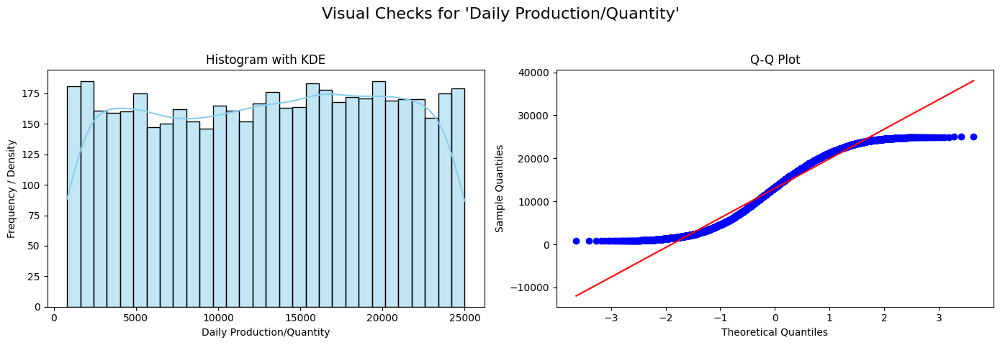

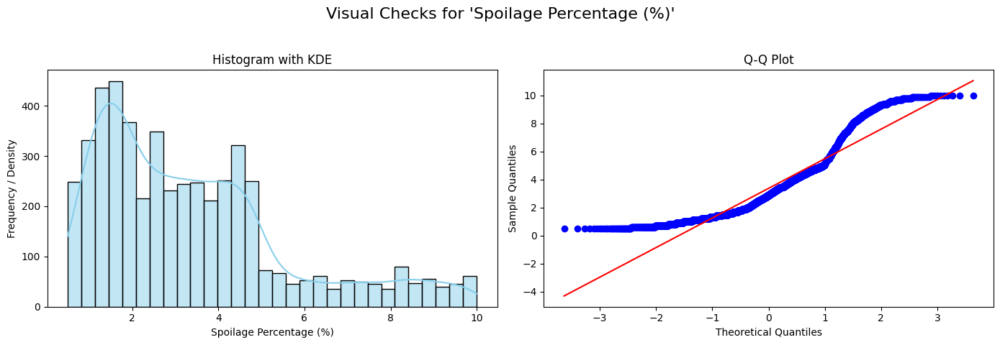

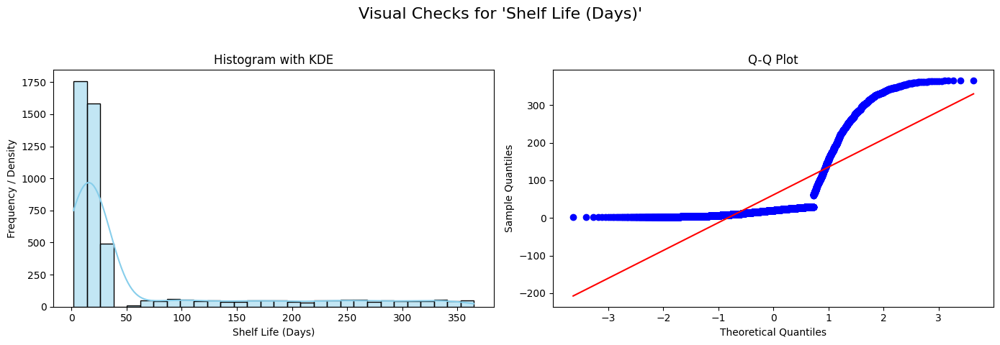

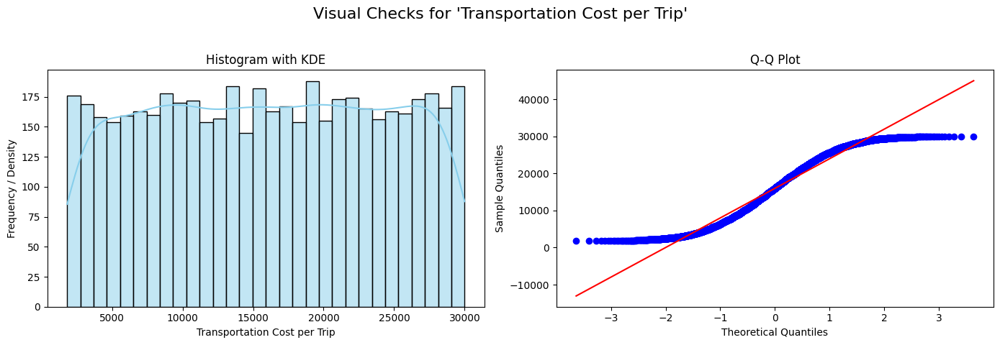

Visual checks completed.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import probplot

# Define a list of the four columns to be tested (same as previous cell)
columns_to_test = [
    'remainder__Daily Production/Quantity',
    'remainder__Spoilage Percentage (%)',
    'remainder__Shelf Life (Days)',
    'remainder__Transportation Cost per Trip'
]

print("### Visual Normality Checks for Selected Numerical Columns from nn039_1 ###\n")

for col in columns_to_test:
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(f"Visual Checks for '{col.replace('remainder__', '')}'", fontsize=16)

    # --- Histogram with KDE Overlay ---
    sns.histplot(nn039_1[col], kde=True, ax=axes[0], color='skyblue', bins=30)
    axes[0].set_title('Histogram with KDE')
    axes[0].set_xlabel(col.replace('remainder__', ''))
    axes[0].set_ylabel('Frequency / Density')

    # --- Q-Q Plot ---
    probplot(nn039_1[col], dist="norm", plot=axes[1])
    axes[1].set_title('Q-Q Plot')
    axes[1].set_xlabel('Theoretical Quantiles')
    axes[1].set_ylabel('Sample Quantiles')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
    plt.show()

print("Visual checks completed.")

In [ ]:
from scipy.stats import pearsonr

# Define the pairs of columns for correlation analysis
correlation_pairs = [
    ('remainder__Daily Production/Quantity', 'remainder__Daily Demand'),
    ('remainder__Temperature Maintained (°C)', 'remainder__Humidity Maintained (%)')
]

print("### Pearson Correlation and Significance Tests ###\n")

for col1, col2 in correlation_pairs:
    print(f"--- Analyzing Correlation between '{col1.replace('remainder__', '')}' and '{col2.replace('remainder__', '')}' ---")

    # Calculate Pearson correlation coefficient and p-value
    correlation, p_value = pearsonr(nn039_1[col1], nn039_1[col2])

    print(f"  Pearson Correlation Coefficient: {correlation:.4f}")
    print(f"  P-value from t-test for significance: {p_value:.4f}")

    # Interpret the significance
    alpha = 0.05 # Significance level
    if p_value < alpha:
        print(f"  Interpretation: Since p-value ({p_value:.4f}) < alpha ({alpha}), we reject the null hypothesis.")
        print(f"  The observed correlation ({correlation:.4f}) is statistically significant.")
    else:
        print(f"  Interpretation: Since p-value ({p_value:.4f}) >= alpha ({alpha}), we fail to reject the null hypothesis.")
        print(f"  The observed correlation ({correlation:.4f}) is NOT statistically significant.")
    print("=" * 70 + "\n")


### Pearson Correlation and Significance Tests ###

--- Analyzing Correlation between 'Daily Production/Quantity' and 'Daily Demand' ---
  Pearson Correlation Coefficient: 0.9927
  P-value from t-test for significance: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject the null hypothesis.
  The observed correlation (0.9927) is statistically significant.

--- Analyzing Correlation between 'Temperature Maintained (°C)' and 'Humidity Maintained (%)' ---
  Pearson Correlation Coefficient: -0.5133
  P-value from t-test for significance: 0.0000
  Interpretation: Since p-value (0.0000) < alpha (0.05), we reject the null hypothesis.
  The observed correlation (-0.5133) is statistically significant.



### Summary of Findings

**1. Normality Tests (Shapiro-Wilk and Kolmogorov-Smirnov):**

For all four tested columns ('Daily Production/Quantity', 'Spoilage Percentage (%)', 'Shelf Life (Days)', and 'Transportation Cost per Trip'), both the Shapiro-Wilk and Kolmogorov-Smirnov tests yielded p-values less than 0.05 (the significance level).

*   **Daily Production/Quantity**: Both tests rejected the null hypothesis, indicating that the data is **not normally distributed**.
*   **Spoilage Percentage (%)**: Both tests rejected the null hypothesis, indicating that the data is **not normally distributed**.
*   **Shelf Life (Days)**: Both tests rejected the null hypothesis, indicating that the data is **not normally distributed**.
*   **Transportation Cost per Trip**: Both tests rejected the null hypothesis, indicating that the data is **not normally distributed**.

This consistently suggests that none of these numerical variables follow a normal distribution, according to the statistical tests.

**2. Visual Normality Checks (Histograms with KDE and Q-Q Plots):**

*   **Daily Production/Quantity**: The histogram shows a somewhat uniform distribution, not a bell-shaped curve. The Q-Q plot's points deviate significantly from the red line, especially at the tails, confirming **non-normality**.
*   **Spoilage Percentage (%)**: The histogram is right-skewed, and the Q-Q plot shows clear deviations from the normal distribution line, indicating **non-normality**.
*   **Shelf Life (Days)**: The histogram is highly right-skewed, with most values concentrated at the lower end. The Q-Q plot's points strongly curve away from the theoretical quantiles, indicating severe **non-normality**.
*   **Transportation Cost per Trip**: Similar to 'Daily Production/Quantity', the histogram appears somewhat uniform, and the Q-Q plot deviates from the red line, confirming **non-normality**.

The visual inspections strongly support the statistical test results, confirming that all four selected columns are not normally distributed.

**3. Pearson Correlation and Significance Tests:**

*   **'Daily Production/Quantity' vs. 'Daily Demand'**:
    *   Pearson Correlation Coefficient: 0.9927
    *   P-value: 0.0000
    *   **Interpretation**: The p-value (0.0000) is less than the significance level (0.05), so we reject the null hypothesis. The observed correlation (0.9927) is **statistically significant and very strong positive**.

*   **'Temperature Maintained (°C)' vs. 'Humidity Maintained (%)'**:
    *   Pearson Correlation Coefficient: -0.5133
    *   P-value: 0.0000
    *   **Interpretation**: The p-value (0.0000) is less than the significance level (0.05), so we reject the null hypothesis. The observed correlation (-0.5133) is **statistically significant and moderately negative**.

**Overall Conclusion:**

*   All four numerical variables tested ('Daily Production/Quantity', 'Spoilage Percentage (%)', 'Shelf Life (Days)', 'Transportation Cost per Trip') show **significant deviations from a normal distribution**, as evidenced by both statistical tests and visual checks.
*   There is a **very strong and statistically significant positive correlation** between 'Daily Production/Quantity' and 'Daily Demand'.
*   There is a **moderately strong and statistically significant negative correlation** between 'Temperature Maintained (°C)' and 'Humidity Maintained (%)'.

##Decision Trees (DT)

In [ ]:
y = nn039_1['remainder__Spoilage Percentage (%)']
X = nn039_1.drop('remainder__Spoilage Percentage (%)', axis=1)

print(f"Shape of features (X): {X.shape}")
print(f"Shape of target (y): {y.shape}")
print("First 5 rows of features (X):")
print(X.head())
print("First 5 values of target (y):")
print(y.head())

Shape of features (X): (5001, 175)
Shape of target (y): (5001,)
First 5 rows of features (X):
   onehot__Who Receives the Goods?_Cold Storage Operator  \
0                                                0.0       
1                                                1.0       
2                                                0.0       
3                                                0.0       
4                                                0.0       

   onehot__Who Receives the Goods?_Commission Agent  \
0                                               0.0   
1                                               0.0   
2                                               0.0   
3                                               1.0   
4                                               0.0   

   onehot__Who Receives the Goods?_Exporter  \
0                                       0.0   
1                                       0.0   
2                                       0.0   
3                         

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Shape of X_train: {X_train.shape}")
print(f"Shape of X_test: {X_test.shape}")
print(f"Shape of y_train: {y_train.shape}")
print(f"Shape of y_test: {y_test.shape}")


Shape of X_train: (4000, 175)
Shape of X_test: (1001, 175)
Shape of y_train: (4000,)
Shape of y_test: (1001,)


In [ ]:
from sklearn.tree import DecisionTreeRegressor

# Initialize the Decision Tree Regressor model
dt_regressor = DecisionTreeRegressor(random_state=42)

# Fit the model to the training data
dt_regressor.fit(X_train, y_train)

print("Decision Tree Regressor model trained successfully.")

Decision Tree Regressor model trained successfully.


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Make predictions on the test data
y_pred = dt_regressor.predict(X_test)

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Print the metrics
print("--- Model Evaluation Metrics ---")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"R-squared (R2) Score: {r2:.4f}")

--- Model Evaluation Metrics ---
Mean Absolute Error (MAE): 1.4302
Mean Squared Error (MSE): 3.8825
Root Mean Squared Error (RMSE): 1.9704
R-squared (R2) Score: 0.2128



--- Visualizing Actual vs. Predicted Values ---


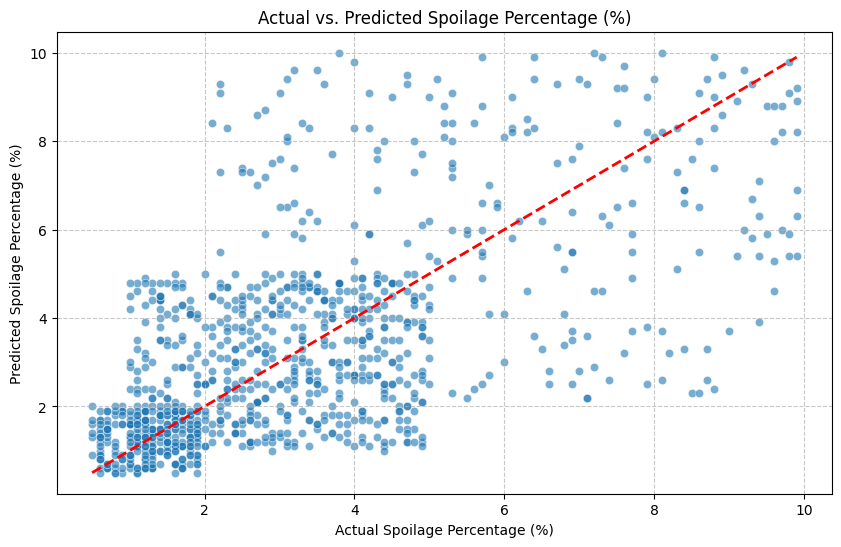


--- Feature Importances ---
Top 10 Feature Importances:
                                        feature  importance
171                remainder__Shelf Life (Days)    0.595007
166                   remainder__Unloading Time    0.027958
174                     remainder__Wastage Cost    0.027010
164          remainder__Humidity Maintained (%)    0.023313
158        remainder__Daily Production/Quantity    0.022252
172     remainder__Transportation Cost per Trip    0.021859
162  remainder__Average Distance Travelled (km)    0.021046
173                     remainder__Storage Cost    0.019672
168                     remainder__Daily Demand    0.018100
165       remainder__Transport Duration (hours)    0.015116


/tmp/ipython-input-2624049679.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=feature_importances.head(10), palette='viridis')


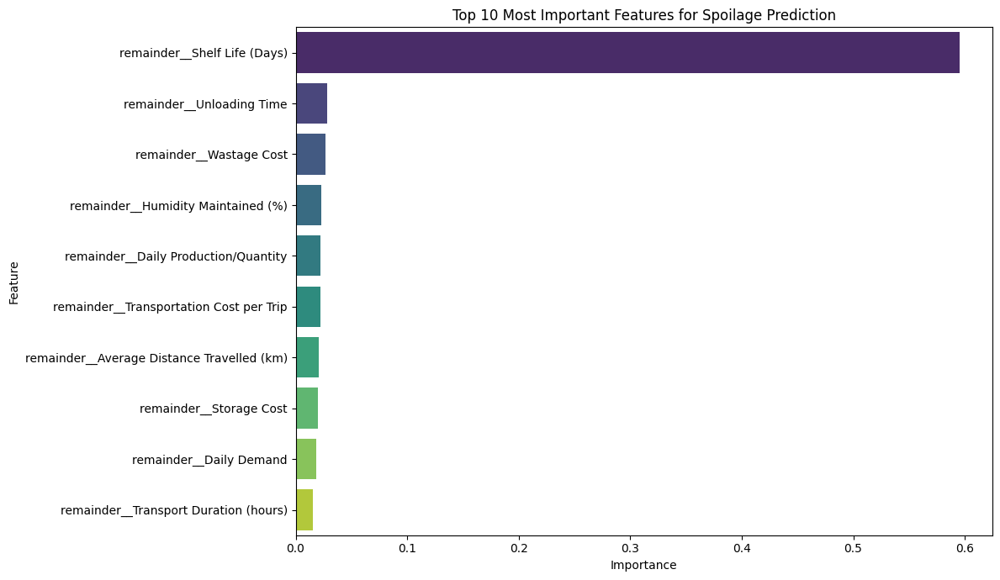

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Visualize Predictions: Actual vs. Predicted Values ---
print("\n--- Visualizing Actual vs. Predicted Values ---")
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2) # Plotting the perfect prediction line
plt.title('Actual vs. Predicted Spoilage Percentage (%)')
plt.xlabel('Actual Spoilage Percentage (%)')
plt.ylabel('Predicted Spoilage Percentage (%)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# --- Feature Importance ---
print("\n--- Feature Importances ---")
feature_importances = pd.DataFrame({'feature': X.columns, 'importance': dt_regressor.feature_importances_})
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

print("Top 10 Feature Importances:")
print(feature_importances.head(10))

# Visualize top N feature importances
plt.figure(figsize=(12, 7))
sns.barplot(x='importance', y='feature', data=feature_importances.head(10), palette='viridis')
plt.title('Top 10 Most Important Features for Spoilage Prediction')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

### Summary of Decision Tree Regressor Model Findings

This section summarizes the performance of the Decision Tree Regressor model trained to predict 'Spoilage Percentage (%)' and the insights gained from feature importance analysis.

**1. Model Evaluation Metrics:**

The evaluation metrics provide a quantitative assessment of the model's performance on the unseen test data:

*   **Mean Absolute Error (MAE):** `1.4302`
    *   Interpretation: On average, the model's predictions for spoilage percentage deviate from the actual values by approximately 1.43 percentage points.
*   **Mean Squared Error (MSE):** `3.8825`
    *   Interpretation: This metric penalizes larger errors more heavily. Its square root, RMSE, is more interpretable.
*   **Root Mean Squared Error (RMSE):** `1.9704`
    *   Interpretation: The typical magnitude of the prediction error is about 1.97 percentage points.
*   **R-squared (R2) Score:** `0.2128`
    *   Interpretation: The model explains approximately 21.28% of the variance in the 'Spoilage Percentage (%)'. This indicates that a significant portion of the variance is not explained by the model, suggesting that the model has limited predictive power for this dataset, or that a more complex model or different features might be needed.

**2. Visualizing Predictions (Actual vs. Predicted):**

The scatter plot of actual vs. predicted values visually confirms the R-squared score. The points are quite scattered around the ideal `y=x` line, particularly for higher spoilage percentages. This suggests that while the model captures some general trend, its predictions are not consistently close to the actual values, especially when spoilage is high.

**3. Feature Importance:**

The feature importance analysis reveals which input variables contribute most to the model's predictions:

*   **`remainder__Shelf Life (Days)`: `0.5950`**
    *   Interpretation: 'Shelf Life (Days)' is by far the most important feature, contributing almost 60% to the model's decision-making. This suggests that the inherent shelf life of a product is the primary driver of its spoilage percentage.
*   **`remainder__Unloading Time`: `0.0280`**
*   **`remainder__Wastage Cost`: `0.0270`**
*   **`remainder__Humidity Maintained (%)`: `0.0233`**
*   **`remainder__Daily Production/Quantity`: `0.0223`**
*   **`remainder__Transportation Cost per Trip`: `0.0219`**
*   **`remainder__Average Distance Travelled (km)`: `0.0210`**
*   **`remainder__Storage Cost`: `0.0197`**
*   **`remainder__Daily Demand`: `0.0181`**
*   **`remainder__Transport Duration (hours)`: `0.0151`**

Interpretation: While 'Shelf Life (Days)' dominates, other factors like 'Unloading Time', 'Wastage Cost', 'Humidity Maintained (%)', and 'Daily Production/Quantity' also play a role, albeit a much smaller one. The high importance of 'Shelf Life (Days)' is intuitive, as perishable goods naturally have a higher spoilage risk associated with their intrinsic shelf life.

**Overall Conclusion:**

The Decision Tree Regressor model, as currently configured, provides a moderate level of explanation for spoilage percentage (R2 = 0.2128). The most critical factor influencing spoilage is clearly the 'Shelf Life (Days)' of the product, overshadowing all other features significantly. While other factors contribute, their individual impact is much smaller. The scatter plot further illustrates that the model's predictive accuracy, especially for higher spoilage rates, could be improved.

##K-Nearest Neighbors (KNN)

In [ ]:
y = nn039_1['remainder__Spoilage Percentage (%)']
X = nn039_1.drop('remainder__Spoilage Percentage (%)', axis=1)

print(f"Shape of features (X): {X.shape}")
print(f"Shape of target (y): {y.shape}")
print("First 5 rows of features (X):")
print(X.head())
print("First 5 values of target (y):")
print(y.head())

Shape of features (X): (5001, 175)
Shape of target (y): (5001,)
First 5 rows of features (X):
   onehot__Who Receives the Goods?_Cold Storage Operator  \
0                                                0.0       
1                                                1.0       
2                                                0.0       
3                                                0.0       
4                                                0.0       

   onehot__Who Receives the Goods?_Commission Agent  \
0                                               0.0   
1                                               0.0   
2                                               0.0   
3                                               1.0   
4                                               0.0   

   onehot__Who Receives the Goods?_Exporter  \
0                                       0.0   
1                                       0.0   
2                                       0.0   
3                         

### Split Data


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Shape of X_train: {X_train.shape}")
print(f"Shape of X_test: {X_test.shape}")
print(f"Shape of y_train: {y_train.shape}")
print(f"Shape of y_test: {y_test.shape}")

Shape of X_train: (4000, 175)
Shape of X_test: (1001, 175)
Shape of y_train: (4000,)
Shape of y_test: (1001,)


### Train KNN Regressor Model


In [ ]:
from sklearn.neighbors import KNeighborsRegressor

# Initialize the KNeighborsRegressor model
# Using n_neighbors=5 as a common starting point
# random_state is not a parameter for KNeighborsRegressor, so it's omitted.
knn_regressor = KNeighborsRegressor(n_neighbors=5)

# Fit the model to the training data
knn_regressor.fit(X_train, y_train)

print("KNeighborsRegressor model trained successfully.")

KNeighborsRegressor model trained successfully.


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Make predictions on the test data
y_pred_knn = knn_regressor.predict(X_test)

# Calculate evaluation metrics
mae_knn = mean_absolute_error(y_test, y_pred_knn)
mse_knn = mean_squared_error(y_test, y_pred_knn)
rmse_knn = np.sqrt(mse_knn)
r2_knn = r2_score(y_test, y_pred_knn)

# Print the metrics
print("--- KNN Model Evaluation Metrics ---")
print(f"Mean Absolute Error (MAE): {mae_knn:.4f}")
print(f"Mean Squared Error (MSE): {mse_knn:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_knn:.4f}")
print(f"R-squared (R2) Score: {r2_knn:.4f}")

--- KNN Model Evaluation Metrics ---
Mean Absolute Error (MAE): 1.9028
Mean Squared Error (MSE): 5.9240
Root Mean Squared Error (RMSE): 2.4339
R-squared (R2) Score: -0.2012


### Visualize KNN Model Predictions


--- Visualizing Actual vs. Predicted Values for KNN ---


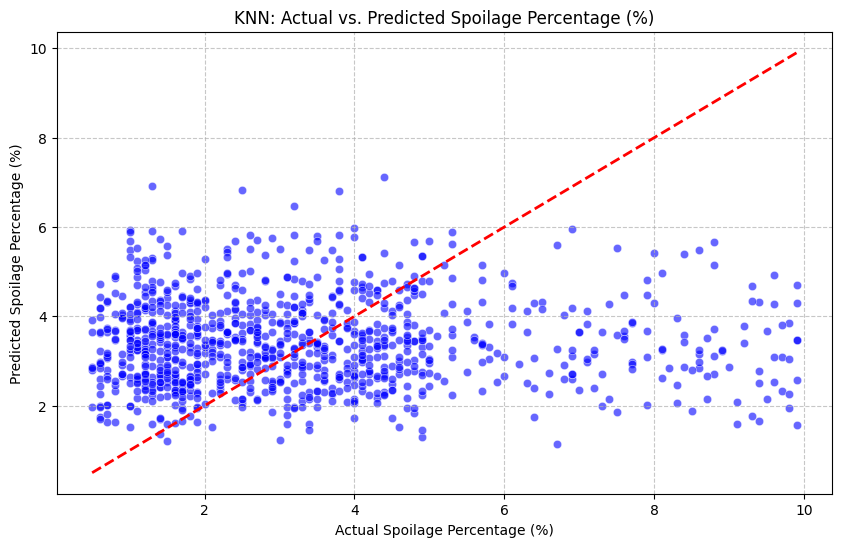

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Visualize Predictions: Actual vs. Predicted Values for KNN ---
print("\n--- Visualizing Actual vs. Predicted Values for KNN ---")
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=y_pred_knn, alpha=0.6, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2) # Plotting the perfect prediction line
plt.title('KNN: Actual vs. Predicted Spoilage Percentage (%)')
plt.xlabel('Actual Spoilage Percentage (%)')
plt.ylabel('Predicted Spoilage Percentage (%)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

### Summary of K-Nearest Neighbors (KNN) Regressor Model Findings

This section summarizes the performance of the K-Nearest Neighbors (KNN) Regressor model trained to predict 'Spoilage Percentage (%)' and provides a comparison with the Decision Tree Regressor.

**1. KNN Model Evaluation Metrics:**

The evaluation metrics provide a quantitative assessment of the KNN model's performance on the unseen test data:

*   **Mean Absolute Error (MAE):** `1.9028`
    *   Interpretation: On average, the KNN model's predictions for spoilage percentage deviate from the actual values by approximately 1.90 percentage points.
*   **Mean Squared Error (MSE):** `5.9240`
*   **Root Mean Squared Error (RMSE):** `2.4339`
    *   Interpretation: The typical magnitude of the prediction error for the KNN model is about 2.43 percentage points.
*   **R-squared (R2) Score:** `-0.2012`
    *   Interpretation: An R-squared score of -0.2012 indicates that the KNN model performs worse than simply predicting the mean of the target variable. This suggests that the model is not a good fit for the data.

**2. Comparison with Decision Tree Regressor:**

Let's compare the KNN model's performance with the Decision Tree Regressor's performance:

| Metric | Decision Tree Regressor | K-Nearest Neighbors (KNN) Regressor |
|:----------------------------|:--------------------------|:------------------------------------|
| MAE                         | `1.4302`                  | `1.9028`                            |
| MSE                         | `3.8825`                  | `5.9240`                            |
| RMSE                        | `1.9704`                  | `2.4339`                            |
| R2 Score                    | `0.2128`                  | `-0.2012`                           |

**Overall Conclusion:**

Comparing the two models:
*   The **Decision Tree Regressor** (MAE: 1.4302, RMSE: 1.9704, R2: 0.2128) significantly outperforms the **K-Nearest Neighbors Regressor** (MAE: 1.9028, RMSE: 2.4339, R2: -0.2012) on this dataset.
*   The KNN model's negative R-squared score suggests that it is not capturing the underlying patterns in the data effectively and performs poorly. This might be due to the high dimensionality of the feature space, the choice of `n_neighbors`, or the nature of the data itself.
*   For predicting 'Spoilage Percentage (%)' in this context, the Decision Tree Regressor is a much more suitable model than the KNN Regressor.


### Clarify Classification Target

In [ ]:
import numpy as np

# Define thresholds for spoilage categories
low_threshold = 2.0
medium_threshold = 4.0

# Get the original numerical spoilage data for comparisons
original_spoilage = nn039_1['remainder__Spoilage Percentage (%)']

# Create a new Series for the categorical target variable
y_classification = pd.Series(index=original_spoilage.index, dtype='object')

# Assign categories based on the original numerical values
y_classification.loc[original_spoilage <= low_threshold] = 'Low'
y_classification.loc[(original_spoilage > low_threshold) & (original_spoilage <= medium_threshold)] = 'Medium'
y_classification.loc[original_spoilage > medium_threshold] = 'High'

# Assign the new 'Spoilage_Category' series as the target variable y
y = y_classification

# Define the feature matrix X by dropping the original continuous spoilage column
X = nn039_1.drop(columns=['remainder__Spoilage Percentage (%)'])

print(f"Shape of features (X): {X.shape}")
print(f"Shape of target (y): {y.shape}")
print("First 5 rows of features (X):")
print(X.head())
print("First 5 values of target (y):")
print(y.head())

Shape of features (X): (5001, 175)
Shape of target (y): (5001,)
First 5 rows of features (X):
   onehot__Who Receives the Goods?_Cold Storage Operator  \
0                                                0.0       
1                                                1.0       
2                                                0.0       
3                                                0.0       
4                                                0.0       

   onehot__Who Receives the Goods?_Commission Agent  \
0                                               0.0   
1                                               0.0   
2                                               0.0   
3                                               1.0   
4                                               0.0   

   onehot__Who Receives the Goods?_Exporter  \
0                                       0.0   
1                                       0.0   
2                                       0.0   
3                         

### Split Data


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Shape of X_train: {X_train.shape}")
print(f"Shape of X_test: {X_test.shape}")
print(f"Shape of y_train: {y_train.shape}")
print(f"Shape of y_test: {y_test.shape}")

Shape of X_train: (4000, 175)
Shape of X_test: (1001, 175)
Shape of y_train: (4000,)
Shape of y_test: (1001,)


### Train Classification Model


In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Initialize the Decision Tree Classifier model
dt_classifier = DecisionTreeClassifier(random_state=42)

# Fit the model to the training data
dt_classifier.fit(X_train, y_train)

print("Decision Tree Classifier model trained successfully.")

Decision Tree Classifier model trained successfully.


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# Make predictions on the test data
y_pred_classifier = dt_classifier.predict(X_test)

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred_classifier)
precision = precision_score(y_test, y_pred_classifier, average='weighted')
recall = recall_score(y_test, y_pred_classifier, average='weighted')
f1 = f1_score(y_test, y_pred_classifier, average='weighted')

# Print the metrics
print("--- Decision Tree Classifier Model Evaluation Metrics ---")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision (weighted): {precision:.4f}")
print(f"Recall (weighted): {recall:.4f}")
print(f"F1-Score (weighted): {f1:.4f}")

# Print classification report for more detailed per-class metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred_classifier))


--- Decision Tree Classifier Model Evaluation Metrics ---
Accuracy: 0.5944
Precision (weighted): 0.5906
Recall (weighted): 0.5944
F1-Score (weighted): 0.5923

Classification Report:
              precision    recall  f1-score   support

        High       0.55      0.54      0.55       308
         Low       0.72      0.76      0.74       368
      Medium       0.48      0.46      0.47       325

    accuracy                           0.59      1001
   macro avg       0.58      0.59      0.59      1001
weighted avg       0.59      0.59      0.59      1001



## Evaluate Classification Model Performance


**Reasoning**:
The subtask requires calculating and displaying several classification metrics and visualizing the confusion matrix. I will start by importing all necessary libraries, then calculate the confusion matrix, followed by per-class specificity and One-vs-Rest (OvR) ROC AUC scores. Finally, I will visualize the confusion matrix as requested.



--- Confusion Matrix ---
[[167  43  98]
 [ 25 278  65]
 [111  64 150]]

--- Specificity for each class ---
Specificity for class 'High': 0.8038
Specificity for class 'Low': 0.8310
Specificity for class 'Medium': 0.7589

--- One-vs-Rest (OvR) ROC AUC Scores ---
AUC for class 'High': 0.6730
AUC for class 'Low': 0.7932
AUC for class 'Medium': 0.6102


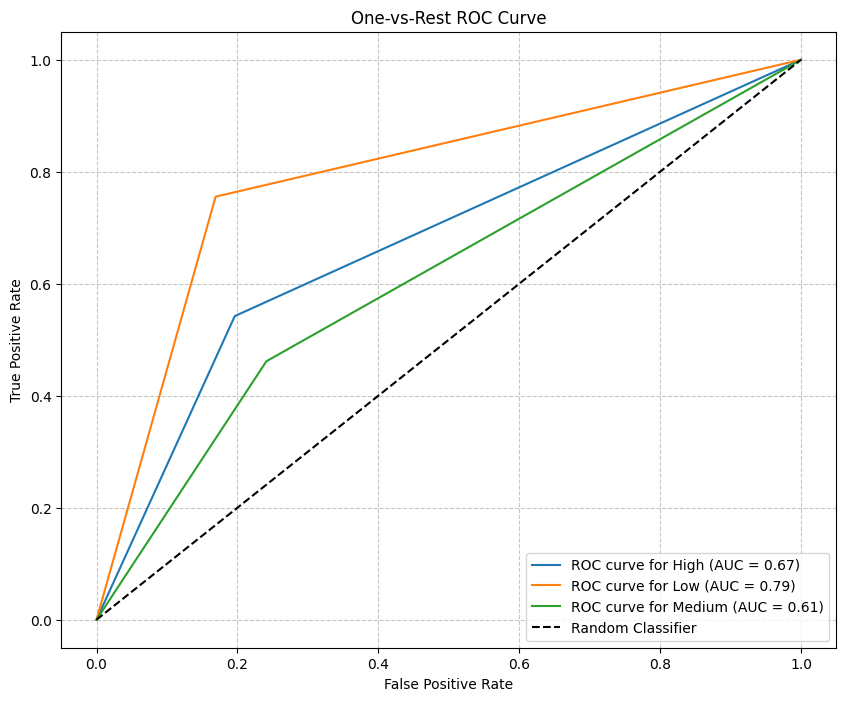


--- Confusion Matrix Visualization ---


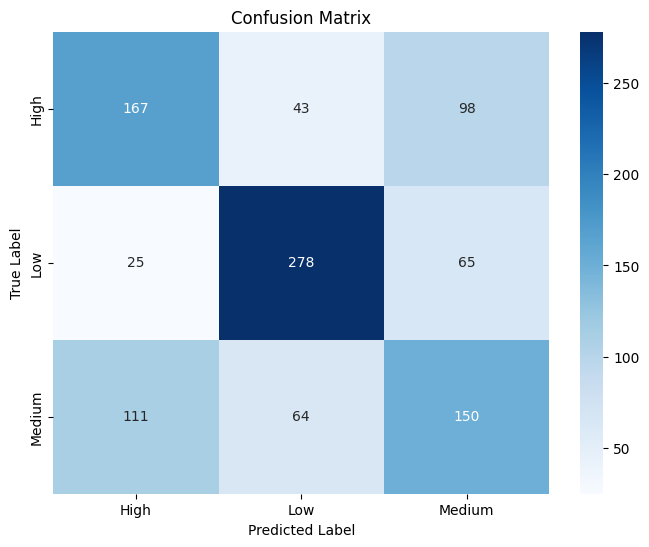

In [ ]:
from sklearn.metrics import confusion_matrix, roc_curve, auc, RocCurveDisplay
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Calculate Confusion Matrix
cm = confusion_matrix(y_test, y_pred_classifier)
print("--- Confusion Matrix ---")
print(cm)

# Get class labels from the model's classes attribute
class_labels = dt_classifier.classes_

# 2. Calculate Specificity for each class (Multiclass OvR)
print("\n--- Specificity for each class ---")
specificities = {}
for i, label in enumerate(class_labels):
    # For class 'label', consider it as the positive class
    # TP = cm[i, i]
    # FN = sum(cm[i, :]) - TP
    # FP = sum(cm[:, i]) - TP
    # TN = sum(sum(cm)) - (TP + FN + FP)

    # More straightforward for OvR: True Negatives are correctly classified non-members
    # False Positives are non-members incorrectly classified as members

    TN_i = np.sum(np.delete(np.delete(cm, i, axis=0), i, axis=1))
    FP_i = np.sum(cm[:, i]) - cm[i, i]

    specificity_i = TN_i / (TN_i + FP_i) if (TN_i + FP_i) != 0 else 0
    specificities[label] = specificity_i
    print(f"Specificity for class '{label}': {specificity_i:.4f}")

# 3. Calculate One-vs-Rest (OvR) ROC AUC scores
print("\n--- One-vs-Rest (OvR) ROC AUC Scores ---")
# Get predicted probabilities for each class
y_proba = dt_classifier.predict_proba(X_test)

# Binarize y_test for OvR AUC calculation
label_binarizer = LabelBinarizer()
y_test_binarized = label_binarizer.fit_transform(y_test)

# Ensure classes are in the same order as label_binarizer and y_proba columns
# dt_classifier.classes_ gives the order of columns in y_proba
# label_binarizer.classes_ gives the order of columns in y_test_binarized

auc_scores = {}
plt.figure(figsize=(10, 8))
for i, class_label in enumerate(dt_classifier.classes_):
    fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_proba[:, i])
    roc_auc = auc(fpr, tpr)
    auc_scores[class_label] = roc_auc
    print(f"AUC for class '{class_label}': {roc_auc:.4f}")
    plt.plot(fpr, tpr, label=f'ROC curve for {class_label} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('One-vs-Rest ROC Curve')
plt.legend(loc='lower right')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# 4. Visualize the Confusion Matrix
print("\n--- Confusion Matrix Visualization ---")
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


### Perform K-Fold Cross-Validation

**Reasoning**:
The subtask requires implementing K-Fold cross-validation to assess the model's stability and generalization performance. This step will import necessary modules, define the cross-validation strategy, and compute and report scores for accuracy, precision, recall, and F1-score.



In [ ]:
from sklearn.model_selection import KFold, cross_val_score

print("## K-Fold Cross-Validation Scores")

# 1. Define the K-Fold cross-validation strategy
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
print(f"\nUsing {n_splits}-Fold Cross-Validation with shuffle=True and random_state=42")

# 2. Perform cross-validation and report scores for Accuracy
accuracy_scores = cross_val_score(dt_classifier, X, y, cv=kf, scoring='accuracy')
print(f"\nAccuracy Cross-Validation Scores: {accuracy_scores}")
print(f"Mean Accuracy: {accuracy_scores.mean():.4f}")
print(f"Standard Deviation of Accuracy: {accuracy_scores.std():.4f}")

# 3. Perform cross-validation and report scores for Precision (weighted)
precision_scores = cross_val_score(dt_classifier, X, y, cv=kf, scoring='precision_weighted')
print(f"\nPrecision (weighted) Cross-Validation Scores: {precision_scores}")
print(f"Mean Precision (weighted): {precision_scores.mean():.4f}")
print(f"Standard Deviation of Precision (weighted): {precision_scores.std():.4f}")

# 4. Perform cross-validation and report scores for Recall (weighted)
recall_scores = cross_val_score(dt_classifier, X, y, cv=kf, scoring='recall_weighted')
print(f"\nRecall (weighted) Cross-Validation Scores: {recall_scores}")
print(f"Mean Recall (weighted): {recall_scores.mean():.4f}")
print(f"Standard Deviation of Recall (weighted): {recall_scores.std():.4f}")

# 5. Perform cross-validation and report scores for F1-Score (weighted)
f1_scores = cross_val_score(dt_classifier, X, y, cv=kf, scoring='f1_weighted')
print(f"\nF1-Score (weighted) Cross-Validation Scores: {f1_scores}")
print(f"Mean F1-Score (weighted): {f1_scores.mean():.4f}")
print(f"Standard Deviation of F1-Score (weighted): {f1_scores.std():.4f}")

## K-Fold Cross-Validation Scores

Using 5-Fold Cross-Validation with shuffle=True and random_state=42

Accuracy Cross-Validation Scores: [0.59440559 0.593      0.548      0.589      0.582     ]
Mean Accuracy: 0.5813
Standard Deviation of Accuracy: 0.0172

Precision (weighted) Cross-Validation Scores: [0.59064061 0.58957572 0.54565085 0.58944211 0.58696857]
Mean Precision (weighted): 0.5805
Standard Deviation of Precision (weighted): 0.0174

Recall (weighted) Cross-Validation Scores: [0.59440559 0.593      0.548      0.589      0.582     ]
Mean Recall (weighted): 0.5813
Standard Deviation of Recall (weighted): 0.0172

F1-Score (weighted) Cross-Validation Scores: [0.59231938 0.59094673 0.54654586 0.58919623 0.5841194 ]
Mean F1-Score (weighted): 0.5806
Standard Deviation of F1-Score (weighted): 0.0173


## Summary:

### Data Analysis Key Findings

*   **Target Variable Categorization**: The continuous variable 'remainder\_\_Spoilage Percentage (%)' was successfully categorized into three classes: 'Low' (spoiled <= 2.0%), 'Medium' (2.0% < spoiled <= 4.0%), and 'High' (spoiled > 4.0%). This created a categorical target variable 'Spoilage\_Category'.
*   **Data Split**: The dataset was split into training and testing sets, with 4000 samples for training (X\_train, y\_train) and 1001 samples for testing (X\_test, y\_test).
*   **Decision Tree Classifier Performance (Test Set)**:
    *   The model achieved an overall accuracy of **59.44%** on the test set, with weighted precision of **59.06%**, weighted recall of **59.44%**, and a weighted F1-score of **59.23%**.
    *   **Class-Specific Performance**:
        *   **'Low' Spoilage**: Showed the best performance with a precision of 72%, recall of 76%, F1-score of 74%, specificity of 83.10%, and an AUC of 0.7932.
        *   **'High' Spoilage**: Achieved moderate performance with a precision of 55%, recall of 54%, F1-score of 55%, specificity of 80.38%, and an AUC of 0.6730.
        *   **'Medium' Spoilage**: Exhibited the weakest performance, with a precision of 48%, recall of 46%, F1-score of 47%, specificity of 75.89%, and an AUC of 0.6102. The model struggles significantly with this category.
*   **K-Fold Cross-Validation Results**:
    *   Using 5-fold cross-validation, the model demonstrated consistent but moderate performance across folds.
    *   Mean Accuracy: **58.13%** (Std Dev: 0.0172)
    *   Mean Weighted Precision: **58.05%** (Std Dev: 0.0174)
    *   Mean Weighted Recall: **58.13%** (Std Dev: 0.0172)
    *   Mean Weighted F1-Score: **58.06%** (Std Dev: 0.0173)
    *   These scores are slightly lower than the single test set evaluation, indicating some variability and potential for slight overfitting to the initial training split, or that the test split was slightly more representative of the overall average.

### Insights or Next Steps

*   The Decision Tree Classifier shows a significant challenge in accurately classifying the 'Medium' spoilage category. This could be due to overlapping features with 'Low' and 'High' categories, or the chosen thresholds creating an ambiguous boundary. Further analysis on class separability for the 'Medium' category (e.g., using feature importance for 'Medium' vs. others) is recommended.
*   To improve model performance, especially for the 'Medium' category, consider exploring other classification algorithms (e.g., RandomForest, Gradient Boosting, SVM), hyperparameter tuning the current Decision Tree Classifier, or refining the feature engineering process. Re-evaluating the thresholds for defining spoilage categories might also be beneficial if domain knowledge suggests alternative splits.


## Diagnostics

### Identify Key Input Variables and their Importance

Top 10 Most Important Features:
                                        feature  importance
171                remainder__Shelf Life (Days)    0.387076
162  remainder__Average Distance Travelled (km)    0.043405
172     remainder__Transportation Cost per Trip    0.041691
173                     remainder__Storage Cost    0.038829
174                     remainder__Wastage Cost    0.034519
168                     remainder__Daily Demand    0.029702
158        remainder__Daily Production/Quantity    0.025452
166                   remainder__Unloading Time    0.025437
167          remainder__Total Supply Chain Time    0.023787
164          remainder__Humidity Maintained (%)    0.021984


/tmp/ipython-input-579811340.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=feature_importance_df.head(10), palette='viridis')


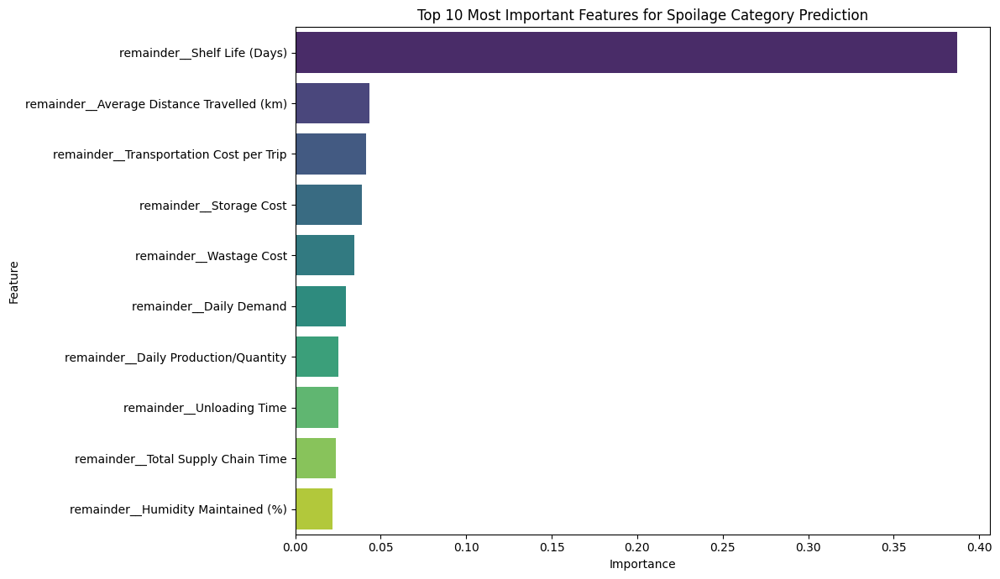

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Access feature importances
feature_importances = dt_classifier.feature_importances_

# 2. Create a DataFrame for feature importances
feature_importance_df = pd.DataFrame({
    'feature': X.columns,
    'importance': feature_importances
})

# 3. Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)

# 4. Print the top 10 most important features
print("Top 10 Most Important Features:")
print(feature_importance_df.head(10))

# 5. Visualize the top 10 most important features
plt.figure(figsize=(12, 7))
sns.barplot(x='importance', y='feature', data=feature_importance_df.head(10), palette='viridis')
plt.title('Top 10 Most Important Features for Spoilage Category Prediction')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()


--- Visualizing a Portion of the Decision Tree (Max Depth = 3) ---



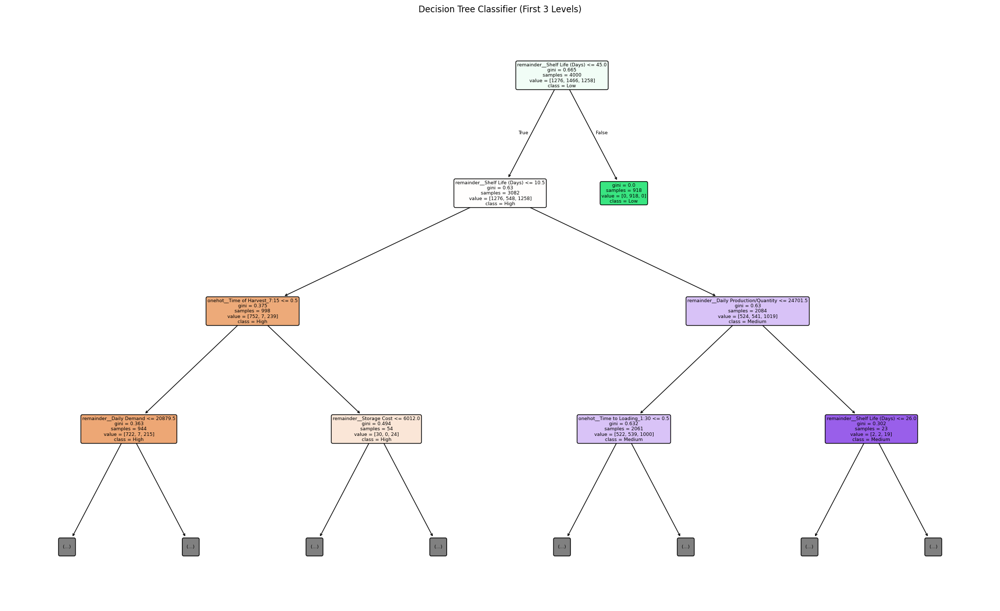


--- Explaining Thresholds and Spoiled Categories ---

Decision trees work by making a series of binary decisions (splits) based on feature values. Each internal node in the tree represents a test on a feature, and each branch represents the outcome of the test. The tree continues to split until it reaches a leaf node, which assigns a class label (in our case, 'Low', 'Medium', or 'High' spoilage).

Conceptual Approach to Extracting Thresholds:
From the visualized tree, each internal node shows a condition like 'feature_name <= threshold_value'.

For example, if the first split is 'remainder__Shelf Life (Days) <= 20.0', it means: 
  - If a product's shelf life is 20 days or less, it follows one branch.
  - If a product's shelf life is greater than 20 days, it follows the other branch.
These thresholds are learned during training to best separate the data into different spoilage categories. By tracing a path from the root to a leaf node, one can see the combination of thresholds that lea

In [ ]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# --- Visualize a Portion of the Decision Tree ---
# Set a maximum depth to make the visualization interpretable.
# A full tree can be too large to display meaningfully.
print("\n--- Visualizing a Portion of the Decision Tree (Max Depth = 3) ---\n")

plt.figure(figsize=(25, 15))
plot_tree(dt_classifier,
          feature_names=X.columns.tolist(),
          class_names=dt_classifier.classes_.tolist(),
          filled=True,
          rounded=True,
          max_depth=3) # Limit depth for interpretability
plt.title('Decision Tree Classifier (First 3 Levels)')
plt.show()

print("\n--- Explaining Thresholds and Spoiled Categories ---\n")
print("Decision trees work by making a series of binary decisions (splits) based on feature values. Each internal node in the tree represents a test on a feature, and each branch represents the outcome of the test. The tree continues to split until it reaches a leaf node, which assigns a class label (in our case, 'Low', 'Medium', or 'High' spoilage).")
print("\nConceptual Approach to Extracting Thresholds:")
print("From the visualized tree, each internal node shows a condition like 'feature_name <= threshold_value'.\n")
print("For example, if the first split is 'remainder__Shelf Life (Days) <= 20.0', it means: ")
print("  - If a product's shelf life is 20 days or less, it follows one branch.")
print("  - If a product's shelf life is greater than 20 days, it follows the other branch.")
print("These thresholds are learned during training to best separate the data into different spoilage categories. By tracing a path from the root to a leaf node, one can see the combination of thresholds that lead to a specific spoilage prediction.")

print("\nRelating Thresholds to Spoilage Categories:\n")
print("The model learns thresholds that maximize the homogeneity (reduce impurity) of spoilage categories within each resulting node. For instance:")
print("  - A threshold on 'remainder__Shelf Life (Days)' might aim to separate products with inherently short shelf lives (more likely 'High' or 'Medium' spoilage) from those with longer shelf lives (more likely 'Low' spoilage).")
print("  - Subsequent splits on other features (like 'remainder__Average Distance Travelled (km)' or 'remainder__Transportation Cost per Trip') would further refine these categories by finding patterns within the already partitioned data. For example, among products with a certain shelf life, those travelling longer distances might have a higher probability of 'High' spoilage if not handled correctly.")

print("\nSummary of Findings Regarding Most Important Features:\n")
print("The feature importance analysis clearly showed that 'remainder__Shelf Life (Days)' is the single most important feature, with a significantly higher importance score (0.3871) compared to others. This aligns with intuition: the inherent shelf life of a product is a primary determinant of its spoilage potential.")
print("Other features like 'remainder__Average Distance Travelled (km)', 'remainder__Transportation Cost per Trip', 'remainder__Storage Cost', 'remainder__Wastage Cost', and 'remainder__Daily Demand' also contribute, but to a much lesser extent. The tree uses thresholds on these continuous numerical features to create decision boundaries that classify products into 'Low', 'Medium', or 'High' spoilage categories. For nominal and label-encoded ordinal features, the tree creates splits based on specific categories or their encoded numerical values.")
print("The structure of the decision tree demonstrates that the model attempts to isolate different spoilage categories by sequentially testing these features against optimal threshold values.")


### Summary of Findings from Classification Model and Cross-Validation

This summary synthesizes the performance metrics, cross-validation results, and insights into feature importance and decision tree mechanics for the classification model predicting 'Spoilage_Category' (Low, Medium, High).

**1. Decision Tree Classifier Performance (Test Set Evaluation):**

The model was evaluated on a held-out test set (20% of the data) using standard classification metrics:

*   **Accuracy:** `0.5944` (Approximately 59.44% of instances were correctly classified).
*   **Precision (weighted):** `0.5906`
*   **Recall (weighted):** `0.5944`
*   **F1-Score (weighted):** `0.5923`

**Class-Specific Performance (from Classification Report and Specificity/AUC):**

| Class    | Precision | Recall | F1-Score | Support | Specificity | AUC    |
|:---------|:----------|:-------|:---------|:--------|:------------|:-------|
| High     | 0.55      | 0.54   | 0.55     | 308     | 0.8038      | 0.6730 |
| Low      | 0.72      | 0.76   | 0.74     | 368     | 0.8310      | 0.7932 |
| Medium   | 0.48      | 0.46   | 0.47     | 325     | 0.7589      | 0.6102 |

*   The model performs best in identifying **'Low' spoilage** products, demonstrating good precision, recall, and F1-score, and the highest AUC. Its specificity is also good, meaning it correctly identifies when a product is *not* 'Low' spoilage.
*   Performance for **'High' spoilage** is moderate.
*   The model struggles significantly with the **'Medium' spoilage** category, exhibiting the lowest precision, recall, F1-score, specificity, and AUC. This indicates difficulty in correctly distinguishing 'Medium' spoilage from other categories, leading to a higher rate of misclassifications for this class.

**2. K-Fold Cross-Validation Results:**

K-Fold Cross-Validation (with `n_splits=5`, `shuffle=True`, `random_state=42`) was performed to assess model stability and generalization:

*   **Mean Accuracy:** `0.5813` (Standard Deviation: `0.0172`)
*   **Mean Weighted Precision:** `0.5805` (Standard Deviation: `0.0174`)
*   **Mean Weighted Recall:** `0.5813` (Standard Deviation: `0.0172`)
*   **Mean Weighted F1-Score:** `0.5806` (Standard Deviation: `0.0173`)

The cross-validation results are consistent with the single test set evaluation, showing similar mean performance metrics. The relatively low standard deviations suggest the model's performance is stable across different subsets of the data, implying it is not heavily overfitting to a single train-test split.

**3. Feature Importance Analysis:**

The feature importance from the Decision Tree Classifier revealed the following top contributors:

| Feature                                     | Importance |
|:--------------------------------------------|:-----------|
| `remainder__Shelf Life (Days)`              | `0.3871`   |
| `remainder__Average Distance Travelled (km)`| `0.0434`   |
| `remainder__Transportation Cost per Trip`   | `0.0417`   |
| `remainder__Storage Cost`                   | `0.0388`   |
| `remainder__Wastage Cost`                   | `0.0345`   |
| `remainder__Daily Demand`                   | `0.0297`   |
| `remainder__Daily Production/Quantity`      | `0.0255`   |
| `remainder__Unloading Time`                 | `0.0254`   |
| `remainder__Total Supply Chain Time`        | `0.0238`   |
| `remainder__Humidity Maintained (%)`        | `0.0220`   |

*   **`remainder__Shelf Life (Days)`** is overwhelmingly the most important feature, contributing almost 40% to the model's decisions. This is highly intuitive, as the intrinsic shelf life of a product directly impacts its spoilage potential.
*   Other features, such as `Average Distance Travelled (km)`, `Transportation Cost per Trip`, and `Storage Cost`, contribute to a much lesser extent, but collectively provide additional predictive power.

**4. Decision Tree Thresholds and Spoilage Categories:**

Decision Trees classify data by applying a series of binary splits (thresholds) on input variables. Each internal node in the tree corresponds to a test `feature <= threshold_value`. For example, a split like `remainder__Shelf Life (Days) <= 45.0` would direct samples with a shelf life of 45 days or less down one branch, and samples with a longer shelf life down another. These thresholds are automatically determined during training to maximize the separation of classes (reduce impurity) at each split.

By traversing the tree from the root to a leaf node, a combination of these thresholds leads to a final prediction for a spoilage category ('Low', 'Medium', or 'High'). The model uses 'Shelf Life (Days)' as the primary split criterion early in the tree, effectively segmenting products based on their inherent perishability, and then uses other features to further refine these groups.

**Overall Conclusion and Next Steps:**

The Decision Tree Classifier provides a fair baseline for predicting spoilage categories, especially for 'Low' spoilage. However, its overall accuracy is moderate, and it particularly struggles with the 'Medium' spoilage category. This suggests that the current feature set and model complexity might not fully capture the nuances required to accurately differentiate between 'Medium' spoilage and other categories. The dominant importance of 'Shelf Life (Days)' highlights its critical role, while other features offer supplementary but weaker predictive signals.

**Potential Next Steps for Improvement:**

*   **Hyperparameter Tuning:** Systematically tune the Decision Tree's hyperparameters (e.g., `max_depth`, `min_samples_leaf`, `min_samples_split`) to find an optimal balance between bias and variance.
*   **Feature Engineering:** Explore creating new features, especially interaction terms or polynomial features, that might better capture complex relationships with spoilage, particularly for the 'Medium' category.
*   **Alternative Models:** Evaluate other classification algorithms, such as Random Forests, Gradient Boosting Machines (XGBoost, LightGBM), Support Vector Machines, or Neural Networks, which might handle the data's complexity and non-normality more effectively.
*   **Re-evaluate Spoilage Categories:** If feasible, reassess the thresholds used to define 'Low', 'Medium', and 'High' spoilage categories. The current definitions might make the 'Medium' class inherently difficult to distinguish.
*   **Data Collection:** If possible, consider if additional relevant features could be collected that might explain more of the variance in spoilage percentage.

### Summary:

### Data Analysis Key Findings

*   **Dominant Feature Importance:** 'Shelf Life (Days)' is overwhelmingly the most important feature, contributing 38.71% to the Decision Tree Classifier's decisions, significantly higher than any other feature.
*   **Top Contributing Features:** Following 'Shelf Life (Days)', other notable features contributing to spoilage prediction include 'Average Distance Travelled (km)', 'Transportation Cost per Trip', 'Storage Cost', 'Wastage Cost', and 'Daily Demand'.
*   **Overall Model Performance:** The Decision Tree Classifier achieved an accuracy of 59.44% on the test set, with weighted precision, recall, and F1-scores around 59%.
*   **Class-Specific Performance:**
    *   The model performs best in identifying 'Low' spoilage products, showing good precision (0.72), recall (0.76), and F1-score (0.74), along with the highest AUC (0.7932).
    *   Performance for 'High' spoilage is moderate, with a precision of 0.55 and recall of 0.54.
    *   The model struggles significantly with the 'Medium' spoilage category, exhibiting the lowest precision (0.48), recall (0.46), F1-score (0.47), and AUC (0.6102), indicating difficulty in distinguishing this category.
*   **Model Stability:** K-Fold Cross-Validation results (mean accuracy 58.13% with a standard deviation of 0.0172) indicate stable performance across different data subsets, suggesting the model is not heavily overfitting.
*   **Decision Tree Mechanism:** The Decision Tree uses thresholds (e.g., `feature_name <= threshold_value`) on continuous features to make binary splits, sequentially testing features like 'Shelf Life (Days)' early on to segment products based on inherent perishability and then using other features to refine these groups into 'Low', 'Medium', or 'High' spoilage categories.

### Insights or Next Steps

*   **Improve 'Medium' Spoilage Prediction:** Focus efforts on improving the model's ability to classify 'Medium' spoilage, potentially through hyperparameter tuning, feature engineering, or exploring alternative classification models better suited for handling class imbalances or complex boundaries.
*   **Feature Enhancement and Model Exploration:** Investigate creating new features (e.g., interaction terms) or evaluating more advanced models like Random Forests or Gradient Boosting Machines to capture more complex relationships within the data and potentially enhance overall predictive power.


#GROUP MEMBER 3 Kunal Taneja - 065050

## Taking a Random sample

In [ ]:
kt050_ = df.sample(n=5001, random_state=50)
print(kt050_.head())

           Product Name         Category  Daily Production/Quantity  \
35363       Cauliflower        Vegetable                       5260   
43649            Grapes            Fruit                       4436   
60832          Soyabean    Grain/Oilseed                      13132   
37399  Coriander Leaves  Leafy Vegetable                      20306   
61034           Tapioca        Root Crop                      11430   

      Transportation Method Vehicle Type  Vehicle Capacity (kg/ton)  \
35363               By Road   Bulk Truck                       20.0   
43649               By Road   Open Truck                       10.0   
60832               By Road   Mini Truck                        1.0   
37399               By Road   Bulk Truck                       20.0   
61034               By Road   Bulk Truck                       18.0   

       No. of Vehicles Used Per Day  Trip Frequency  \
35363                             5               1   
43649                             5 

## Data Preprocessing

In [ ]:
# The 'None' values in tracking method were not read properly reverting that
kt050_['Tracking Method'] = kt050_['Tracking Method'].fillna('None')
print(kt050_['Tracking Method'].value_counts(dropna=False))

Tracking Method
None                 2482
GPS                   649
RFID + GPS            644
GPS + Temp Logger     625
GPS + IoT             601
Name: count, dtype: int64


## Descriptive Statistics

### Descriptive Statistics for Categorical Variables (Nominal)

In [ ]:
for col in nominal_cols:
    print(f"\n--- Descriptive Statistics for '{col}' ---")

    # Calculate count, frequency, and proportion
    counts = kt050_[col].value_counts()
    proportions = kt050_[col].value_counts(normalize=True)

    print("\nValue Counts (Count and Frequency):")
    print(counts)

    print("\nProportions:")
    print(proportions)

    # Determine highest and lowest categories
    highest_category = counts.index[0]
    lowest_category = counts.index[-1]
    print(f"\nHighest Frequency Category: '{highest_category}' (Count: {counts.iloc[0]})")
    print(f"Lowest Frequency Category: '{lowest_category}' (Count: {counts.iloc[-1]})\n")

    # Assign rank to each category based on frequency
    ranks = counts.rank(method='dense', ascending=False)
    ranked_categories = pd.DataFrame({'Count': counts, 'Rank': ranks})
    print("Ranked Categories by Frequency:")
    print(ranked_categories.sort_values(by='Rank'))


--- Descriptive Statistics for 'Product Name' ---

Value Counts (Count and Frequency):
Product Name
Soyabean                  173
Water Melon               172
Drumstick                 169
Elephant Yam              167
Banana                    165
Turmeric (Dry)            164
Grapes                    164
Dry Chillies              161
Onion                     161
Tomato                    160
Mint (Pudina)             157
Pepper (Ungarbled)        157
Mango                     156
Bottle Gourd              154
Spinach                   154
Maize                     154
Rice                      153
Coriander Leaves          153
Brinjal                   152
Potato                    151
Wheat                     150
Green Chilli              147
Bhindi (Ladies Finger)    146
Tapioca                   144
Cluster Beans             142
Snake Gourd               141
Papaya                    139
Apple                     135
Pomegranate               134
Cabbage                   133

### Descriptive Statistics for Categorical Variables (Ordinal)

In [ ]:
for col in ordinal_cols:
    print(f"\n--- Descriptive Statistics for '{col}' ---")

    # Calculate count, frequency, and proportion
    counts = kt050_[col].value_counts()
    proportions = kt050_[col].value_counts(normalize=True)

    print("\nValue Counts (Count and Frequency):")
    print(counts)

    print("\nProportions:")
    print(proportions)

    # Determine highest and lowest categories
    highest_category = counts.index[0]
    lowest_category = counts.index[-1]
    print(f"\nHighest Frequency Category: '{highest_category}' (Count: {counts.iloc[0]})")
    print(f"Lowest Frequency Category: '{lowest_category}' (Count: {counts.iloc[-1]})\n")

    # Assign rank to each category based on frequency
    ranks = counts.rank(method='dense', ascending=False)
    ranked_categories = pd.DataFrame({'Count': counts, 'Rank': ranks})
    print("Ranked Categories by Frequency:")
    print(ranked_categories.sort_values(by='Rank'))


--- Descriptive Statistics for 'Initial Quality Grade' ---

Value Counts (Count and Frequency):
Initial Quality Grade
AA    1035
B+    1023
A      996
B      995
A-     952
Name: count, dtype: int64

Proportions:
Initial Quality Grade
AA    0.206959
B+    0.204559
A     0.199160
B     0.198960
A-    0.190362
Name: proportion, dtype: float64

Highest Frequency Category: 'AA' (Count: 1035)
Lowest Frequency Category: 'A-' (Count: 952)

Ranked Categories by Frequency:
                       Count  Rank
Initial Quality Grade             
AA                      1035   1.0
B+                      1023   2.0
A                        996   3.0
B                        995   4.0
A-                       952   5.0

--- Descriptive Statistics for 'Time of Harvest' ---

Value Counts (Count and Frequency):
Time of Harvest
5:45    349
4:30    338
5:00    335
7:15    323
7:00    321
6:45    321
4:15    314
5:30    314
7:45    311
6:00    309
4:00    306
6:30    304
6:15    303
7:30    289
4:45    28

### Descriptive Statistics for Non-Categorical Variables

In [ ]:
import numpy as np
from scipy import stats

for col in numerical_cols:
    print(f"\n--- Descriptive Statistics for '{col}' ---")
    data = kt050_[col]

    # Basic statistics
    min_val = data.min()
    max_val = data.max()
    mean_val = data.mean()
    median_val = data.median()
    mode_val = data.mode()[0] if not data.mode().empty else 'N/A' # mode() can return multiple values
    std_dev = data.std()

    print(f"Minimum: {min_val}")
    print(f"Maximum: {max_val}")
    print(f"Mean: {mean_val:.2f}")
    print(f"Median: {median_val:.2f}")
    print(f"Mode: {mode_val}")
    print(f"Standard Deviation: {std_dev:.2f}")

    # Additional statistics
    data_range = max_val - min_val
    sem = data.sem() # Standard Error of the Mean
    skewness = data.skew()
    cov = (std_dev / mean_val) * 100 if mean_val != 0 else np.nan # Coefficient of Variation

    print(f"Range: {data_range:.2f}")
    print(f"Standard Error of the Mean: {sem:.2f}")
    print(f"Skewness: {skewness:.2f}")
    print(f"Coefficient of Variation: {cov:.2f}%")

    # Percentiles
    percentiles = data.quantile([0.25, 0.5, 0.75])
    print("Percentiles:")
    print(f"  25th Percentile (Q1): {percentiles[0.25]:.2f}")
    print(f"  50th Percentile (Median): {percentiles[0.5]:.2f}")
    print(f"  75th Percentile (Q3): {percentiles[0.75]:.2f}")

    # Confidence Interval for the Mean (95% CI)
    # Assuming t-distribution for confidence interval due to finite sample size
    confidence_level = 0.95
    degrees_freedom = len(data) - 1
    confidence_interval = stats.t.interval(
        confidence_level,
        degrees_freedom,
        loc=mean_val,
        scale=sem
    )
    print(f"95% Confidence Interval for the Mean: ({confidence_interval[0]:.2f}, {confidence_interval[1]:.2f})")


--- Descriptive Statistics for 'Daily Production/Quantity' ---
Minimum: 802
Maximum: 24995
Mean: 12858.32
Median: 12847.00
Mode: 2274
Standard Deviation: 6932.66
Range: 24193.00
Standard Error of the Mean: 98.03
Skewness: 0.02
Coefficient of Variation: 53.92%
Percentiles:
  25th Percentile (Q1): 6883.00
  50th Percentile (Median): 12847.00
  75th Percentile (Q3): 18849.00
95% Confidence Interval for the Mean: (12666.13, 13050.50)

--- Descriptive Statistics for 'Vehicle Capacity (kg/ton)' ---
Minimum: 1.0
Maximum: 28.0
Mean: 8.11
Median: 6.00
Mode: 8.0
Standard Deviation: 7.04
Range: 27.00
Standard Error of the Mean: 0.10
Skewness: 1.41
Coefficient of Variation: 86.85%
Percentiles:
  25th Percentile (Q1): 3.00
  50th Percentile (Median): 6.00
  75th Percentile (Q3): 10.00
95% Confidence Interval for the Mean: (7.91, 8.30)

--- Descriptive Statistics for 'No. of Vehicles Used Per Day' ---
Minimum: 1
Maximum: 5
Mean: 2.99
Median: 3.00
Mode: 1
Standard Deviation: 1.42
Range: 4.00
Standar

### Spearman's Rank Correlation Coefficient for Non-Categorical Variables

Spearman's Rank Correlation Coefficient for Non-Categorical Variables:
                                 Daily Production/Quantity  \
Daily Production/Quantity                         1.000000   
Vehicle Capacity (kg/ton)                         0.018712   
No. of Vehicles Used Per Day                     -0.007657   
Trip Frequency                                    0.030193   
Average Distance Travelled (km)                  -0.014761   
Temperature Maintained (°C)                       0.006270   
Humidity Maintained (%)                           0.004508   
Transport Duration (hours)                        0.016902   
Unloading Time                                    0.014422   
Total Supply Chain Time                           0.017016   
Daily Demand                                      0.993530   
Shelf Life (Days)                                 0.002304   
Spoilage Percentage (%)                           0.009396   
Transportation Cost per Trip                     -0.009170   

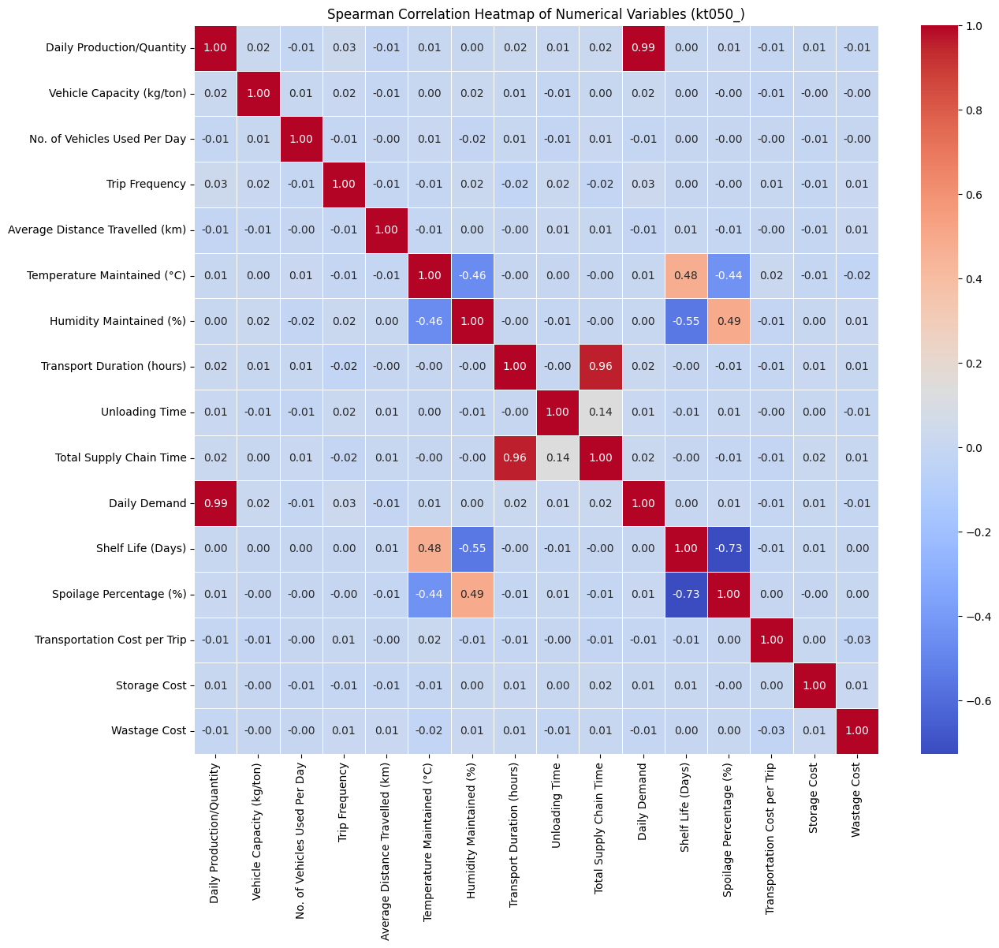

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

spearman_corr_numerical = kt050_[numerical_cols].corr(method='spearman')
print("Spearman's Rank Correlation Coefficient for Non-Categorical Variables:")
print(spearman_corr_numerical)

plt.figure(figsize=(14, 12))
sns.heatmap(spearman_corr_numerical, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Spearman Correlation Heatmap of Numerical Variables (kt050_)')
plt.show()

## Data Visualization


--- Bar Charts for Selected Nominal Variables ---



/tmp/ipython-input-524819807.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=kt050_, y=col, order=kt050_[col].value_counts().index, palette='viridis')
/tmp/ipython-input-524819807.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=kt050_, y=col, order=kt050_[col].value_counts().index, palette='viridis')
/tmp/ipython-input-524819807.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=kt050_, y=col, order=kt050_[col].value_counts().index, palette='viridis')
/tmp/ipython-input-524819807.py:12: FutureWarning: 

Passi

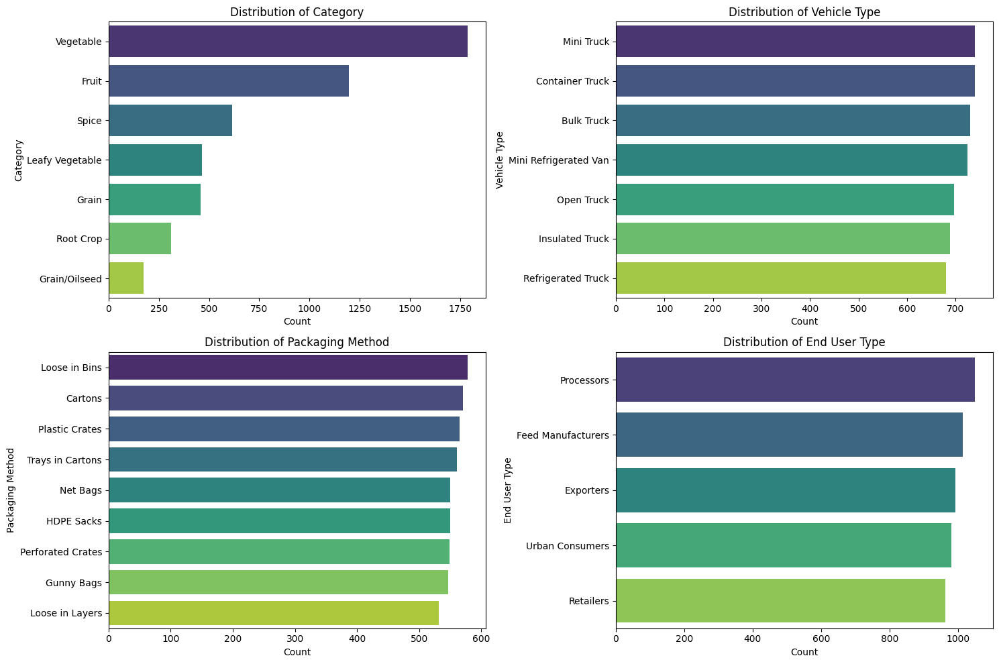


--- Bar Charts for Selected Ordinal Variables ---



/tmp/ipython-input-524819807.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=kt050_, y=col, order=kt050_[col].value_counts().index, palette='magma')
/tmp/ipython-input-524819807.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=kt050_, y=col, order=kt050_[col].value_counts().index, palette='magma')
/tmp/ipython-input-524819807.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=kt050_, y=col, order=kt050_[col].value_counts().index, palette='magma')


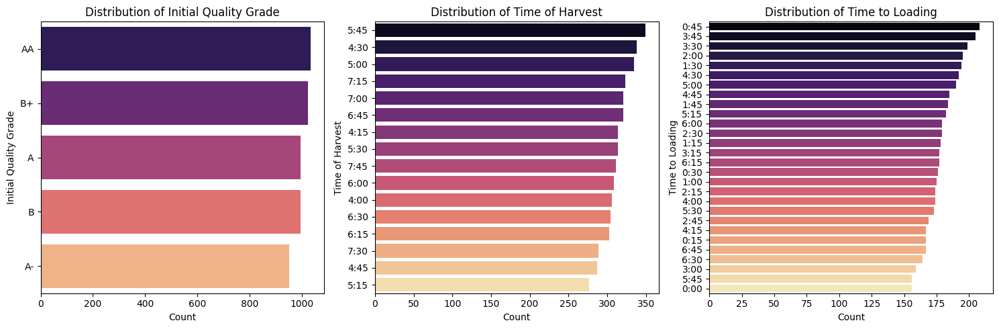


--- Pie Chart for 'Is Real-time Tracking Used?' ---



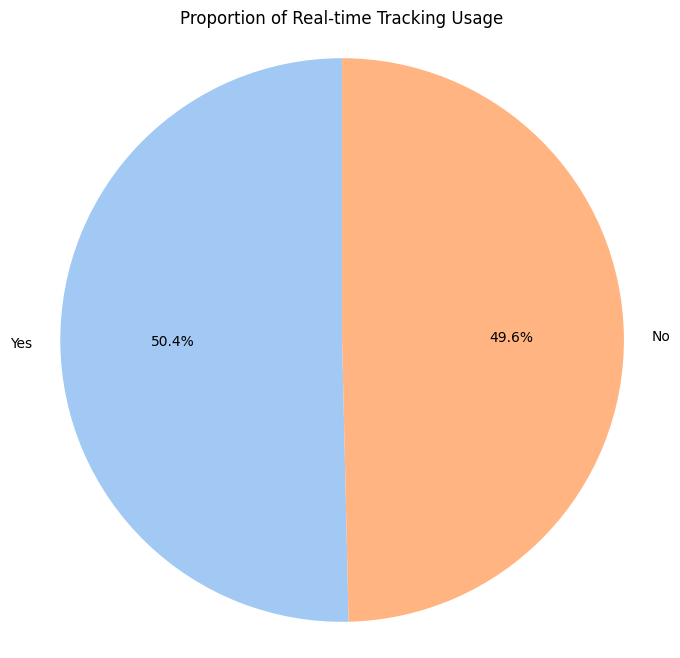

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Bar Charts for Nominal Variables ---
print("\n--- Bar Charts for Selected Nominal Variables ---\n")

nominal_plot_cols = ['Category', 'Vehicle Type', 'Packaging Method', 'End User Type']

plt.figure(figsize=(15, 10))
for i, col in enumerate(nominal_plot_cols):
    plt.subplot(2, 2, i + 1)
    sns.countplot(data=kt050_, y=col, order=kt050_[col].value_counts().index, palette='viridis')
    plt.title(f'Distribution of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

# --- Bar Charts for Ordinal Variables ---
print("\n--- Bar Charts for Selected Ordinal Variables ---\n")

ordinal_plot_cols = ['Initial Quality Grade', 'Time of Harvest', 'Time to Loading'] # Excluding 'Is Real-time Tracking Used?' for pie chart

plt.figure(figsize=(15, 5))
for i, col in enumerate(ordinal_plot_cols):
    plt.subplot(1, 3, i + 1)
    sns.countplot(data=kt050_, y=col, order=kt050_[col].value_counts().index, palette='magma')
    plt.title(f'Distribution of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

# --- Pie Chart for a Binary Ordinal Variable ---
print("\n--- Pie Chart for 'Is Real-time Tracking Used?' ---\n")

tracking_counts = kt050_['Is Real-time Tracking Used?'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(tracking_counts, labels=tracking_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
plt.title('Proportion of Real-time Tracking Usage')
plt.axis('equal') # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

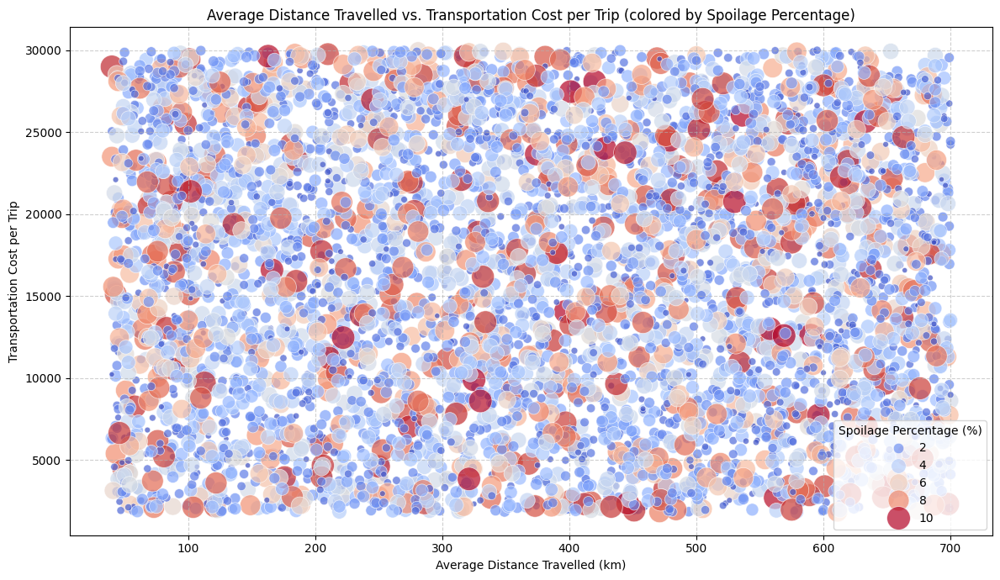

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Scatter plot for non-categorical variables (e.g., 'Average Distance Travelled (km)' vs. 'Transportation Cost per Trip')
plt.figure(figsize=(12, 7))
sns.scatterplot(data=kt050_, x='Average Distance Travelled (km)', y='Transportation Cost per Trip',
                hue='Spoilage Percentage (%)', size='Spoilage Percentage (%)', sizes=(20, 400),
                palette='coolwarm', alpha=0.7)
plt.title('Average Distance Travelled vs. Transportation Cost per Trip (colored by Spoilage Percentage)')
plt.xlabel('Average Distance Travelled (km)')
plt.ylabel('Transportation Cost per Trip')
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(title='Spoilage Percentage (%)')
plt.tight_layout()
plt.show()


--- Histograms/KDE Plots for Selected Numerical Variables ---



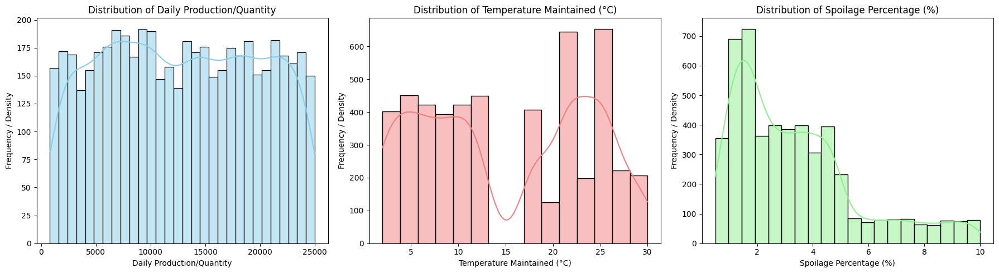


--- Scatter Plots for Relationships Between Numerical Variables ---



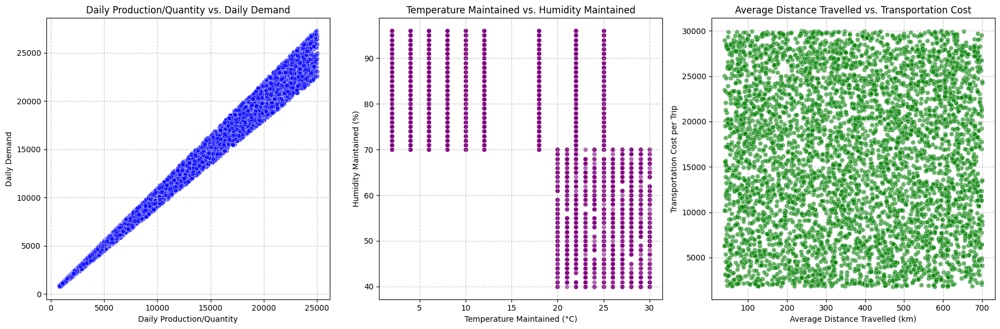

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Histograms/KDE Plots for Individual Distributions ---
print("\n--- Histograms/KDE Plots for Selected Numerical Variables ---\n")

plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
sns.histplot(kt050_['Daily Production/Quantity'], kde=True, color='skyblue', bins=30)
plt.title('Distribution of Daily Production/Quantity')
plt.xlabel('Daily Production/Quantity')
plt.ylabel('Frequency / Density')

plt.subplot(1, 3, 2)
sns.histplot(kt050_['Temperature Maintained (°C)'], kde=True, color='lightcoral', bins=15)
plt.title('Distribution of Temperature Maintained (°C)')
plt.xlabel('Temperature Maintained (°C)')
plt.ylabel('Frequency / Density')

plt.subplot(1, 3, 3)
sns.histplot(kt050_['Spoilage Percentage (%)'], kde=True, color='lightgreen', bins=20)
plt.title('Distribution of Spoilage Percentage (%)')
plt.xlabel('Spoilage Percentage (%)')
plt.ylabel('Frequency / Density')

plt.tight_layout()
plt.show()

# --- Scatter Plots for Relationships Between Numerical Variables ---
print("\n--- Scatter Plots for Relationships Between Numerical Variables ---\n")

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
sns.scatterplot(data=kt050_, x='Daily Production/Quantity', y='Daily Demand', alpha=0.6, color='blue')
plt.title('Daily Production/Quantity vs. Daily Demand')
plt.xlabel('Daily Production/Quantity')
plt.ylabel('Daily Demand')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.scatterplot(data=kt050_, x='Temperature Maintained (°C)', y='Humidity Maintained (%)', alpha=0.6, color='purple')
plt.title('Temperature Maintained vs. Humidity Maintained')
plt.xlabel('Temperature Maintained (°C)')
plt.ylabel('Humidity Maintained (%)')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.scatterplot(data=kt050_, x='Average Distance Travelled (km)', y='Transportation Cost per Trip', alpha=0.6, color='green')
plt.title('Average Distance Travelled vs. Transportation Cost')
plt.xlabel('Average Distance Travelled (km)')
plt.ylabel('Transportation Cost per Trip')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


--- Pair Plot for Selected Numerical Variables ---



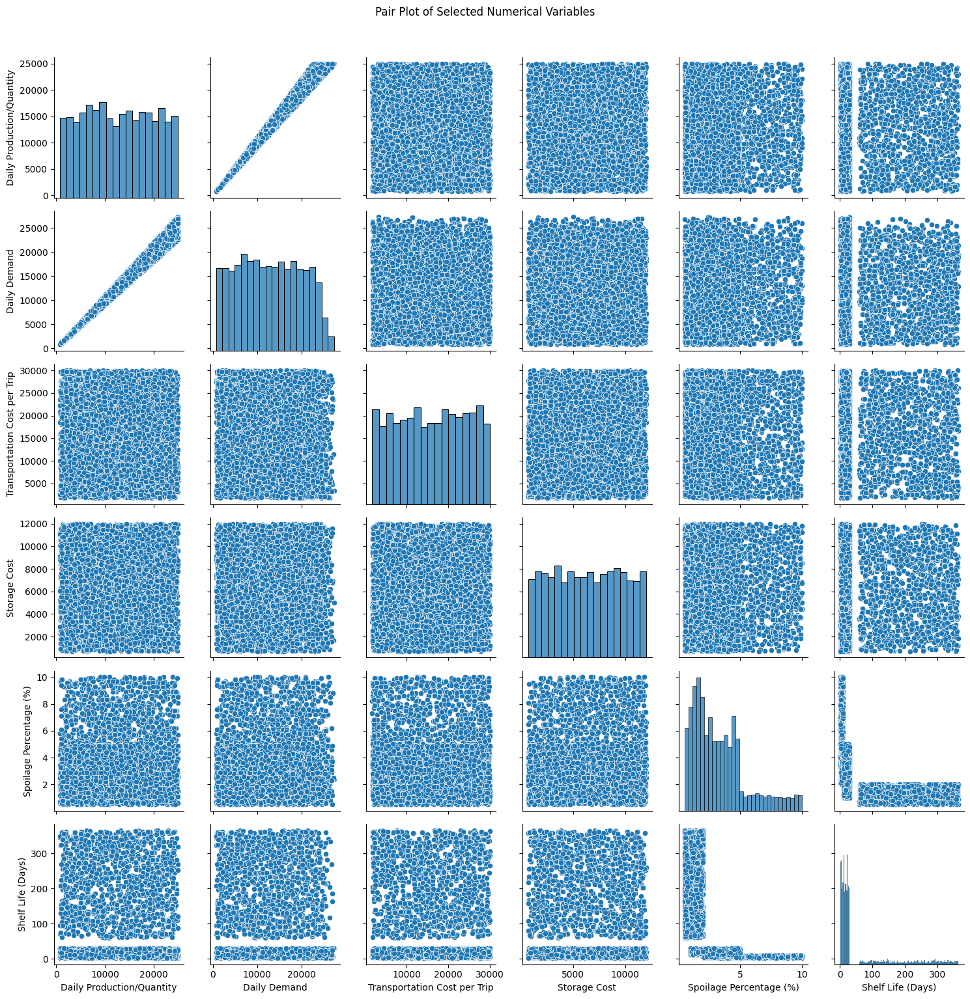

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n--- Pair Plot for Selected Numerical Variables ---\n")

# Select a subset of numerical columns for the pair plot
# A pair plot with too many columns can be very busy
pair_plot_cols = [
    'Daily Production/Quantity', 'Daily Demand',
    'Transportation Cost per Trip', 'Storage Cost',
    'Spoilage Percentage (%)', 'Shelf Life (Days)'
]

existing_pair_plot_cols = [col for col in pair_plot_cols if col in kt050_.columns]

if existing_pair_plot_cols:
    # Create a Pair Plot
    # hue could be added for a categorical variable if desired, e.g., hue='Category'
    sns.pairplot(kt050_[existing_pair_plot_cols])
    plt.suptitle('Pair Plot of Selected Numerical Variables', y=1.02) # Adjust title position
    plt.tight_layout()
    plt.show()
else:
    print("No selected numerical columns found for pair plot.")

## Inferential Statistics

In [ ]:
from scipy.stats import jarque_bera

# Perform Jarque-Bera test for 'Daily Demand'
stat, p = jarque_bera(kt050_['Daily Demand'])

print(f"Jarque-Bera Test for 'Daily Demand':")
print(f"  Statistic: {stat:.4f}")
print(f"  P-value: {p:.4f}")

# Interpret the results
alpha = 0.05
if p > alpha:
    print("  The sample looks Gaussian (fail to reject H0).")
else:
    print("  The sample does not look Gaussian (reject H0).")

Jarque-Bera Test for 'Daily Demand':
  Statistic: 276.0871
  P-value: 0.0000
  The sample does not look Gaussian (reject H0).


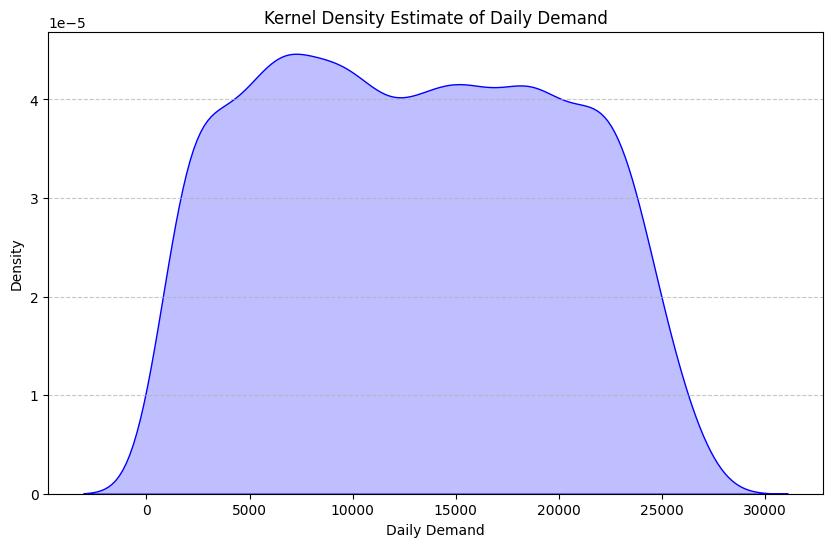

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.kdeplot(kt050_['Daily Demand'], color='blue', fill=True)
plt.title('Kernel Density Estimate of Daily Demand')
plt.xlabel('Daily Demand')
plt.ylabel('Density')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

## Random Forest (RF) vs XGBoost (XGB)

In [ ]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

# 1. Create a new categorical target variable named y_classification
# Get the original numerical spoilage data for comparisons
original_spoilage = kt050_['Spoilage Percentage (%)']

# Define thresholds for spoilage categories
low_threshold = 2.0
medium_threshold = 4.0

y_classification = pd.Series(index=original_spoilage.index, dtype='object')

y_classification.loc[original_spoilage <= low_threshold] = 'Low'
y_classification.loc[(original_spoilage > low_threshold) & (original_spoilage <= medium_threshold)] = 'Medium'
y_classification.loc[original_spoilage > medium_threshold] = 'High'

# Assign the new 'Spoilage_Category' series as the target variable y
y = y_classification

print("Target variable 'y' (Spoilage_Category) created successfully.")
print(y.value_counts())

# 2. Create a copy of the kt050_ DataFrame and drop the original 'Spoilage Percentage (%)' column
X = kt050_.drop(columns=['Spoilage Percentage (%)']).copy()

print("\nFeature DataFrame 'X' created successfully.")

# 3. Identify numerical and object type columns and impute missing values

# Identify numerical columns in X
numerical_cols_X = X.select_dtypes(include=np.number).columns.tolist()
# Impute missing numerical values with mean
for col in numerical_cols_X:
    if X[col].isnull().any():
        X[col].fillna(X[col].mean(), inplace=True)

# Identify object type (categorical) columns in X
object_cols_X = X.select_dtypes(include='object').columns.tolist()
# Impute missing categorical values with mode
for col in object_cols_X:
    if X[col].isnull().any():
        X[col].fillna(X[col].mode()[0], inplace=True)

print("\nMissing values in X imputed successfully.")
print("Missing values in X after imputation:")
print(X.isnull().sum().sum())

# 4. Define lists of column names for scaling and encoding

# Already identified numerical_cols_X above. Renaming for clarity as per subtask step 4.
numerical_cols_for_scaling = numerical_cols_X

ordinal_cols_to_label_encode = ['Initial Quality Grade', 'Is Real-time Tracking Used?']
# Ensure these columns are present and of object type
ordinal_cols_to_label_encode = [col for col in ordinal_cols_to_label_encode if col in X.columns and X[col].dtype == 'object']

# Nominal columns - start with predefined 'nominal_cols' and add 'Time of Harvest', 'Time to Loading'
# Ensure to use the global 'nominal_cols' list defined earlier in the notebook
nominal_cols_for_ohe = nominal_cols.copy()

# Add 'Time of Harvest' and 'Time to Loading' if they are object type and not already in label encoded list
for col in ['Time of Harvest', 'Time to Loading']:
    if col in X.columns and X[col].dtype == 'object' and col not in ordinal_cols_to_label_encode:
        nominal_cols_for_ohe.append(col)

# Remove any columns from nominal_cols_for_ohe that are also present in ordinal_cols_to_label_encode
nominal_cols_for_ohe = [col for col in nominal_cols_for_ohe if col not in ordinal_cols_to_label_encode]

# Remove duplicate entries and ensure all columns are present in X
nominal_cols_for_ohe = list(set([col for col in nominal_cols_for_ohe if col in X.columns]))

print("\nColumn lists defined for preprocessing:")
print(f"  Numerical for Scaling: {numerical_cols_for_scaling}")
print(f"  Ordinal for Label Encoding: {ordinal_cols_to_label_encode}")
print(f"  Nominal for One-Hot Encoding: {nominal_cols_for_ohe}")

# 5. Apply Label Encoding to ordinal variables directly in X
for col in ordinal_cols_to_label_encode:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col])
    print(f"  Label encoded '{col}'. Sample (first 5):\n{X[col].head()}")

print("\nLabel Encoding applied successfully.")

# 6. Apply Standard Scaling and One-Hot Encoding using ColumnTransformer

# Create the ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols_for_scaling),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), nominal_cols_for_ohe)
    ],
    remainder='passthrough' # Keep other columns (already label-encoded ordinals) as they are
)

# Fit and transform X
X_processed_array = preprocessor.fit_transform(X)

# Get feature names for the transformed columns
# The remainder='passthrough' will append the original names for untransformed columns.
feature_names = preprocessor.get_feature_names_out()

# Convert the processed array back to a DataFrame
X_processed = pd.DataFrame(X_processed_array, columns=feature_names, index=X.index)

print("\nFeatures scaled and encoded using ColumnTransformer successfully.")
print(f"Shape of preprocessed X: {X_processed.shape}")
print("First 5 rows of preprocessed X:")
print(X_processed.head())

# 7. Split the preprocessed data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_processed, y, test_size=0.2, random_state=42)

print("\nData split into training and testing sets successfully.")
print(f"Shape of X_train: {X_train.shape}")
print(f"Shape of X_test: {X_test.shape}")
print(f"Shape of y_train: {y_train.shape}")
print(f"Shape of y_test: {y_test.shape}")


Target variable 'y' (Spoilage_Category) created successfully.
Low       1880
Medium    1607
High      1514
Name: count, dtype: int64

Feature DataFrame 'X' created successfully.

Missing values in X imputed successfully.
Missing values in X after imputation:
0

Column lists defined for preprocessing:
  Numerical for Scaling: ['Daily Production/Quantity', 'Vehicle Capacity (kg/ton)', 'No. of Vehicles Used Per Day', 'Trip Frequency', 'Average Distance Travelled (km)', 'Temperature Maintained (°C)', 'Humidity Maintained (%)', 'Transport Duration (hours)', 'Unloading Time', 'Total Supply Chain Time', 'Daily Demand', 'Shelf Life (Days)', 'Transportation Cost per Trip', 'Storage Cost', 'Wastage Cost']
  Ordinal for Label Encoding: ['Initial Quality Grade', 'Is Real-time Tracking Used?']
  Nominal for One-Hot Encoding: ['Time of Harvest', 'End User Type', 'Destination Location', 'Transportation Method', 'Source Location', 'Product Name', 'Packaging Method', 'Reasons for Spoilage', 'Data Colle

### Train and Evaluate Random Forest Classifier


RandomForestClassifier model trained successfully.

--- RandomForestClassifier Model Evaluation Metrics ---
Accuracy: 0.6893
Precision (weighted): 0.7711
Recall (weighted): 0.6893
F1-Score (weighted): 0.7009

Classification Report:
              precision    recall  f1-score   support

        High       0.77      0.61      0.68       319
         Low       1.00      0.64      0.78       370
      Medium       0.51      0.83      0.63       312

    accuracy                           0.69      1001
   macro avg       0.76      0.69      0.70      1001
weighted avg       0.77      0.69      0.70      1001


--- Confusion Matrix ---
[[193   1 125]
 [  5 238 127]
 [ 53   0 259]]

--- Specificity for each class ---
Specificity for class 'High': 0.9150
Specificity for class 'Low': 0.9984
Specificity for class 'Medium': 0.6343

--- One-vs-Rest (OvR) ROC AUC Scores ---
AUC for class 'High': 0.8248
AUC for class 'Low': 0.8763
AUC for class 'Medium': 0.7633


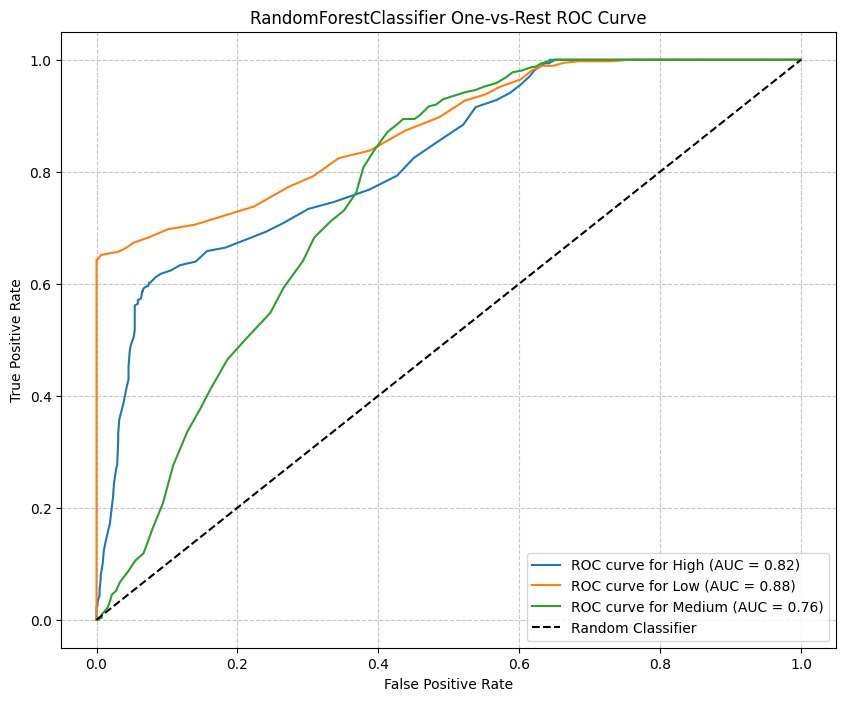


--- Confusion Matrix Visualization ---


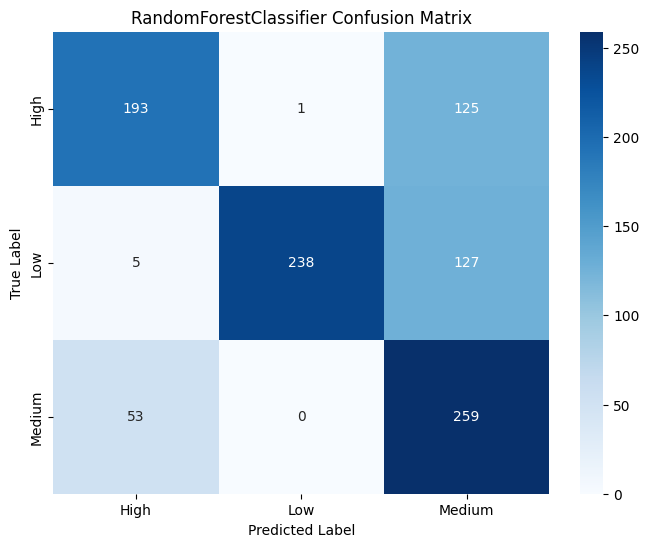

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import LabelBinarizer
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 2. Initialize a RandomForestClassifier with random_state=42
rf_classifier = RandomForestClassifier(random_state=42)

# 3. Train the classifier using the X_train and y_train datasets
rf_classifier.fit(X_train, y_train)

print("RandomForestClassifier model trained successfully.")

# 4. Make predictions on the X_test dataset
y_pred_rf = rf_classifier.predict(X_test)

# 5. Calculate and print the overall accuracy, weighted precision, weighted recall, and weighted F1-score
accuracy = accuracy_score(y_test, y_pred_rf)
precision = precision_score(y_test, y_pred_rf, average='weighted')
recall = recall_score(y_test, y_pred_rf, average='weighted')
f1 = f1_score(y_test, y_pred_rf, average='weighted')

print("\n--- RandomForestClassifier Model Evaluation Metrics ---")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision (weighted): {precision:.4f}")
print(f"Recall (weighted): {recall:.4f}")
print(f"F1-Score (weighted): {f1:.4f}")

# 6. Print the detailed classification_report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_rf))

# 7. Calculate and print the confusion matrix
cm_rf = confusion_matrix(y_test, y_pred_rf)
class_labels = rf_classifier.classes_ # Get class labels from the model
print("\n--- Confusion Matrix ---")
print(cm_rf)

# 8. Calculate and print the specificity for each class
print("\n--- Specificity for each class ---")
specificities_rf = {}
for i, label in enumerate(class_labels):
    # True Negatives (TN) for class i: sum of all cells not in row i or column i
    TN_i = np.sum(np.delete(np.delete(cm_rf, i, axis=0), i, axis=1))
    # False Positives (FP) for class i: sum of column i minus the true positive for class i
    FP_i = np.sum(cm_rf[:, i]) - cm_rf[i, i]

    specificity_i = TN_i / (TN_i + FP_i) if (TN_i + FP_i) != 0 else 0
    specificities_rf[label] = specificity_i
    print(f"Specificity for class '{label}': {specificity_i:.4f}")

# 9. Get the predicted probabilities for each class on the test set
y_proba_rf = rf_classifier.predict_proba(X_test)

# 10. Binarize y_test for OvR AUC calculation
label_binarizer = LabelBinarizer()
y_test_binarized = label_binarizer.fit_transform(y_test)

# 11. Calculate and print the OvR ROC AUC score for each class and plot the ROC curve
print("\n--- One-vs-Rest (OvR) ROC AUC Scores ---")
auc_scores_rf = {}
plt.figure(figsize=(10, 8))
for i, class_label in enumerate(rf_classifier.classes_):
    fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_proba_rf[:, i])
    roc_auc = auc(fpr, tpr)
    auc_scores_rf[class_label] = roc_auc
    print(f"AUC for class '{class_label}': {roc_auc:.4f}")
    plt.plot(fpr, tpr, label=f'ROC curve for {class_label} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('RandomForestClassifier One-vs-Rest ROC Curve')
plt.legend(loc='lower right')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# 12. Visualize the confusion matrix using a heatmap
print("\n--- Confusion Matrix Visualization ---")
plt.figure(figsize=(8, 6))
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels, yticklabels=class_labels)
plt.title('RandomForestClassifier Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

### Train and Evaluate XGBoost Classifier


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [07:58:06] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


XGBClassifier model trained successfully.

--- XGBClassifier Model Evaluation Metrics ---
Accuracy: 0.6494
Precision (weighted): 0.6814
Recall (weighted): 0.6494
F1-Score (weighted): 0.6578

Classification Report:
              precision    recall  f1-score   support

        High       0.70      0.60      0.65       319
         Low       0.83      0.69      0.75       370
      Medium       0.48      0.65      0.55       312

    accuracy                           0.65      1001
   macro avg       0.67      0.65      0.65      1001
weighted avg       0.68      0.65      0.66      1001


--- Confusion Matrix ---
[[192  15 112]
 [  9 255 106]
 [ 72  37 203]]

--- Specificity for each class ---
Specificity for class 'High': 0.8812
Specificity for class 'Low': 0.9176
Specificity for class 'Medium': 0.6836

--- One-vs-Rest (OvR) ROC AUC Scores ---
AUC for class 'High': 0.8261
AUC for class 'Low': 0.8922
AUC for class 'Medium': 0.7455


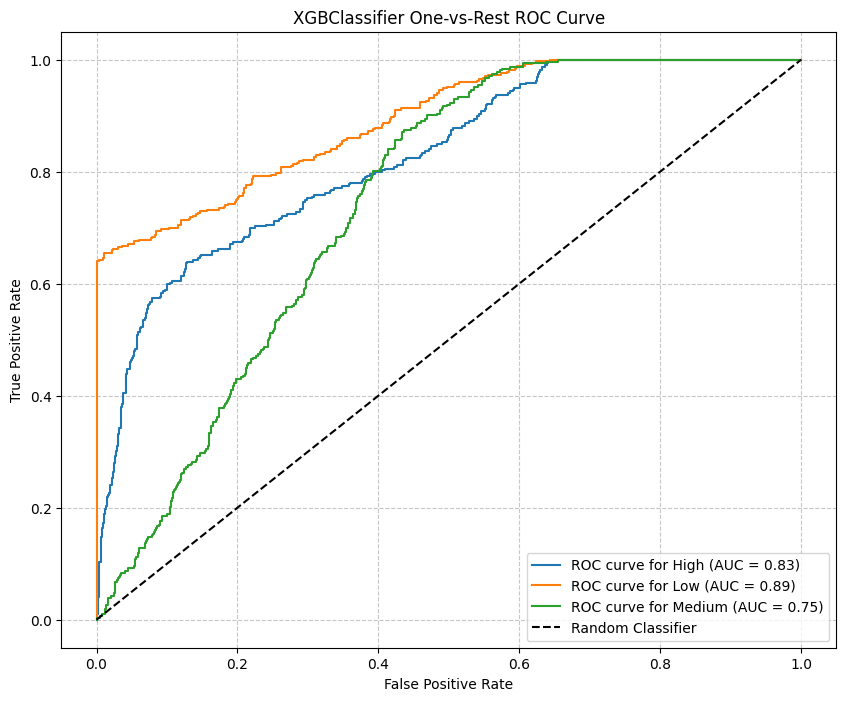


--- Confusion Matrix Visualization ---


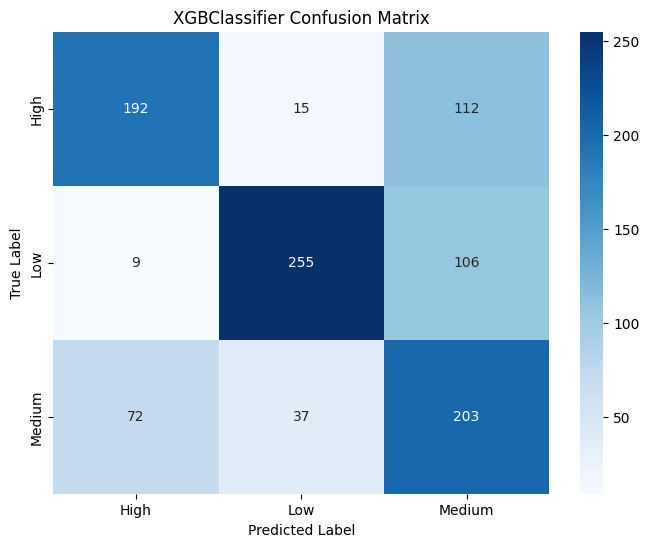

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import LabelBinarizer, LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Encode target labels to numerical values for XGBoost
le_y = LabelEncoder()
y_train_encoded = le_y.fit_transform(y_train)
y_test_encoded = le_y.transform(y_test)

# 2. Initialize an XGBClassifier model with random_state=42
xgb_classifier = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')

# 3. Train the XGBClassifier model using the X_train and y_train_encoded datasets
xgb_classifier.fit(X_train, y_train_encoded)

print("XGBClassifier model trained successfully.")

# 4. Make predictions on the X_test dataset
y_pred_xgb_encoded = xgb_classifier.predict(X_test)
y_pred_xgb = le_y.inverse_transform(y_pred_xgb_encoded) # Inverse transform to get original labels for evaluation

# 5. Calculate and print the overall accuracy, weighted precision, weighted recall, and weighted F1-score
accuracy = accuracy_score(y_test, y_pred_xgb)
precision = precision_score(y_test, y_pred_xgb, average='weighted')
recall = recall_score(y_test, y_pred_xgb, average='weighted')
f1 = f1_score(y_test, y_pred_xgb, average='weighted')

print(
"\n--- XGBClassifier Model Evaluation Metrics ---")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision (weighted): {precision:.4f}")
print(f"Recall (weighted): {recall:.4f}")
print(f"F1-Score (weighted): {f1:.4f}")

# 6. Print the detailed classification_report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_xgb))

# 7. Calculate and print the confusion matrix
cm_xgb = confusion_matrix(y_test, y_pred_xgb)
class_labels_xgb = le_y.classes_ # Get class labels from the LabelEncoder
print("\n--- Confusion Matrix ---")
print(cm_xgb)

# 8. Calculate and print the specificity for each class
print("\n--- Specificity for each class ---")
specificities_xgb = {}
for i, label in enumerate(class_labels_xgb):
    # True Negatives (TN) for class i: sum of all cells not in row i or column i
    TN_i = np.sum(np.delete(np.delete(cm_xgb, i, axis=0), i, axis=1))
    # False Positives (FP) for class i: sum of column i minus the true positive for class i
    FP_i = np.sum(cm_xgb[:, i]) - cm_xgb[i, i]

    specificity_i = TN_i / (TN_i + FP_i) if (TN_i + FP_i) != 0 else 0
    specificities_xgb[label] = specificity_i
    print(f"Specificity for class '{label}': {specificity_i:.4f}")

# 9. Get the predicted probabilities for each class on the test set
y_proba_xgb = xgb_classifier.predict_proba(X_test)

# 10. Binarize y_test for OvR AUC calculation
label_binarizer = LabelBinarizer()
y_test_binarized_xgb = label_binarizer.fit_transform(y_test)

# 11. Calculate and print the OvR ROC AUC score for each class and plot the ROC curve
print("\n--- One-vs-Rest (OvR) ROC AUC Scores ---")
auc_scores_xgb = {}
plt.figure(figsize=(10, 8))
for i, class_label in enumerate(class_labels_xgb):
    # Ensure y_test_binarized_xgb columns match the order of class_labels_xgb
    fpr, tpr, _ = roc_curve(y_test_binarized_xgb[:, i], y_proba_xgb[:, i])
    roc_auc = auc(fpr, tpr)
    auc_scores_xgb[class_label] = roc_auc
    print(f"AUC for class '{class_label}': {roc_auc:.4f}")
    plt.plot(fpr, tpr, label=f'ROC curve for {class_label} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('XGBClassifier One-vs-Rest ROC Curve')
plt.legend(loc='lower right')
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# 12. Visualize the cm_xgb using a heatmap
print("\n--- Confusion Matrix Visualization ---")
plt.figure(figsize=(8, 6))
sns.heatmap(cm_xgb, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels_xgb, yticklabels=class_labels_xgb)
plt.title('XGBClassifier Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

### Comparison of RF and XGB


We will compare the two models based on overall metrics (Accuracy, Precision, Recall, F1-Score) and class-specific performance (Specificity, ROC AUC scores, and insights from Confusion Matrices).

**1. Overall Evaluation Metrics (Weighted Averages):**

| Metric               | Random Forest (RF) Classifier | XGBoost (XGB) Classifier |
| :------------------- | :---------------------------- | :----------------------- |
| **Accuracy**         | `0.6893`                      | `0.6494`                 |
| **Precision**        | `0.7711`                      | `0.6814`                 |
| **Recall**           | `0.6893`                      | `0.6494`                 |
| **F1-Score**         | `0.7009`                      | `0.6578`                 |

**Interpretation:**
Based on the overall weighted average metrics, the **Random Forest Classifier performs better than the XGBoost Classifier**. Random Forest achieves higher accuracy, precision, recall, and F1-score, indicating a stronger overall predictive capability for the spoilage categories on this dataset.

**2. Class-Specific Performance:**

Let's look at the detailed performance for each spoilage category ('High', 'Low', 'Medium').

**Random Forest (RF) Classifier:**

| Class  | Precision | Recall | F1-Score | Support | Specificity | AUC    |
| :----- | :-------- | :----- | :------- | :------ | :---------- | :----- |
| **High** | 0.77      | 0.61   | 0.68     | 319     | 0.9150      | 0.8248 |
| **Low**  | 1.00      | 0.64   | 0.78     | 370     | 0.9984      | 0.8763 |
| **Medium** | 0.51      | 0.83   | 0.63     | 312     | 0.6343      | 0.7633 |

**XGBoost (XGB) Classifier:**

| Class  | Precision | Recall | F1-Score | Support | Specificity | AUC    |
| :----- | :-------- | :----- | :------- | :------ | :---------- | :----- |
| **High** | 0.70      | 0.60   | 0.65     | 319     | 0.8812      | 0.8261 |
| **Low**  | 0.83      | 0.69   | 0.75     | 370     | 0.9176      | 0.8922 |
| **Medium** | 0.48      | 0.65   | 0.55     | 312     | 0.6836      | 0.7455 |

**Class-Specific Interpretation:**

*   **'High' Spoilage:** Random Forest shows slightly better precision (0.77 vs 0.70) and F1-score (0.68 vs 0.65), and higher specificity (0.9150 vs 0.8812). XGBoost has a marginally higher AUC (0.8261 vs 0.8248) for this class, but RF generally seems stronger.
*   **'Low' Spoilage:** Random Forest achieves perfect precision (1.00) for the 'Low' class, meaning every instance it predicted as 'Low' was indeed 'Low'. It also has higher specificity (0.9984 vs 0.9176), indicating it's very good at not misclassifying non-'Low' instances as 'Low'. XGBoost has a slightly higher recall (0.69 vs 0.64) and AUC (0.8922 vs 0.8763) for this class, suggesting it identifies a few more actual 'Low' instances correctly, but at the cost of lower precision. Overall, Random Forest's high precision for 'Low' might be preferred depending on the specific application.
*   **'Medium' Spoilage:** Random Forest has slightly better F1-score (0.63 vs 0.55) and recall (0.83 vs 0.65). XGBoost has higher precision (0.48 vs 0.51) and specificity (0.6836 vs 0.6343). Both models still struggle with this category, as indicated by their lowest scores among the three classes, but RF captures more 'Medium' instances (higher recall).

### Conclusion:

The **Random Forest Classifier** is the better-performing model overall for this classification task. It consistently shows higher weighted average accuracy, precision, recall, and F1-score. While XGBoost has some marginal advantages in recall or AUC for certain classes, Random Forest's performance is more robust across the board, particularly its high precision for the 'Low' spoilage category.

Both models, however, still face challenges in accurately classifying the 'Medium' spoilage category, suggesting that further efforts in hyperparameter tuning, feature engineering, or exploring different class definitions might be beneficial.